## 🌐 Connect Colab to Google Drive

## ⚙️ Import Libraries

In [19]:
import os
from datetime import datetime

import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

import matplotlib.pyplot as plt
%matplotlib inline

np.random.seed(42)
tf.random.set_seed(42)

print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {tfk.__version__}")
print(f"GPU devices: {len(tf.config.list_physical_devices('GPU'))}")

TensorFlow version: 2.16.1
Keras version: 3.3.3
GPU devices: 2


## ⏳ Load the Data (no outlier)

In [20]:
data = np.load("/kaggle/input/no-outlier/cleaned_data.npz")

X_train = data["training_set_filtered"]

y_train = data["masks_filtered"]

X_test = data["test_set"]

print(f"Training X shape: {X_train.shape}")
print(f"Training y shape: {y_train.shape}")
print(f"Test X shape: {X_test.shape}")

Training X shape: (2505, 64, 128)
Training y shape: (2505, 64, 128)
Test X shape: (10022, 64, 128)


### Outliers removed

In [21]:
X_train_images = np.array([x.reshape(64, 128) for x in X_train])
y_train_masks = np.array([y.reshape(64, 128) for y in y_train])

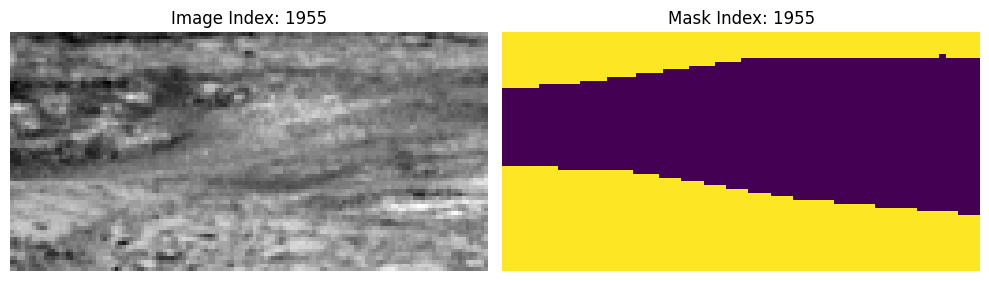

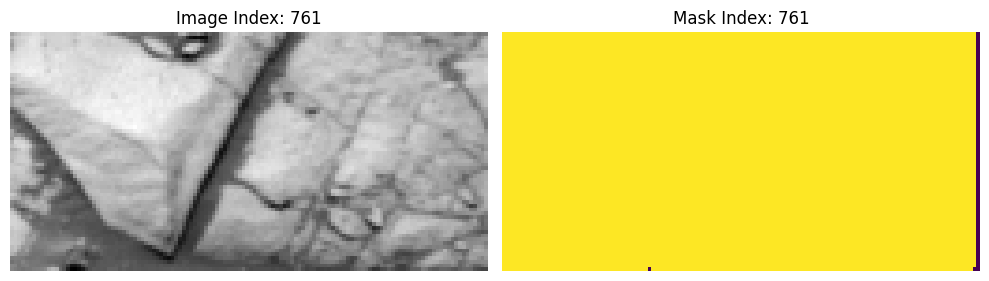

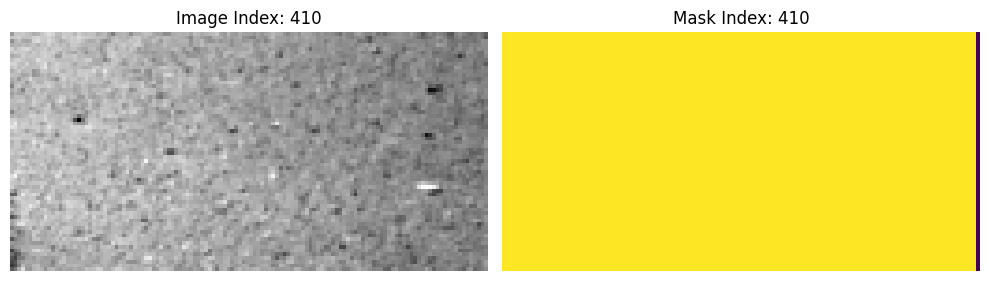

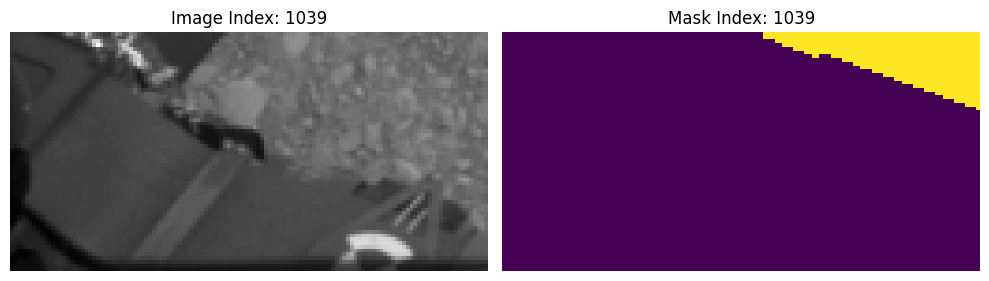

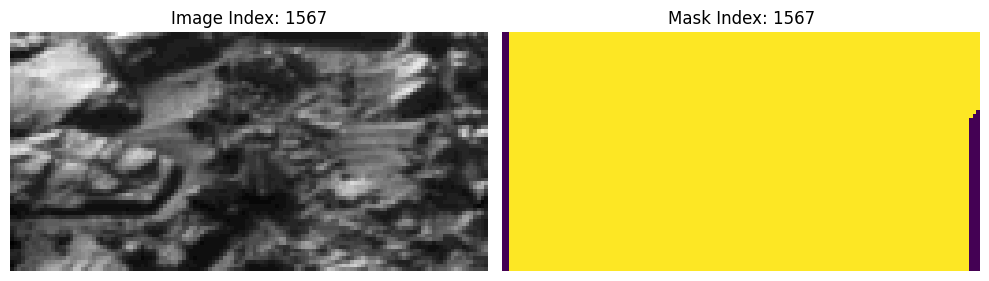

In [22]:
import random

# Visualize random image-mask pairs
for _ in range(5):
    idx = random.randint(0, len(X_train) - 1)
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Display input image
    ax[0].imshow(X_train[idx], cmap="gray")
    ax[0].set_title(f"Image Index: {idx}")
    ax[0].axis("off")

    # Display corresponding mask
    ax[1].imshow(y_train[idx], cmap="viridis")
    ax[1].set_title(f"Mask Index: {idx}")
    ax[1].axis("off")

    plt.tight_layout()
    plt.show()

## 🛠️ Train and Save the Model

In [23]:
# Add color channel and rescale pixels between 0 and 1
X_train = X_train[..., np.newaxis] / 255.0
X_test = X_test[..., np.newaxis] / 255.0

input_shape = X_train.shape[1:]
num_classes = len(np.unique(y_train))

print(f"Input shape: {input_shape}")
print(f"Number of classes: {num_classes}")

Input shape: (64, 128, 1)
Number of classes: 5


In [24]:
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")

X_train shape: (2505, 64, 128, 1)
y_train shape: (2505, 64, 128)


In [25]:
num_classes

5

In [26]:
# Custom callback for visualization
class VisualizeSegmentationCallback(tf.keras.callbacks.Callback):
    def __init__(self, X_train, y_train, num_images=2):
        super().__init__()
        self.X_train = X_train
        self.y_train = y_train
        self.num_images = num_images
        self.selected_indices = []

        # Identify images containing at least 4 classes
        for i in range(len(y_train)):
            if len(np.unique(y_train[i])) >= 4:  # Check for at least 4 classes
                self.selected_indices.append(i)
            if len(self.selected_indices) == num_images:
                break

    def on_epoch_end(self, epoch, logs=None):
        # Plot predictions for the selected images
        fig, axes = plt.subplots(self.num_images, 3, figsize=(15, self.num_images * 5))

        for idx, i in enumerate(self.selected_indices):
            # Extract image and ground truth
            X_sample = self.X_train[i:i + 1]  # Add batch dimension
            y_sample = self.y_train[i]

            # Predict on the image
            predicted_mask = self.model.predict(X_sample)
            predicted_mask = np.argmax(predicted_mask, axis=-1)[0]  # Convert to class labels

            # Visualize the input, ground truth, and predicted mask
            axes[idx, 0].imshow(X_sample[0].squeeze(), cmap="gray")
            axes[idx, 0].set_title("Input Image")
            axes[idx, 0].axis("off")

            axes[idx, 1].imshow(y_sample, cmap="viridis")
            axes[idx, 1].set_title("Ground Truth Mask")
            axes[idx, 1].axis("off")

            axes[idx, 2].imshow(predicted_mask, cmap="viridis")
            axes[idx, 2].set_title(f"Predicted Mask (Epoch {epoch + 1})")
            axes[idx, 2].axis("off")

        plt.tight_layout()
        plt.show()

## Adding advanced tecnics

In [27]:
# Ensure the input shape for both images and masks is correct
X_train = np.squeeze(X_train)  # Remove any singleton dimensions
y_train = np.squeeze(y_train)  # Remove any singleton dimensions

# Check if the channel dimension exists, otherwise add it
if X_train.ndim == 3:  # If missing the channel dimension, add it
    X_train = X_train[..., np.newaxis]

if y_train.ndim == 3:  # Ensure y_train has the correct shape
    y_train = y_train[..., np.newaxis]

print(f"Shape of X_train after reshaping: {X_train.shape}")
print(f"Shape of y_train after reshaping: {y_train.shape}")

Shape of X_train after reshaping: (2505, 64, 128, 1)
Shape of y_train after reshaping: (2505, 64, 128, 1)


In [28]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Ensure the input shape for both images and masks is correct
X_train = np.squeeze(X_train)  # Remove singleton dimensions
if X_train.ndim == 3:  # If missing the channel dimension, add it
    X_train = X_train[..., np.newaxis]

y_train = np.squeeze(y_train)  # Ensure that y_train has the correct shape

print(f"Shape of X_train after reshaping: {X_train.shape}")
print(f"Shape of y_train after reshaping: {y_train.shape}")

# Data Augmentation for Images and Masks
image_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],  # Adjust brightness
)

# Masks should only be flipped or translated without interpolation
mask_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
)

# Ensure y_train has the correct shape for augmentation
y_train = np.expand_dims(y_train, axis=-1)  # Add channel dimension to masks

# Fit augmentations to the data
image_datagen.fit(X_train)
mask_datagen.fit(y_train)

# Create the generators
image_generator = image_datagen.flow(X_train, batch_size=32, seed=42)
mask_generator = mask_datagen.flow(y_train, batch_size=32, seed=42)

train_generator = zip(image_generator, mask_generator)

# Weighted Loss Function for Class Imbalance
def weighted_categorical_crossentropy(weights):
    weights = tf.constant(weights, dtype=tf.float32)

    def loss(y_true, y_pred):
        # Remove the extra dimension from y_true using tf.squeeze
        y_true = tf.squeeze(y_true, axis=-1)

        y_true = tf.one_hot(tf.cast(y_true, tf.int32), depth=len(weights))
        y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1 - tf.keras.backend.epsilon())
        return -tf.reduce_sum(y_true * tf.math.log(y_pred) * weights, axis=-1)

    return loss

# Convert y_train to integers for class count
y_train_int = y_train.astype(np.int32)

# Calculate class weights based on pixel proportions
class_pixel_counts = np.bincount(y_train_int.flatten(), minlength=num_classes)  # Count pixels for each class
total_pixels = np.sum(class_pixel_counts)  # Total number of pixels
class_weights = total_pixels / (class_pixel_counts + 1e-6)  # Inverse frequency
class_weights /= np.sum(class_weights)  # Normalize to sum to 1

print(f"Class pixel counts: {class_pixel_counts}")
print(f"Calculated class weights: {class_weights}")

# Use the calculated weights in the loss function
loss = weighted_categorical_crossentropy(class_weights)

# Define the U-Net Model
def unet_model(input_shape, num_classes):
    inputs = tf.keras.layers.Input(input_shape)

    # Encoder
    c1 = tf.keras.layers.Conv2D(64, (3, 3), activation="relu", padding="same")(inputs)
    c1 = tf.keras.layers.Conv2D(64, (3, 3), activation="relu", padding="same")(c1)
    p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

    c2 = tf.keras.layers.Conv2D(128, (3, 3), activation="relu", padding="same")(p1)
    c2 = tf.keras.layers.Conv2D(128, (3, 3), activation="relu", padding="same")(c2)
    p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

    # Decoder
    u1 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding="same")(c2)
    u1 = tf.keras.layers.concatenate([u1, c1])
    c3 = tf.keras.layers.Conv2D(64, (3, 3), activation="relu", padding="same")(u1)
    c3 = tf.keras.layers.Conv2D(64, (3, 3), activation="relu", padding="same")(c3)

    outputs = tf.keras.layers.Conv2D(num_classes, (1, 1), activation="softmax")(c3)
    return tf.keras.Model(inputs, outputs)

# Initialize the model
input_shape = X_train.shape[1:]
model = unet_model(input_shape, num_classes)
model.compile(optimizer="adam", loss=loss, metrics=["accuracy"])
model.summary()

# Updated EarlyStopping with min_delta to ignore minimal improvements
early_stopping = EarlyStopping(
    monitor="loss",  # Monitor loss instead of validation loss
    patience=15,
    restore_best_weights=True,
    min_delta=1e-4  # Minimum change to qualify as an improvement
)

model_checkpoint = ModelCheckpoint(
    filepath="best_model.keras",
    monitor="loss",  # Monitor loss instead of validation loss
    save_best_only=True,
    mode="min",
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor="loss",  # Monitor loss instead of validation loss
    factor=0.5,
    patience=5,
    verbose=1,
    mode="min",
    min_lr=1e-6
)

# Visualization Callback for Two Images with At Least 4 Classes
visualize_callback = VisualizeSegmentationCallback(X_train, y_train, num_images=2)

# Custom Data Generator
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, image_datagen, mask_datagen, X_train, y_train, batch_size):
        self.image_datagen = image_datagen
        self.mask_datagen = mask_datagen
        self.X_train = X_train
        self.y_train = y_train
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.X_train) / float(self.batch_size)))

    def __getitem__(self, idx):
      # Get the batch indices
      batch_x = self.X_train[idx * self.batch_size:(idx + 1) * self.batch_size]
      batch_y = self.y_train[idx * self.batch_size:(idx + 1) * self.batch_size]

      # Apply augmentation
      # Use __next__() instead of next() for NumpyArrayIterator
      image_batch = self.image_datagen.flow(batch_x, batch_size=self.batch_size, shuffle=False).__next__()
      mask_batch = self.mask_datagen.flow(batch_y, batch_size=self.batch_size, shuffle=False).__next__()

      return image_batch, mask_batch  # Return image and mask batches


Shape of X_train after reshaping: (2505, 64, 128, 1)
Shape of y_train after reshaping: (2505, 64, 128)
Class pixel counts: [4988826 6957538 4776810 3770823   26963]
Calculated class weights: [0.00528795 0.00379166 0.00552265 0.00699599 0.97840175]


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 64, 128,   │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_36 (Conv2D)  │ (None, 64, 128,   │        640 │ input_layer_3[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_37 (Conv2D)  │ (None, 64, 128,   │     36,928 │ conv2d_36[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_7     │ (None, 32, 64,    │          0 │ conv2d_37[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_38 (Conv2D)  │ (None, 32, 64,    │     73,856 │ max_pooling2d_7[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_39 (Conv2D)  │ (None, 32, 64,    │    147,584 │ conv2d_38[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_5  │ (None, 64, 128,   │     32,832 │ conv2d_39[0][0]   │
│ (Conv2DTranspose)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_5       │ (None, 64, 128,   │          0 │ conv2d_transpose… │
│ (Concatenate)       │ 128)              │            │ conv2d_37[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_40 (Conv2D)  │ (None, 64, 128,   │     73,792 │ concatenate_5[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_41 (Conv2D)  │ (None, 64, 128,   │     36,928 │ conv2d_40[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_42 (Conv2D)  │ (None, 64, 128,   │        325 │ conv2d_41[0][0]   │
│                     │ 5)                │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 402,885 (1.54 MB)

 Trainable params: 402,885 (1.54 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 64, 128,   │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_43 (Conv2D)  │ (None, 64, 128,   │        640 │ input_layer_4[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_44 (Conv2D)  │ (None, 64, 128,   │     36,928 │ conv2d_43[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_45 (Conv2D)  │ (None, 64, 128,   │        128 │ input_layer_4[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_7 (Add)         │ (None, 64, 128,   │          0 │ conv2d_44[0][0],  │
│                     │ 64)               │            │ conv2d_45[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 32, 64,    │          0 │ add_7[0][0]       │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_46 (Conv2D)  │ (None, 32, 64,    │     73,856 │ max_pooling2d_9[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_47 (Conv2D)  │ (None, 32, 64,    │    147,584 │ conv2d_46[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_48 (Conv2D)  │ (None, 32, 64,    │      8,320 │ max_pooling2d_9[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_8 (Add)         │ (None, 32, 64,    │          0 │ conv2d_47[0][0],  │
│                     │ 128)              │            │ conv2d_48[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_10    │ (None, 16, 32,    │          0 │ add_8[0][0]       │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_49 (Conv2D)  │ (None, 16, 32,    │    295,168 │ max_pooling2d_10… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_50 (Conv2D)  │ (None, 16, 32,    │    590,080 │ conv2d_49[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_51 (Conv2D)  │ (None, 16, 32,    │     33,024 │ max_pooling2d_10… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_9 (Add)         │ (None, 16, 32,    │          0 │ conv2d_50[0][0],  │
│                     │ 256)              │            │ conv2d_51[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_11    │ (None, 8, 16,     │          0 │ add_9[0][0]       │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_52 (Conv2D)  │ (None, 8, 16,     │  1,180,160 │ max_pooling2d_11

 Total params: 8,041,989 (30.68 MB)

 Trainable params: 8,041,989 (30.68 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step - accuracy: 0.1979 - loss: 0.6900
Epoch 1: loss improved from inf to 0.69044, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 525ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


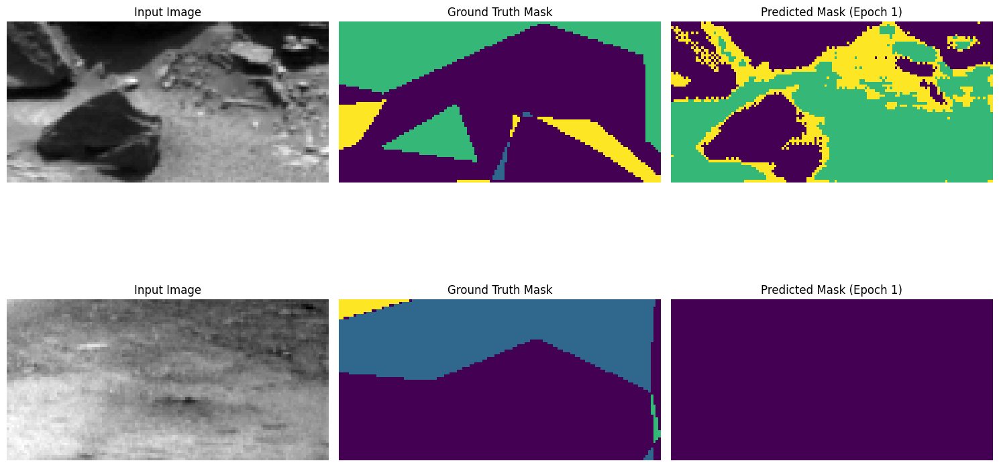

79/79 ━━━━━━━━━━━━━━━━━━━━ 25s 220ms/step - accuracy: 0.1980 - loss: 0.6900 - learning_rate: 0.0010
Epoch 2/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.2643 - loss: 0.6896
Epoch 2: loss improved from 0.69044 to 0.69005, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


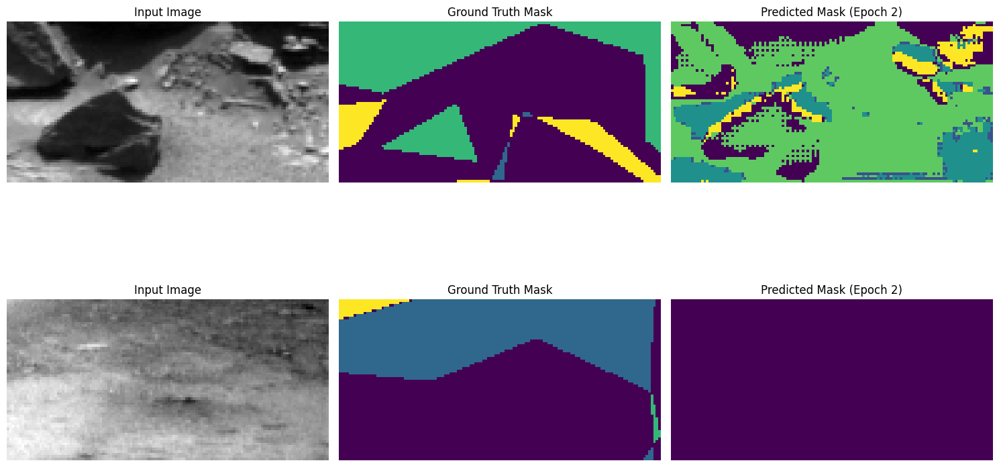

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 180ms/step - accuracy: 0.2643 - loss: 0.6896 - learning_rate: 0.0010
Epoch 3/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.2983 - loss: 0.6891
Epoch 3: loss improved from 0.69005 to 0.68966, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


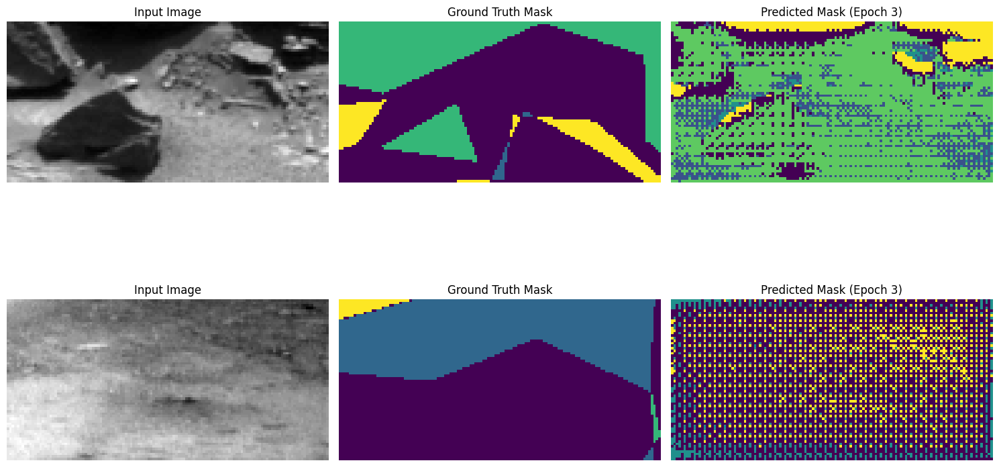

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.2982 - loss: 0.6891 - learning_rate: 0.0010
Epoch 4/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.3199 - loss: 0.6887
Epoch 4: loss improved from 0.68966 to 0.68912, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


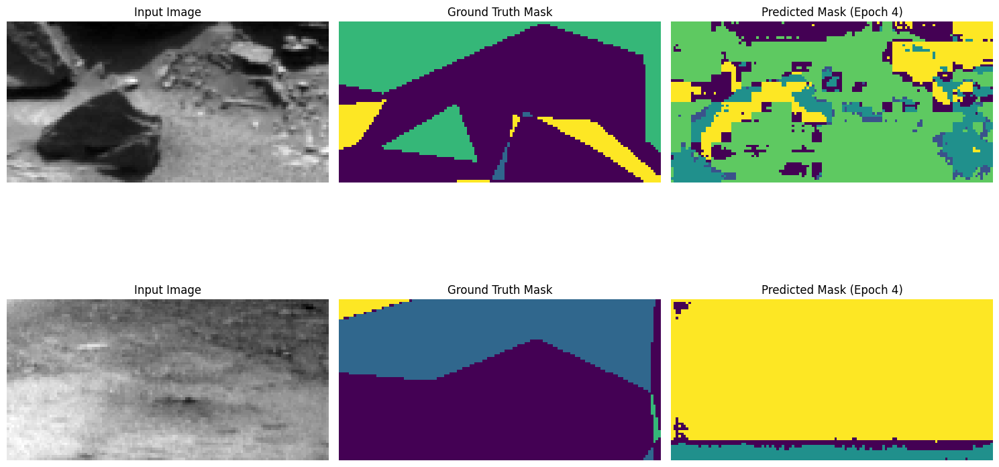

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 174ms/step - accuracy: 0.3196 - loss: 0.6887 - learning_rate: 0.0010
Epoch 5/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.3602 - loss: 0.6879
Epoch 5: loss improved from 0.68912 to 0.68845, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


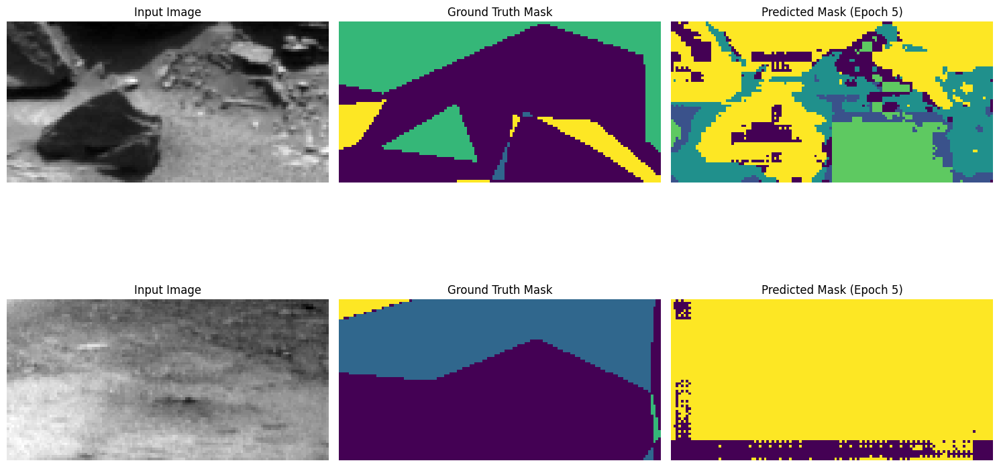

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.3600 - loss: 0.6879 - learning_rate: 0.0010
Epoch 6/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.3756 - loss: 0.6878
Epoch 6: loss improved from 0.68845 to 0.68826, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


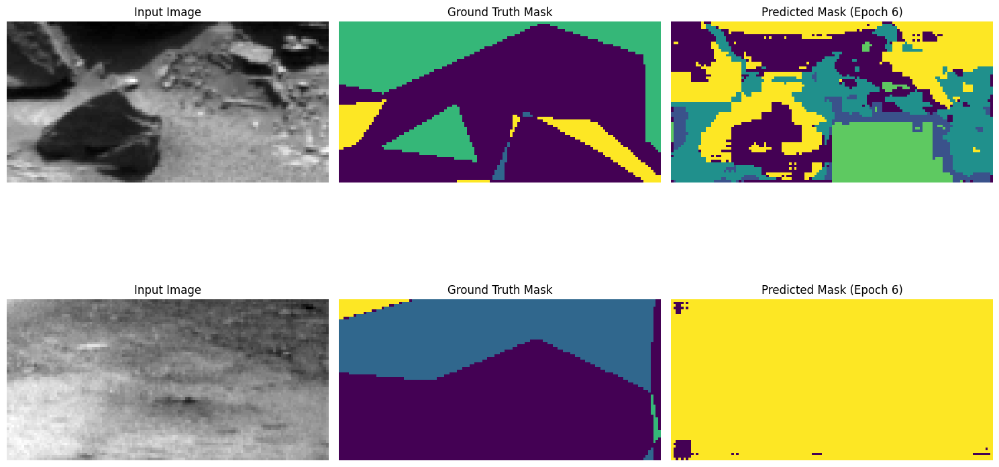

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.3755 - loss: 0.6878 - learning_rate: 0.0010
Epoch 7/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.3905 - loss: 0.6876
Epoch 7: loss improved from 0.68826 to 0.68808, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


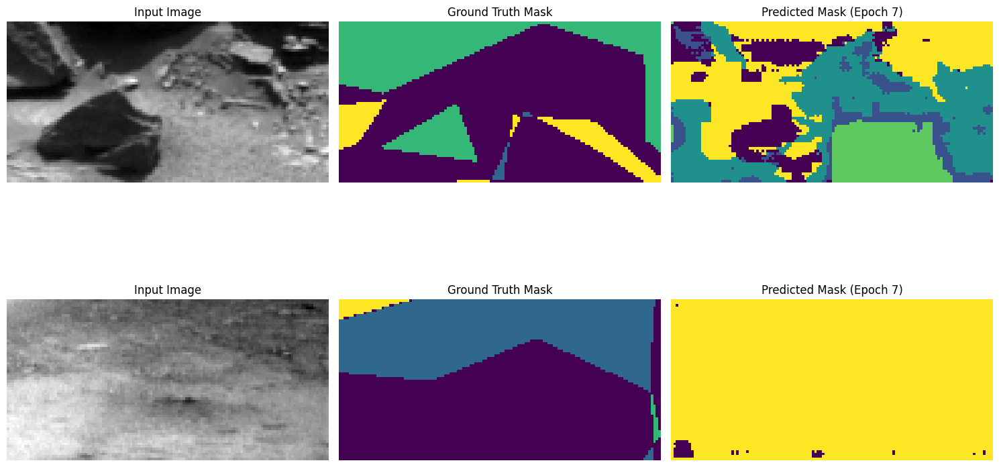

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 179ms/step - accuracy: 0.3903 - loss: 0.6876 - learning_rate: 0.0010
Epoch 8/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.4049 - loss: 0.6875
Epoch 8: loss improved from 0.68808 to 0.68801, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


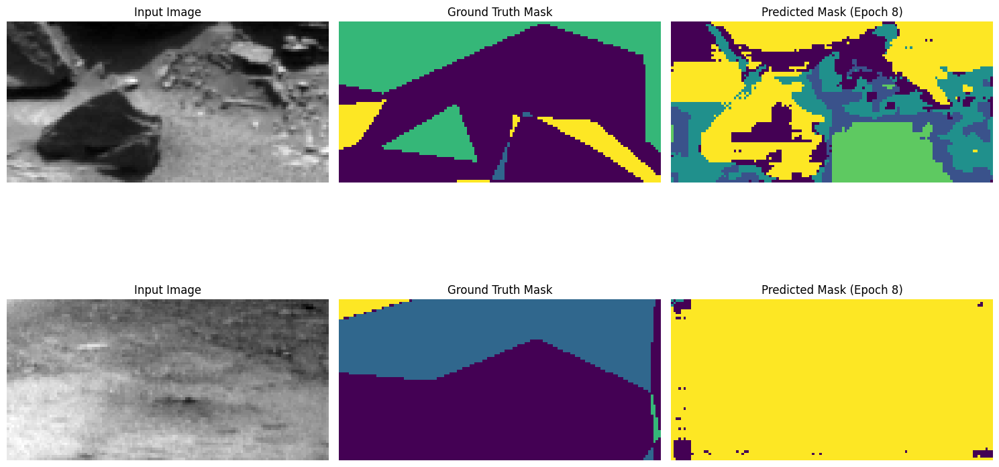

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.4047 - loss: 0.6875 - learning_rate: 0.0010
Epoch 9/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.3927 - loss: 0.6875
Epoch 9: loss improved from 0.68801 to 0.68797, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


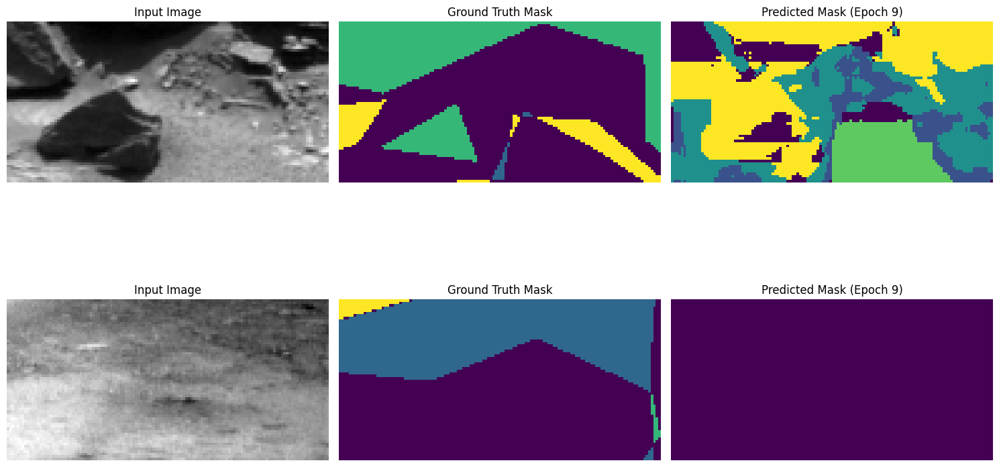

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.3926 - loss: 0.6875 - learning_rate: 0.0010
Epoch 10/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.4153 - loss: 0.6872
Epoch 10: loss improved from 0.68797 to 0.68786, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


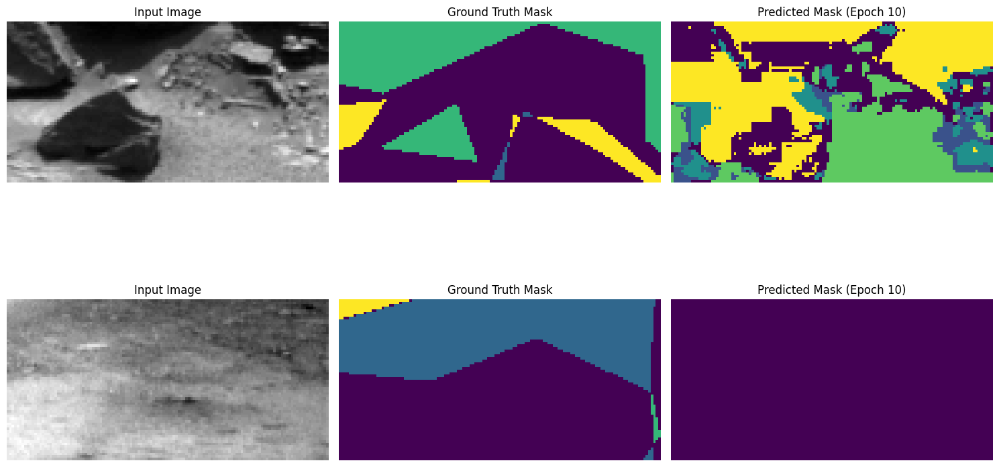

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 181ms/step - accuracy: 0.4150 - loss: 0.6873 - learning_rate: 0.0010
Epoch 11/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.4048 - loss: 0.6872
Epoch 11: loss improved from 0.68786 to 0.68763, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


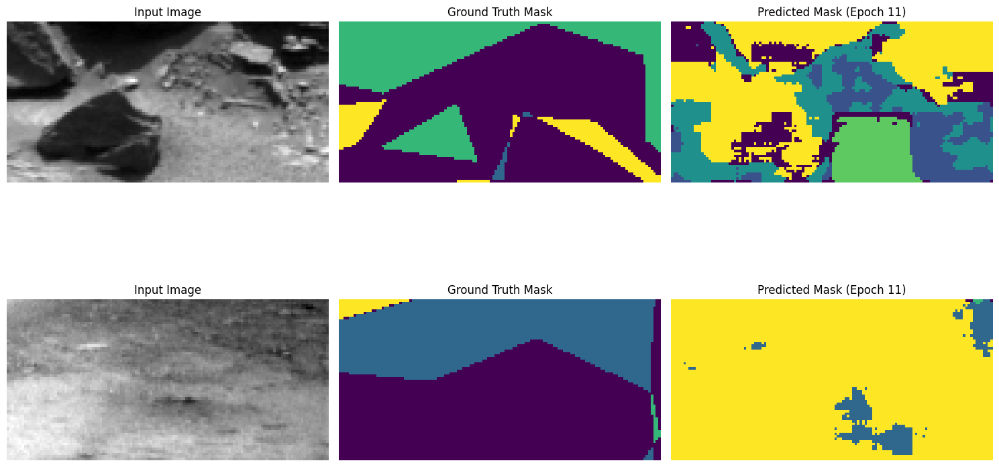

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.4049 - loss: 0.6872 - learning_rate: 0.0010
Epoch 12/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.4428 - loss: 0.6870
Epoch 12: loss improved from 0.68763 to 0.68740, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


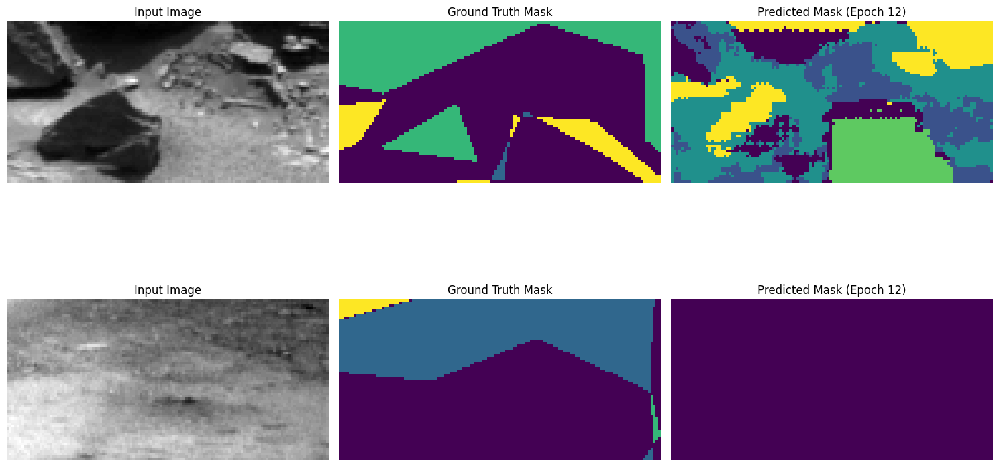

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.4427 - loss: 0.6870 - learning_rate: 0.0010
Epoch 13/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.4475 - loss: 0.6868
Epoch 13: loss improved from 0.68740 to 0.68721, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


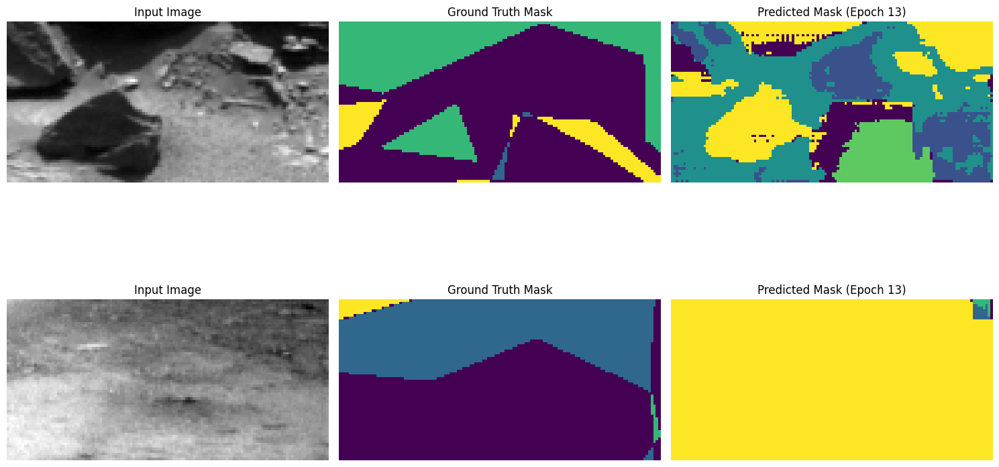

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.4475 - loss: 0.6868 - learning_rate: 0.0010
Epoch 14/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.4537 - loss: 0.6868
Epoch 14: loss did not improve from 0.68721
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


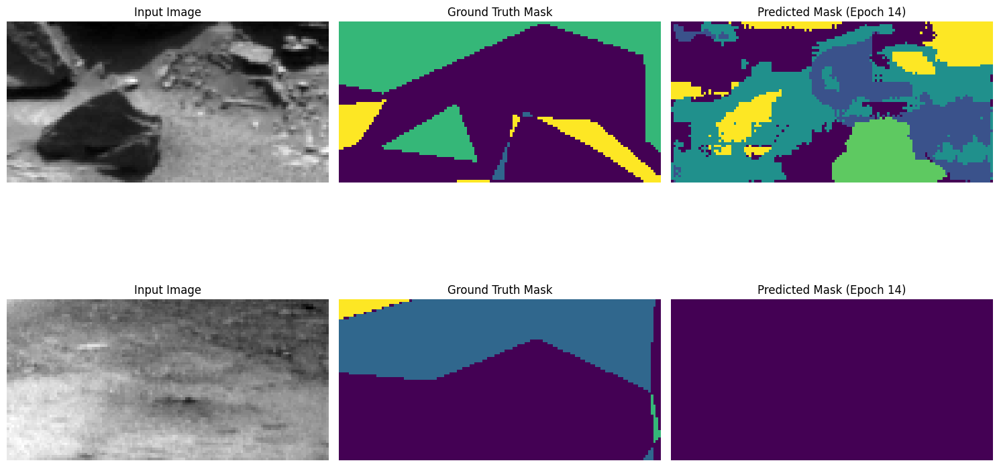

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - accuracy: 0.4535 - loss: 0.6868 - learning_rate: 0.0010
Epoch 15/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.4871 - loss: 0.6865
Epoch 15: loss improved from 0.68721 to 0.68693, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


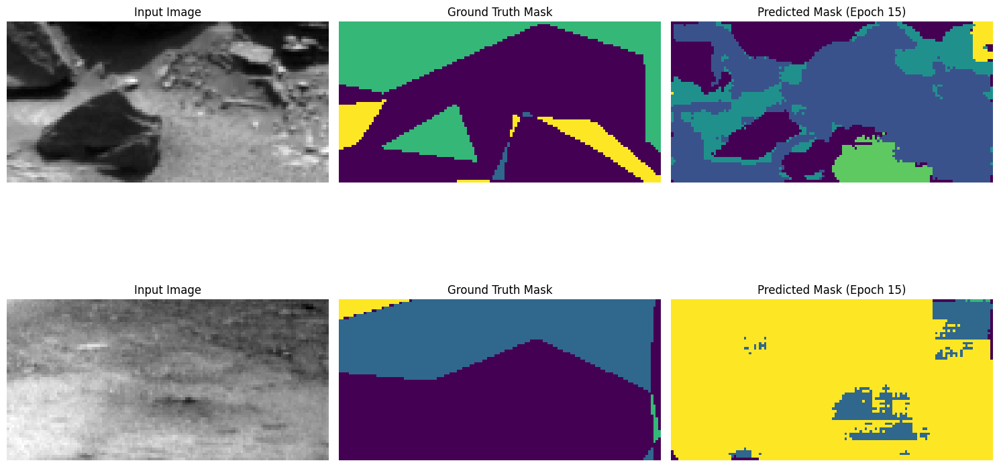

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.4869 - loss: 0.6865 - learning_rate: 0.0010
Epoch 16/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.4132 - loss: 0.6878
Epoch 16: loss did not improve from 0.68693
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


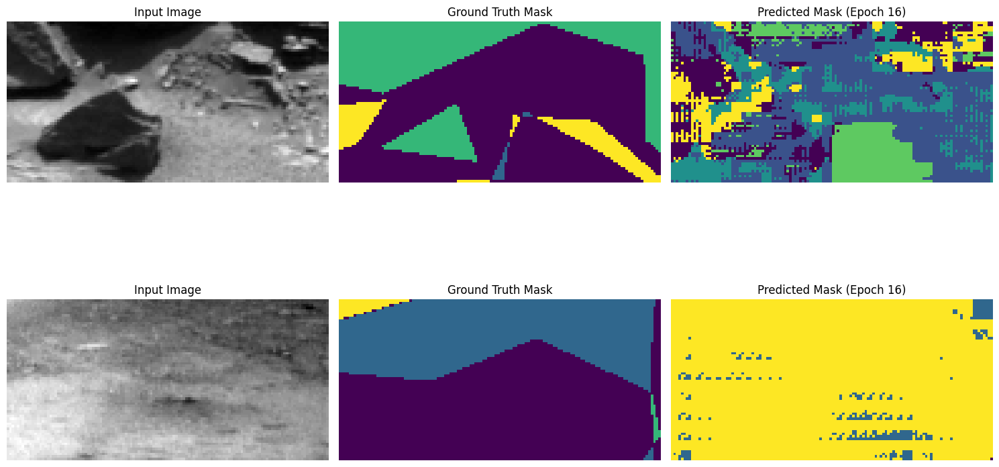

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 171ms/step - accuracy: 0.4128 - loss: 0.6878 - learning_rate: 0.0010
Epoch 17/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.4156 - loss: 0.6871
Epoch 17: loss did not improve from 0.68693
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


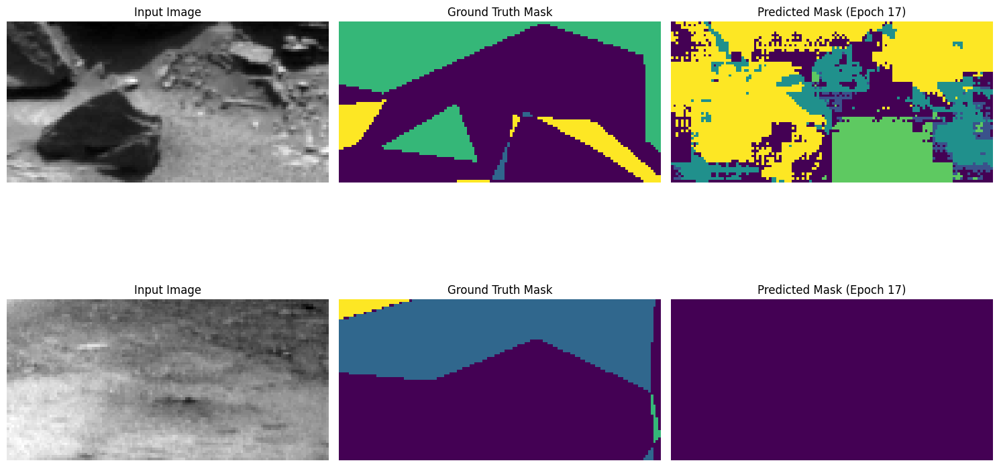

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - accuracy: 0.4153 - loss: 0.6871 - learning_rate: 0.0010
Epoch 18/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.4369 - loss: 0.6867
Epoch 18: loss did not improve from 0.68693
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


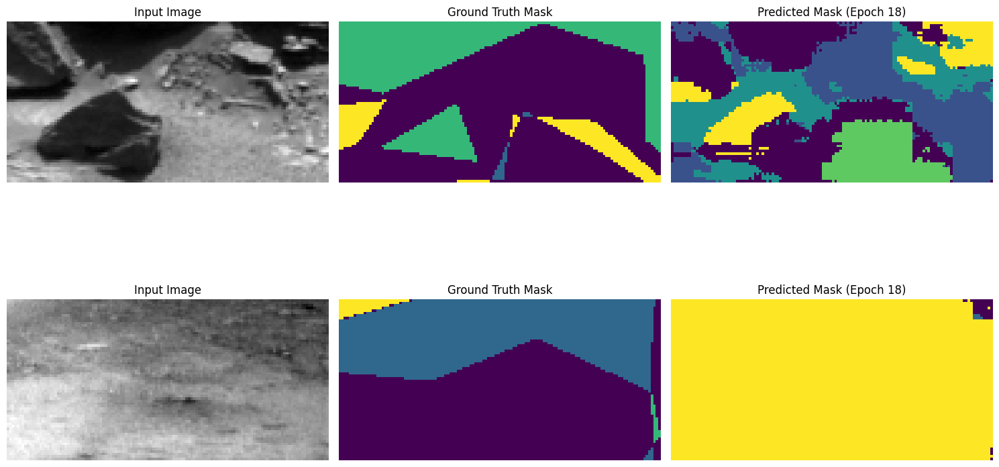

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 168ms/step - accuracy: 0.4371 - loss: 0.6867 - learning_rate: 0.0010
Epoch 19/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.5096 - loss: 0.6862
Epoch 19: loss improved from 0.68693 to 0.68667, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


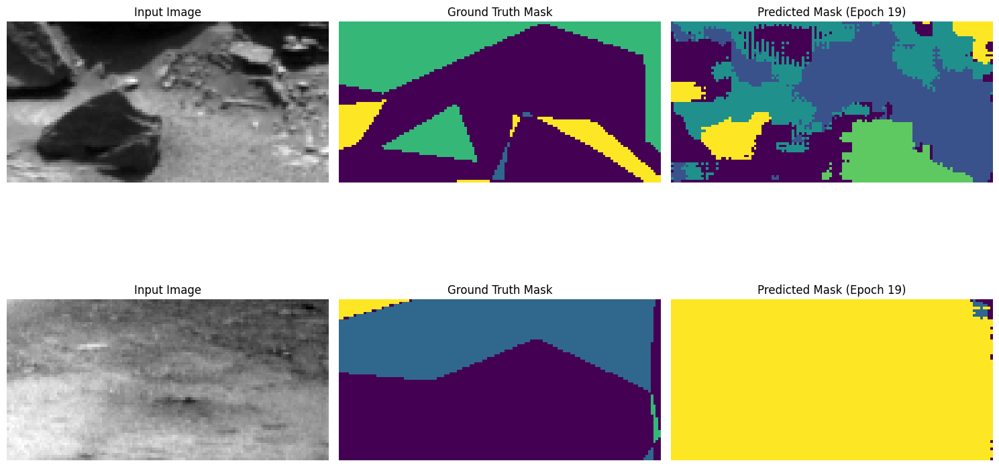

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 175ms/step - accuracy: 0.5096 - loss: 0.6863 - learning_rate: 0.0010
Epoch 20/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.4977 - loss: 0.6864
Epoch 20: loss did not improve from 0.68667
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


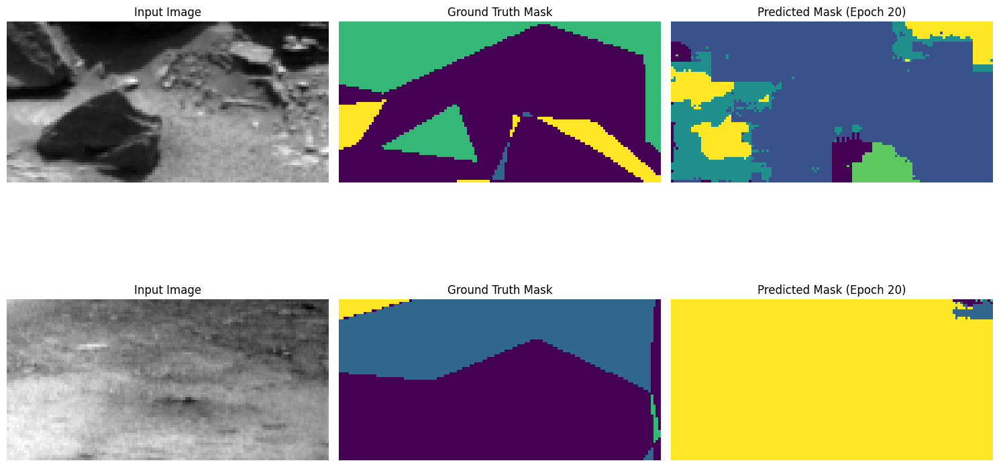

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - accuracy: 0.4975 - loss: 0.6864 - learning_rate: 0.0010
Epoch 21/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.5083 - loss: 0.6861
Epoch 21: loss improved from 0.68667 to 0.68638, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


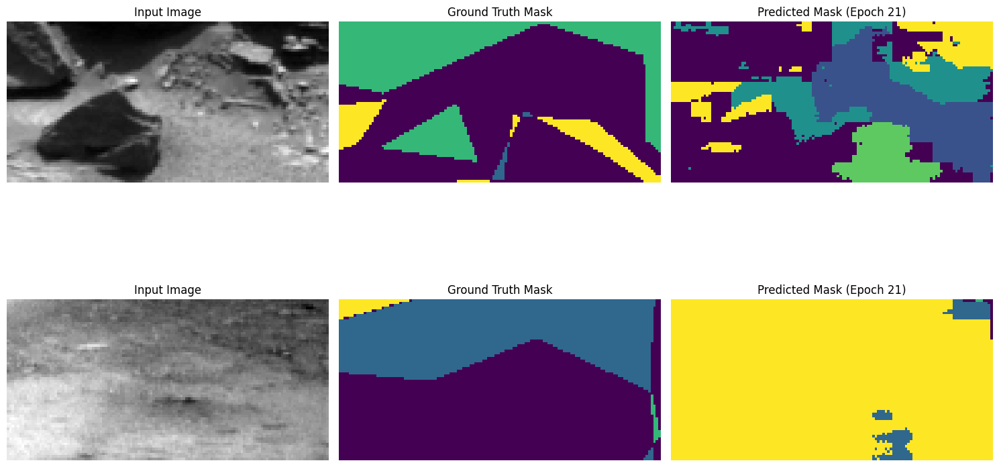

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 180ms/step - accuracy: 0.5084 - loss: 0.6861 - learning_rate: 0.0010
Epoch 22/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.5287 - loss: 0.6859
Epoch 22: loss did not improve from 0.68638
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


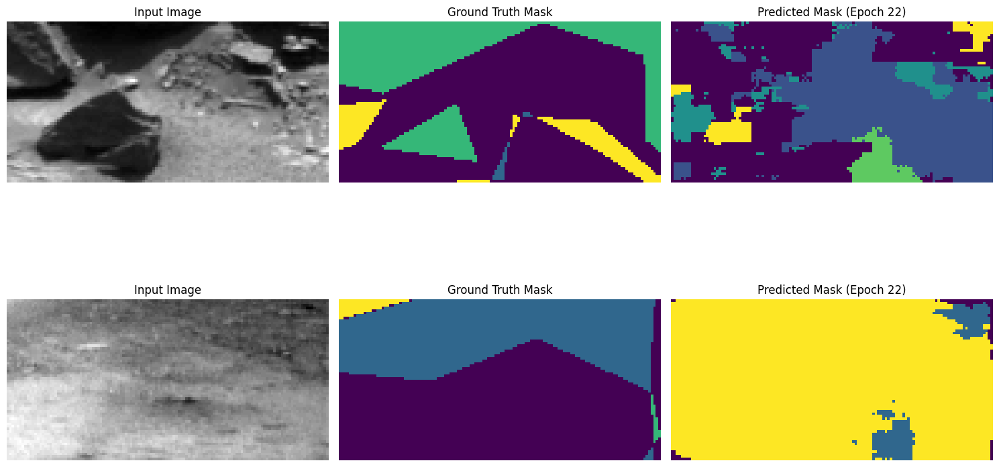

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - accuracy: 0.5285 - loss: 0.6859 - learning_rate: 0.0010
Epoch 23/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.5343 - loss: 0.6857
Epoch 23: loss improved from 0.68638 to 0.68604, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


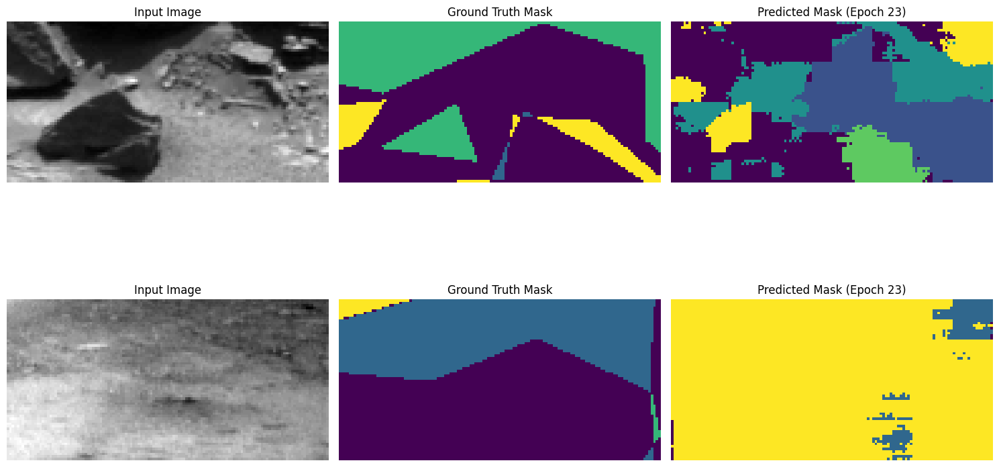

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.5344 - loss: 0.6857 - learning_rate: 0.0010
Epoch 24/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.5634 - loss: 0.6853
Epoch 24: loss improved from 0.68604 to 0.68570, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


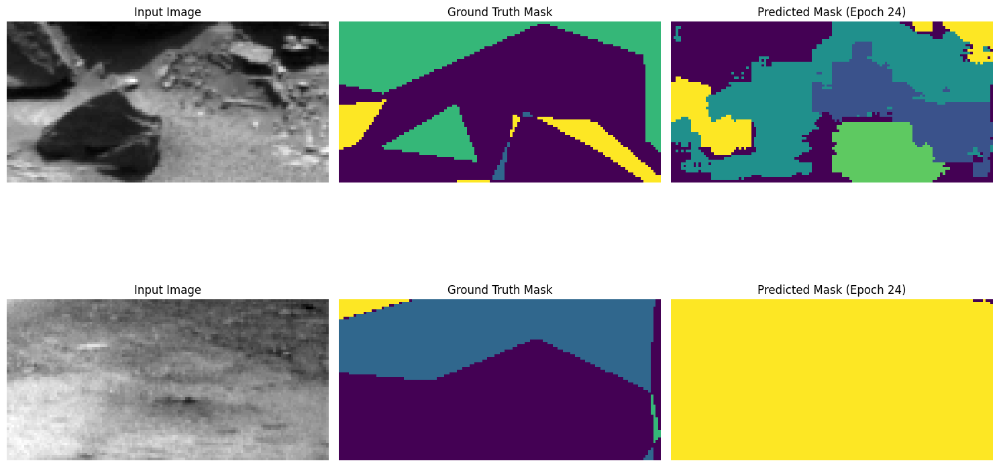

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.5635 - loss: 0.6853 - learning_rate: 0.0010
Epoch 25/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.5454 - loss: 0.6857
Epoch 25: loss did not improve from 0.68570
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


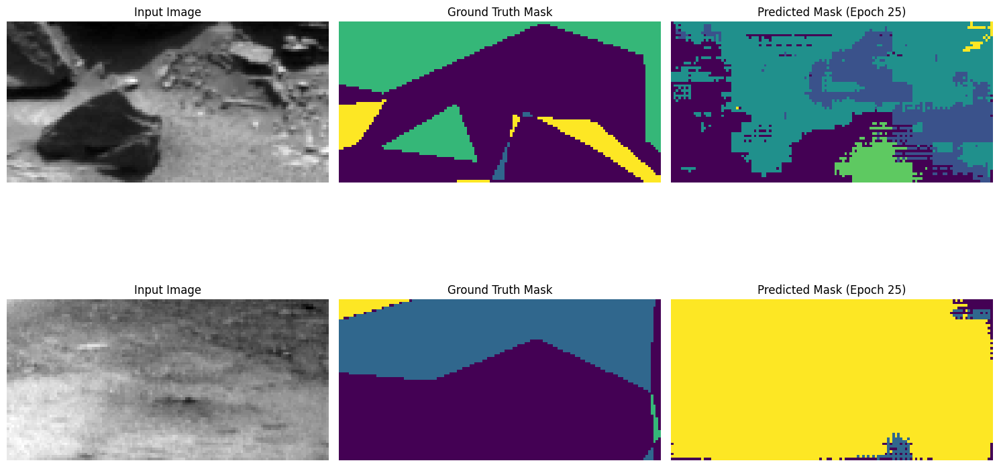

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 169ms/step - accuracy: 0.5448 - loss: 0.6857 - learning_rate: 0.0010
Epoch 26/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.5222 - loss: 0.6863
Epoch 26: loss did not improve from 0.68570
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


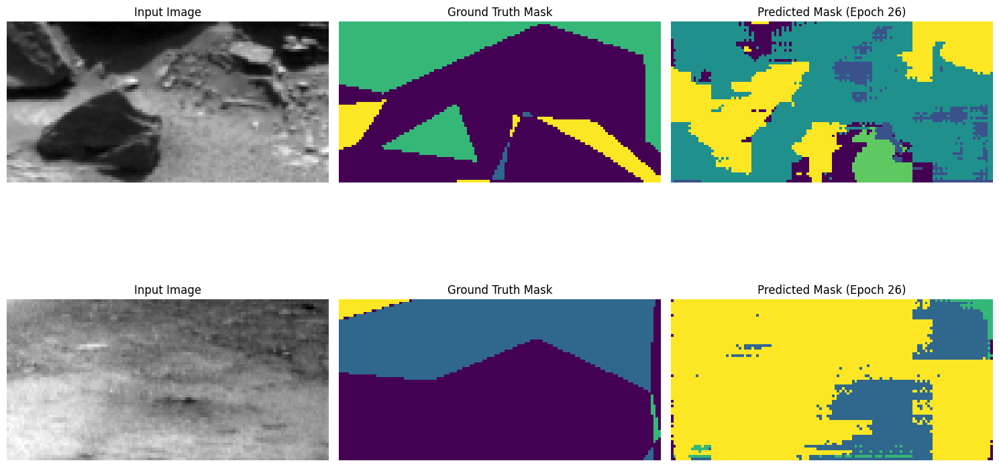

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 169ms/step - accuracy: 0.5222 - loss: 0.6863 - learning_rate: 0.0010
Epoch 27/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.5243 - loss: 0.6858
Epoch 27: loss did not improve from 0.68570
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


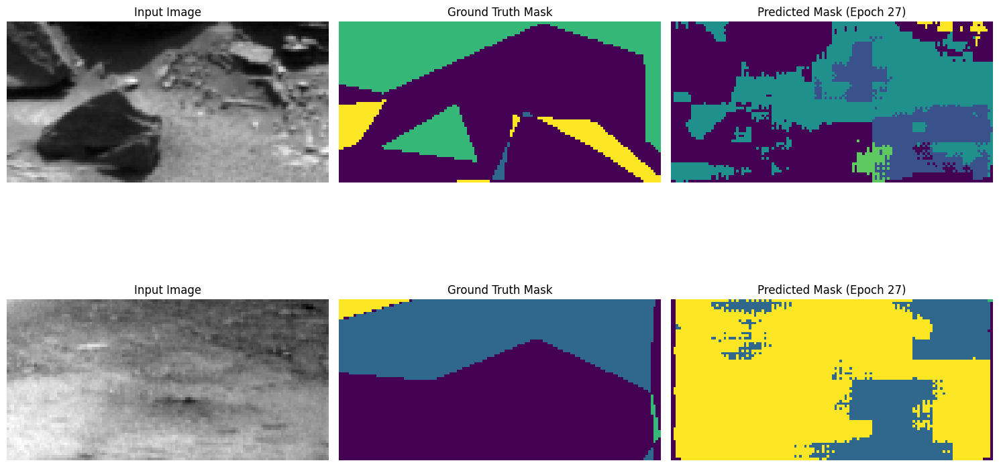

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - accuracy: 0.5246 - loss: 0.6858 - learning_rate: 0.0010
Epoch 28/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.5622 - loss: 0.6853
Epoch 28: loss improved from 0.68570 to 0.68562, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


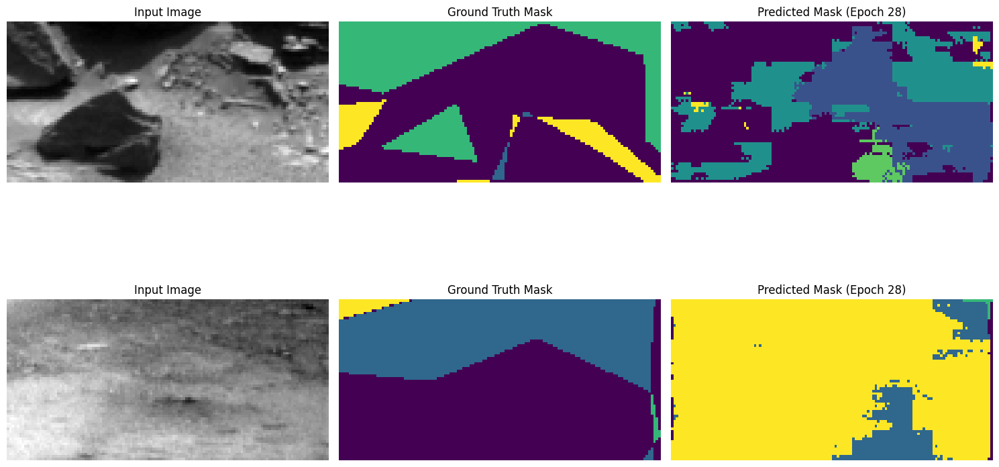

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 174ms/step - accuracy: 0.5623 - loss: 0.6853 - learning_rate: 0.0010
Epoch 29/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.6158 - loss: 0.6847
Epoch 29: loss improved from 0.68562 to 0.68517, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


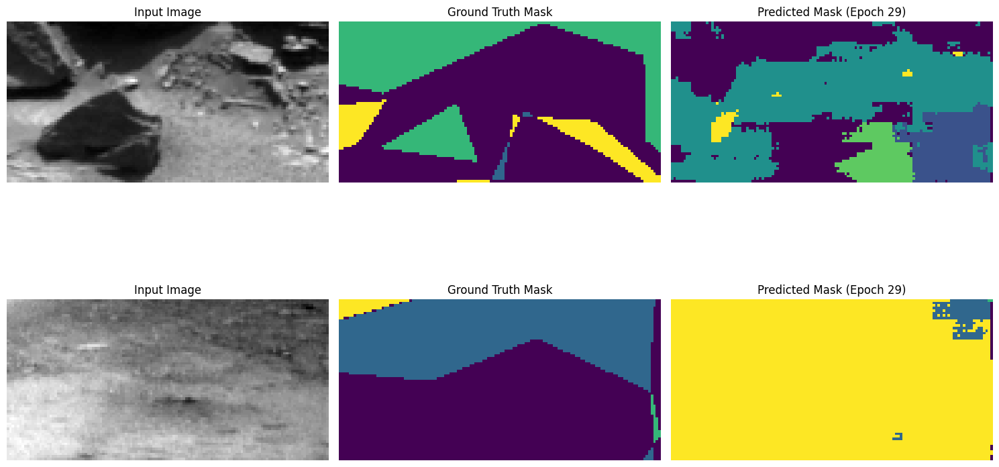

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.6159 - loss: 0.6847 - learning_rate: 0.0010
Epoch 30/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.6223 - loss: 0.6845
Epoch 30: loss improved from 0.68517 to 0.68484, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


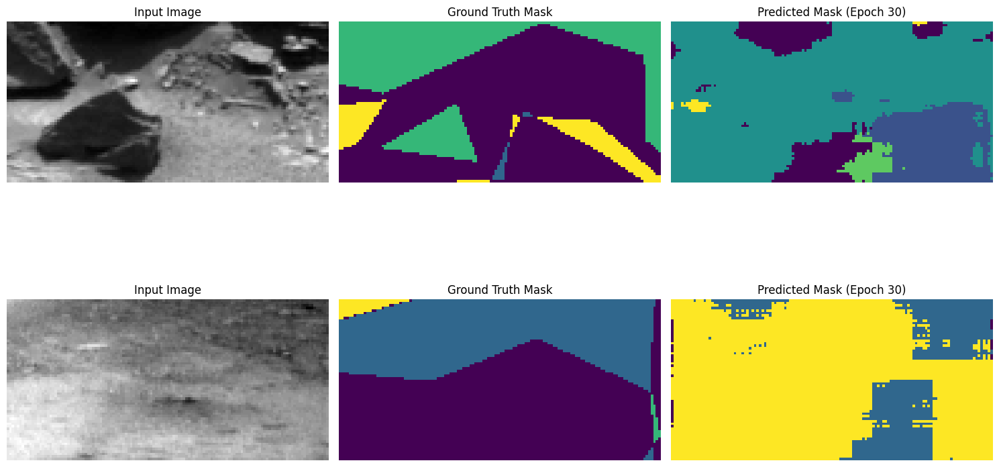

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.6225 - loss: 0.6845 - learning_rate: 0.0010
Epoch 31/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.6444 - loss: 0.6844
Epoch 31: loss improved from 0.68484 to 0.68481, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


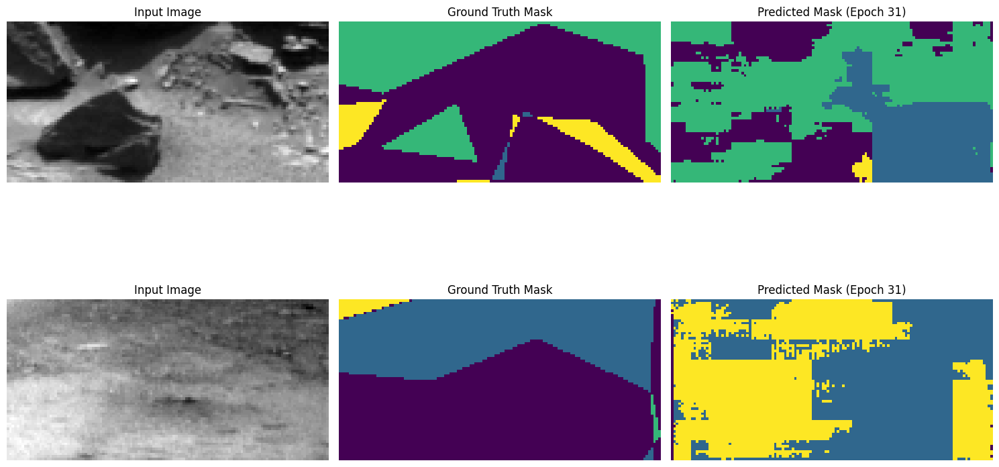

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 180ms/step - accuracy: 0.6444 - loss: 0.6844 - learning_rate: 0.0010
Epoch 32/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.6564 - loss: 0.6843
Epoch 32: loss improved from 0.68481 to 0.68458, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


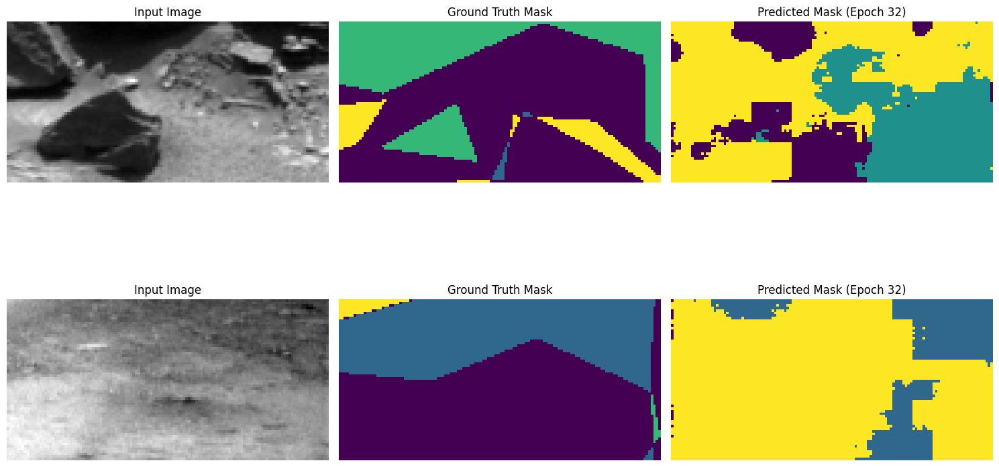

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.6565 - loss: 0.6843 - learning_rate: 0.0010
Epoch 33/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.6626 - loss: 0.6841
Epoch 33: loss improved from 0.68458 to 0.68454, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


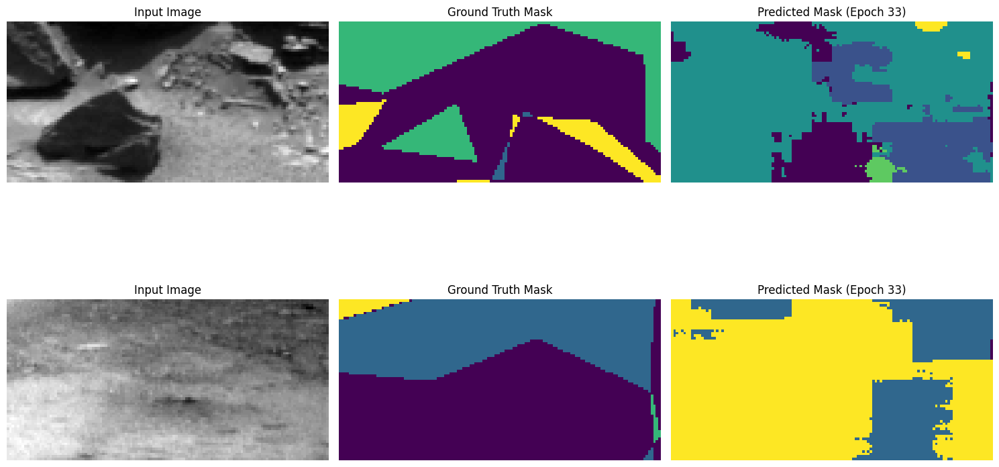

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.6627 - loss: 0.6841 - learning_rate: 0.0010
Epoch 34/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.6606 - loss: 0.6842
Epoch 34: loss improved from 0.68454 to 0.68448, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


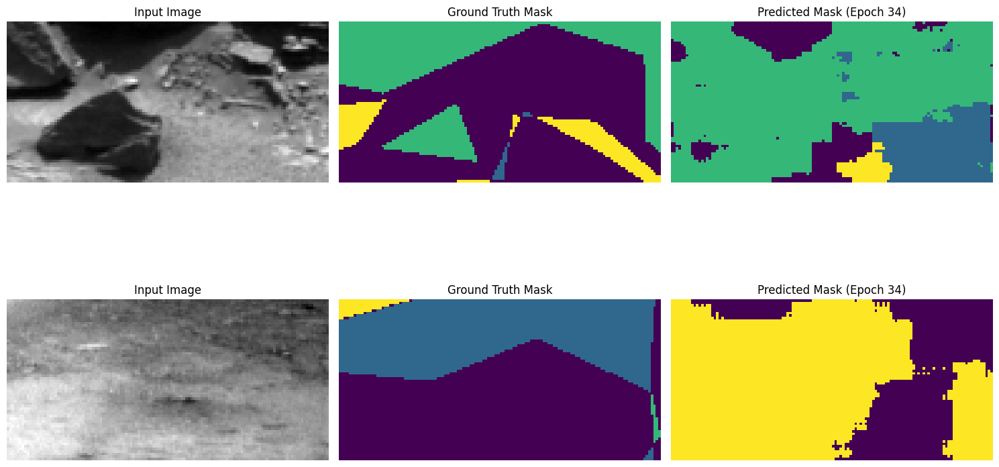

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 175ms/step - accuracy: 0.6607 - loss: 0.6842 - learning_rate: 0.0010
Epoch 35/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.6737 - loss: 0.6840
Epoch 35: loss improved from 0.68448 to 0.68424, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


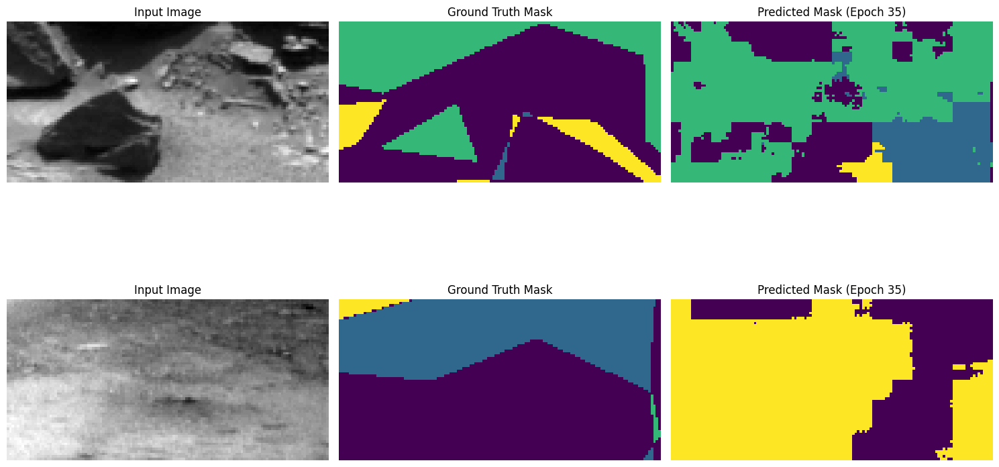

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 175ms/step - accuracy: 0.6738 - loss: 0.6840 - learning_rate: 0.0010
Epoch 36/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.6868 - loss: 0.6838
Epoch 36: loss improved from 0.68424 to 0.68419, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


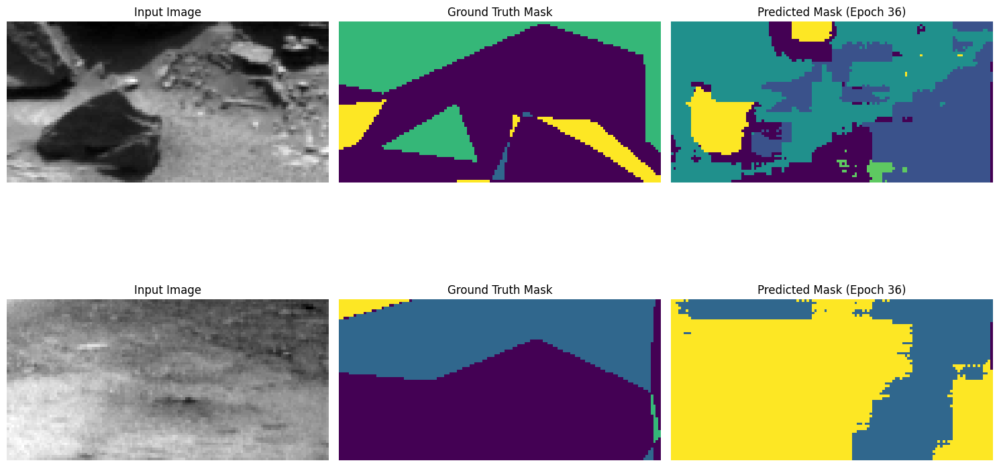

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.6869 - loss: 0.6838 - learning_rate: 0.0010
Epoch 37/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.6293 - loss: 0.6847
Epoch 37: loss did not improve from 0.68419
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


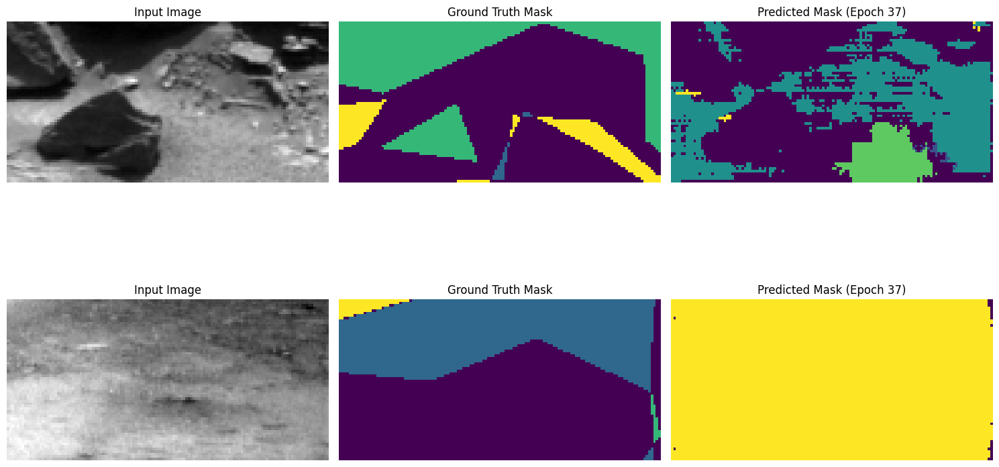

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - accuracy: 0.6289 - loss: 0.6847 - learning_rate: 0.0010
Epoch 38/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.5928 - loss: 0.6855
Epoch 38: loss did not improve from 0.68419
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


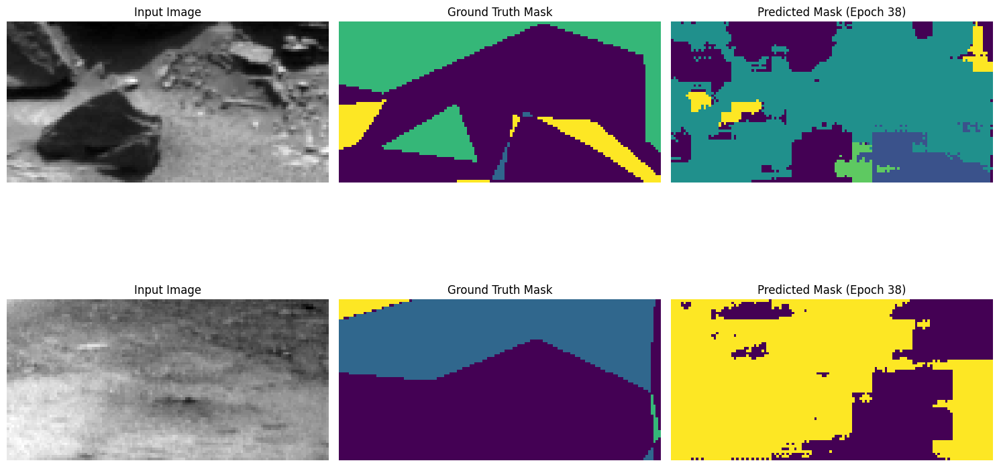

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - accuracy: 0.5931 - loss: 0.6855 - learning_rate: 0.0010
Epoch 39/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.6681 - loss: 0.6841
Epoch 39: loss did not improve from 0.68419
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


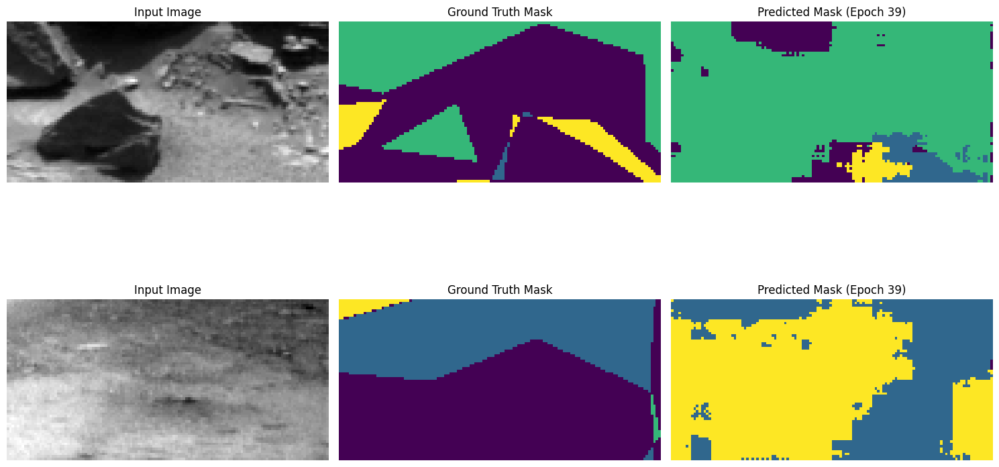

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - accuracy: 0.6682 - loss: 0.6841 - learning_rate: 0.0010
Epoch 40/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.6859 - loss: 0.6839
Epoch 40: loss did not improve from 0.68419

Epoch 40: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


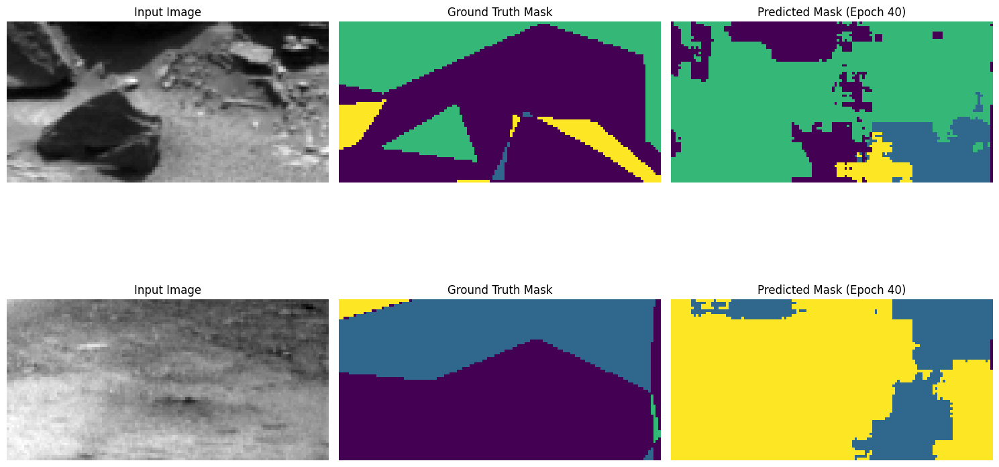

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - accuracy: 0.6860 - loss: 0.6839 - learning_rate: 0.0010
Epoch 41/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.6983 - loss: 0.6838
Epoch 41: loss did not improve from 0.68419
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


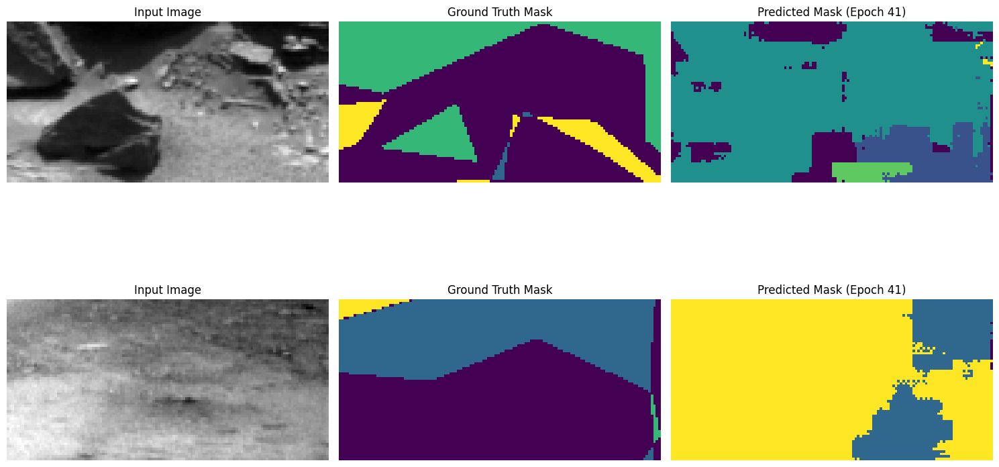

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - accuracy: 0.6983 - loss: 0.6838 - learning_rate: 5.0000e-04
Epoch 42/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7019 - loss: 0.6838
Epoch 42: loss improved from 0.68419 to 0.68408, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


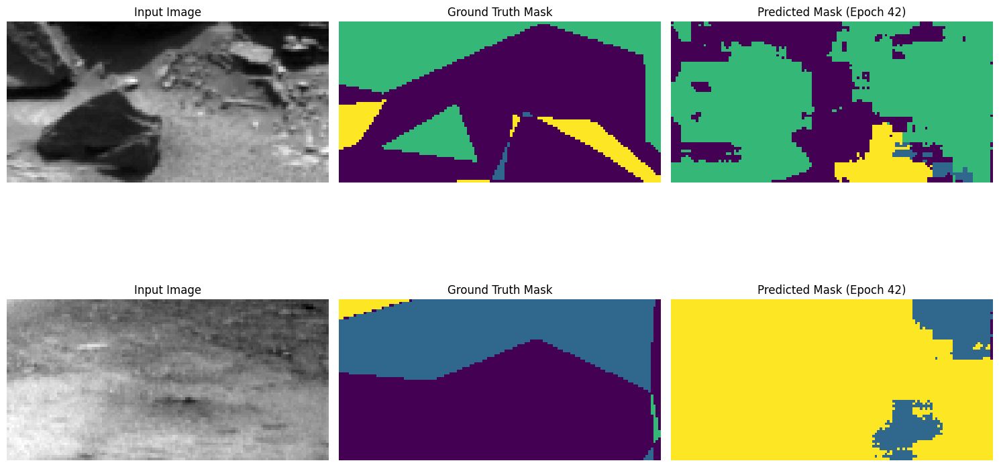

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 180ms/step - accuracy: 0.7019 - loss: 0.6838 - learning_rate: 5.0000e-04
Epoch 43/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7133 - loss: 0.6835
Epoch 43: loss improved from 0.68408 to 0.68387, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


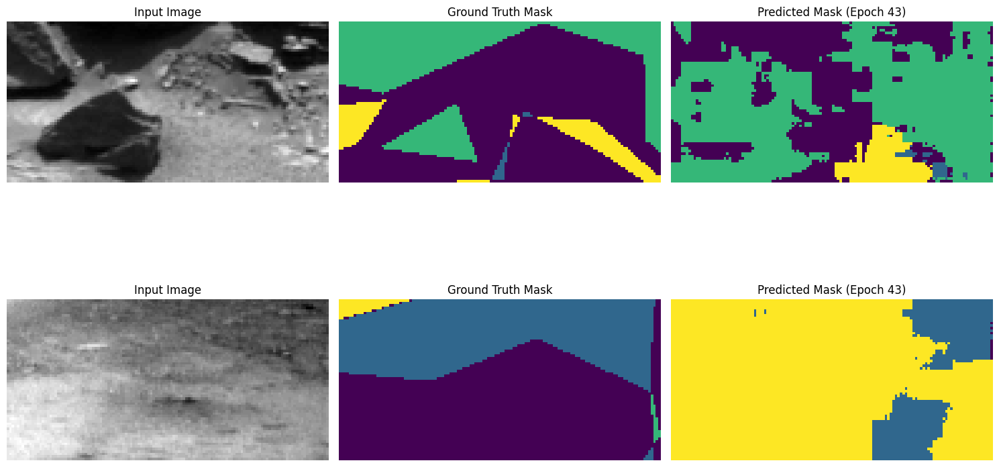

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.7134 - loss: 0.6835 - learning_rate: 5.0000e-04
Epoch 44/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7209 - loss: 0.6834
Epoch 44: loss improved from 0.68387 to 0.68377, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


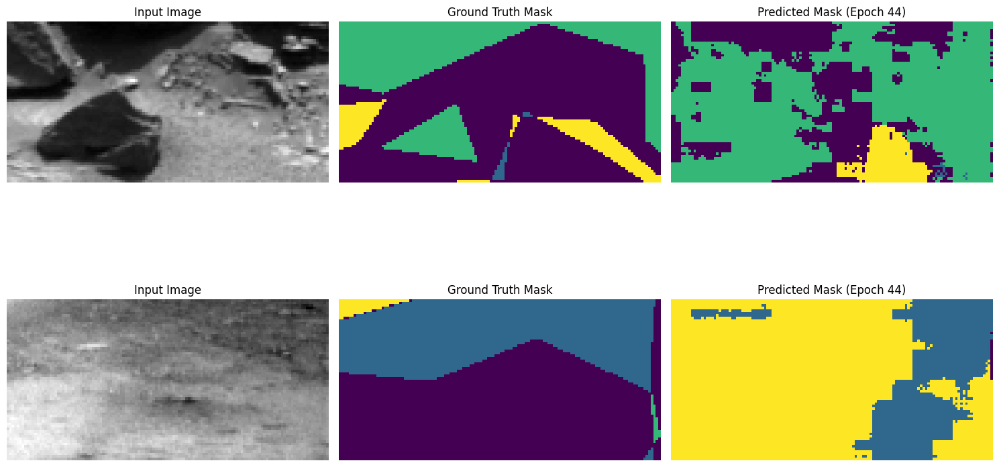

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.7209 - loss: 0.6834 - learning_rate: 5.0000e-04
Epoch 45/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7263 - loss: 0.6833
Epoch 45: loss improved from 0.68377 to 0.68370, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


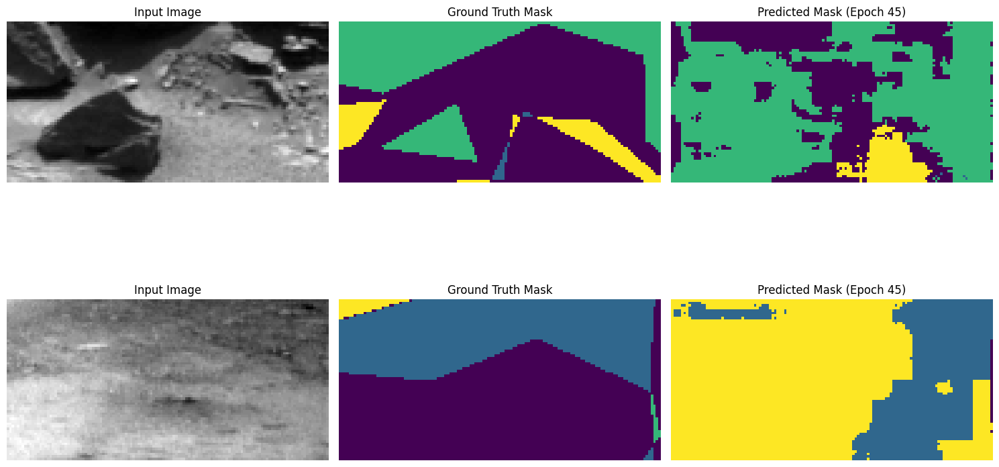

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.7264 - loss: 0.6833 - learning_rate: 5.0000e-04
Epoch 46/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7317 - loss: 0.6833
Epoch 46: loss improved from 0.68370 to 0.68362, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


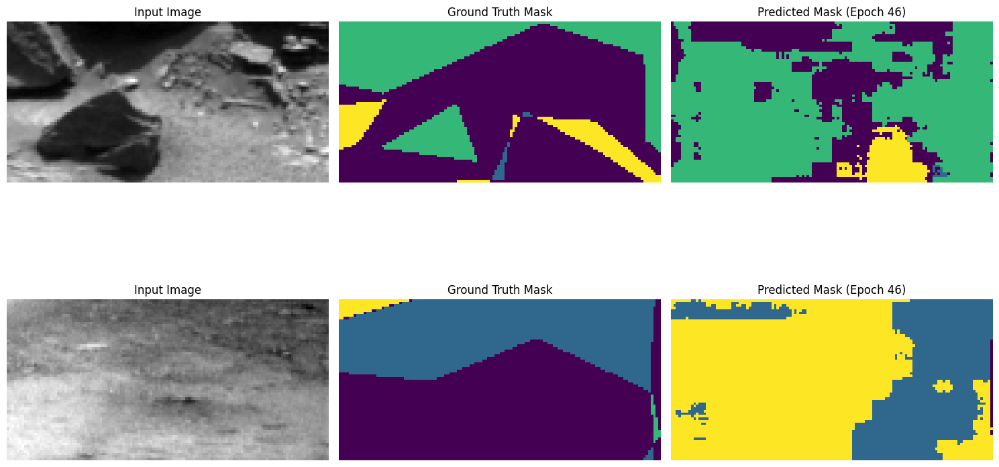

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.7317 - loss: 0.6833 - learning_rate: 5.0000e-04
Epoch 47/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7366 - loss: 0.6832
Epoch 47: loss improved from 0.68362 to 0.68356, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


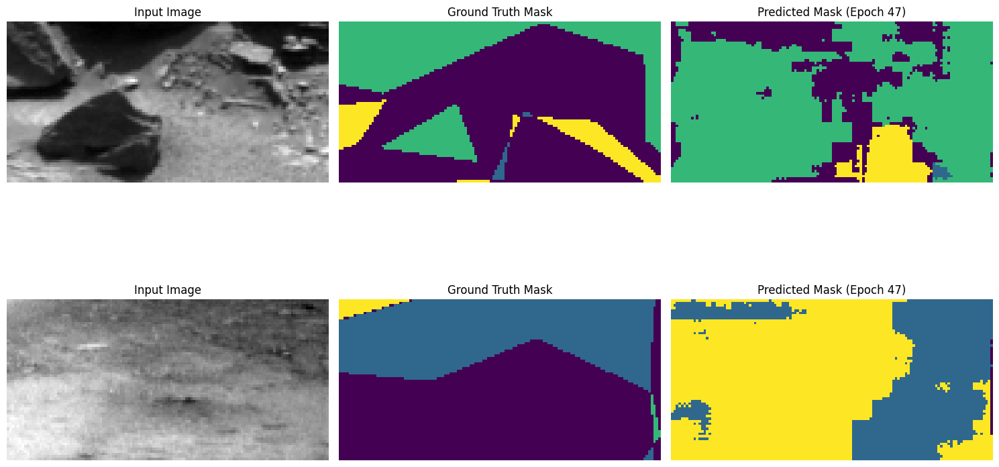

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.7366 - loss: 0.6832 - learning_rate: 5.0000e-04
Epoch 48/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7408 - loss: 0.6831
Epoch 48: loss improved from 0.68356 to 0.68351, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


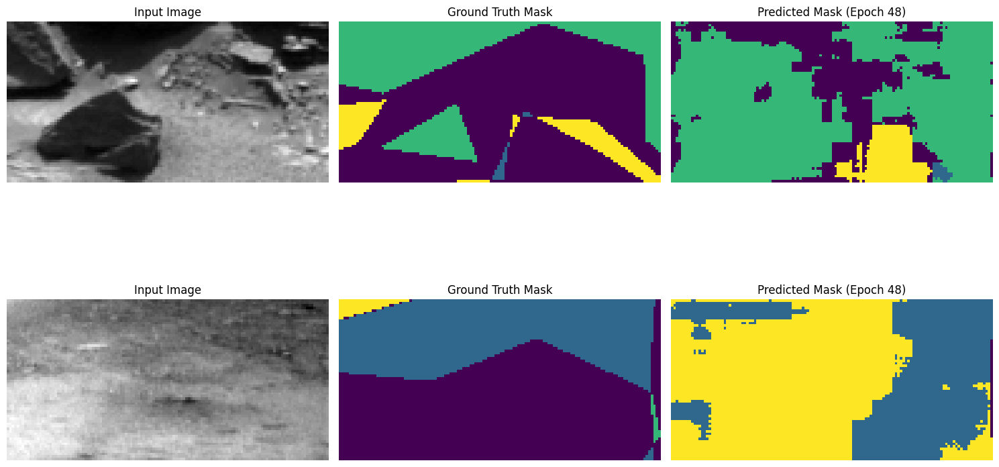

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.7408 - loss: 0.6831 - learning_rate: 5.0000e-04
Epoch 49/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7455 - loss: 0.6831
Epoch 49: loss improved from 0.68351 to 0.68345, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


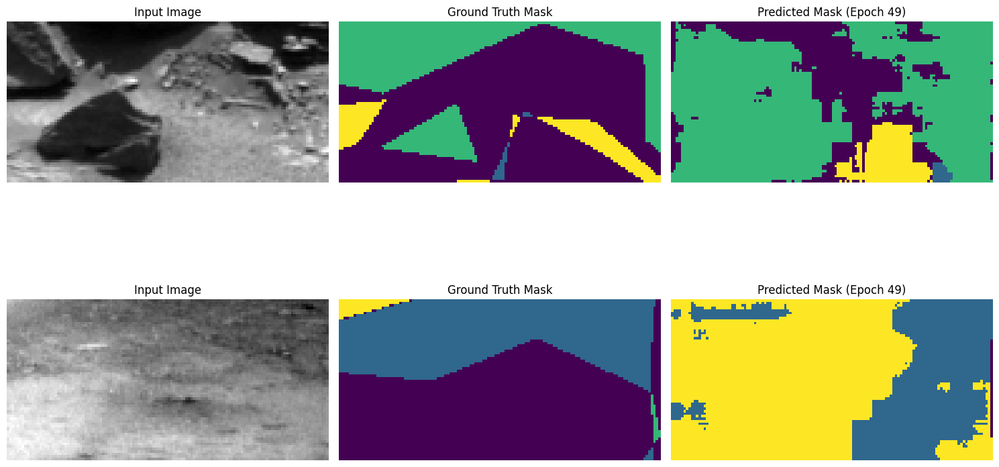

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 175ms/step - accuracy: 0.7455 - loss: 0.6831 - learning_rate: 5.0000e-04
Epoch 50/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7501 - loss: 0.6830
Epoch 50: loss improved from 0.68345 to 0.68339, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


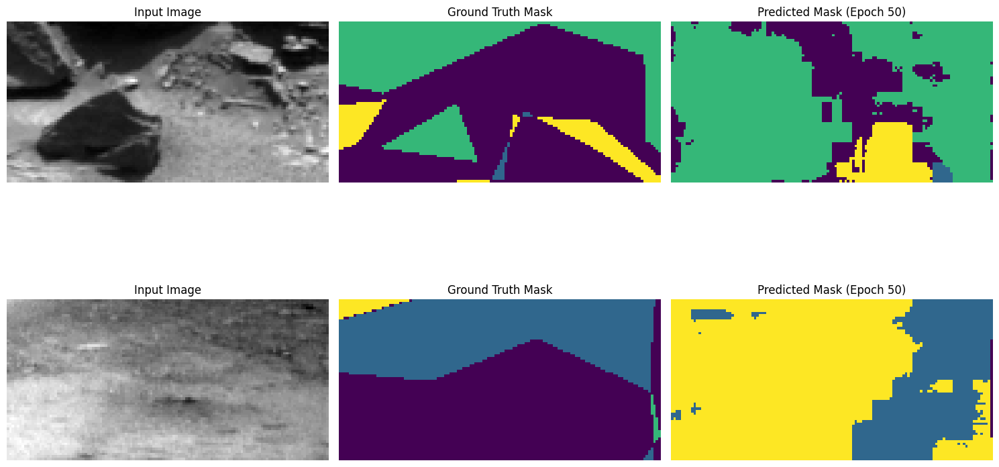

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.7501 - loss: 0.6830 - learning_rate: 5.0000e-04
Epoch 51/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7520 - loss: 0.6830
Epoch 51: loss did not improve from 0.68339
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


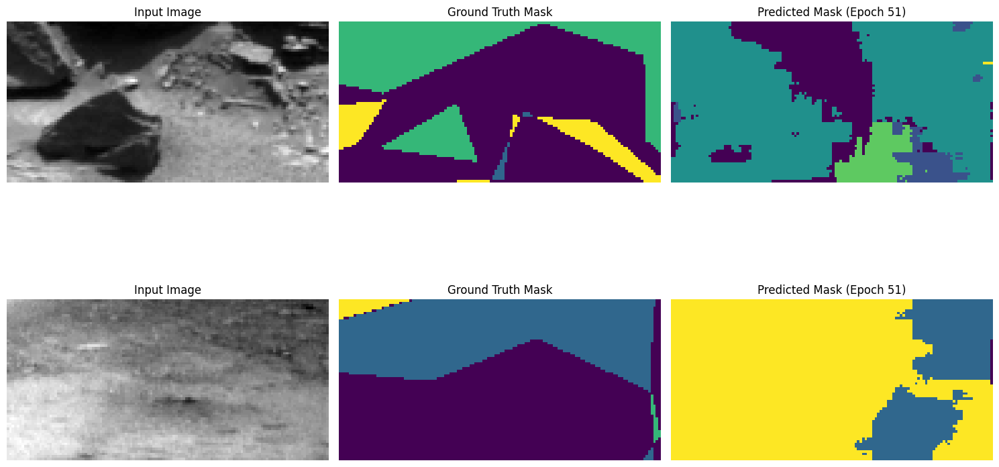

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 169ms/step - accuracy: 0.7520 - loss: 0.6830 - learning_rate: 5.0000e-04
Epoch 52/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7515 - loss: 0.6830
Epoch 52: loss improved from 0.68339 to 0.68336, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


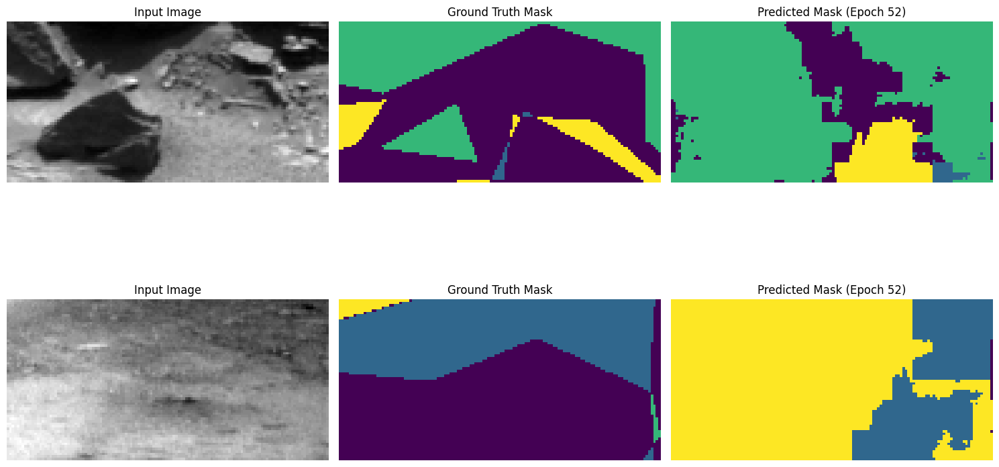

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 181ms/step - accuracy: 0.7515 - loss: 0.6830 - learning_rate: 5.0000e-04
Epoch 53/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7556 - loss: 0.6829
Epoch 53: loss improved from 0.68336 to 0.68329, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


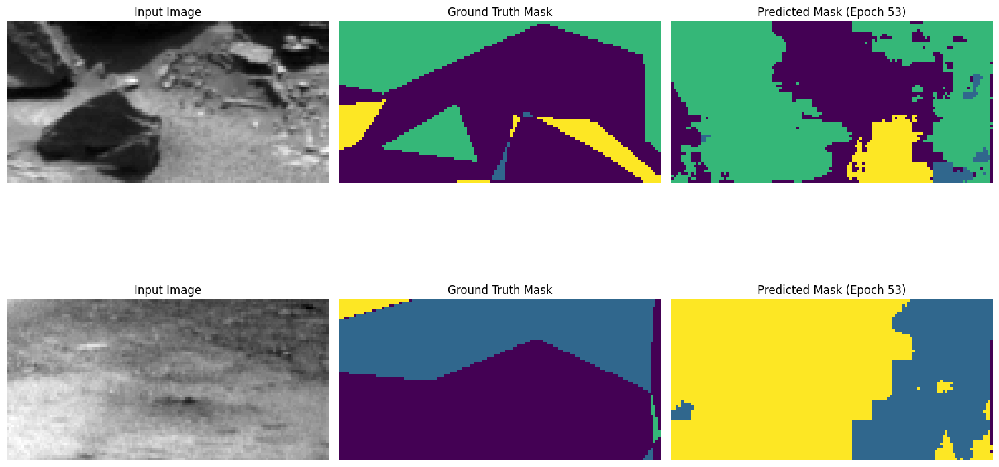

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.7556 - loss: 0.6829 - learning_rate: 5.0000e-04
Epoch 54/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7672 - loss: 0.6828
Epoch 54: loss improved from 0.68329 to 0.68319, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


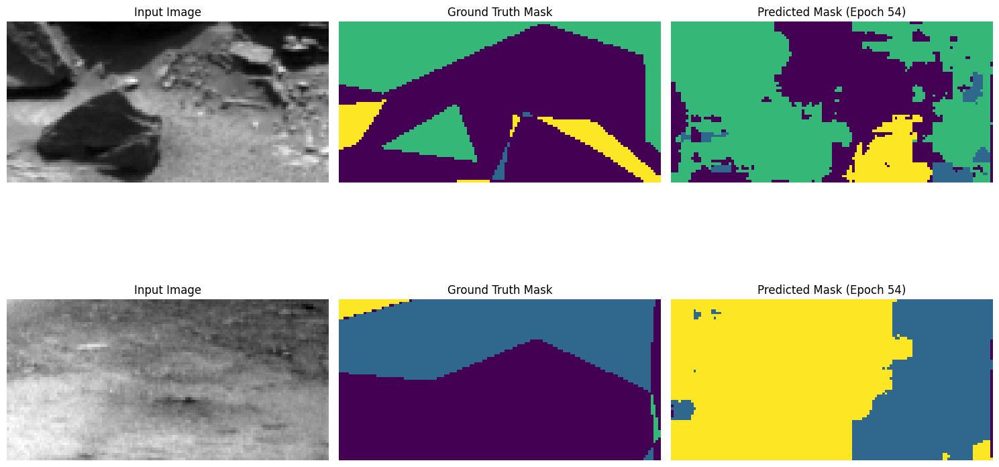

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.7672 - loss: 0.6828 - learning_rate: 5.0000e-04
Epoch 55/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7757 - loss: 0.6827
Epoch 55: loss improved from 0.68319 to 0.68309, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


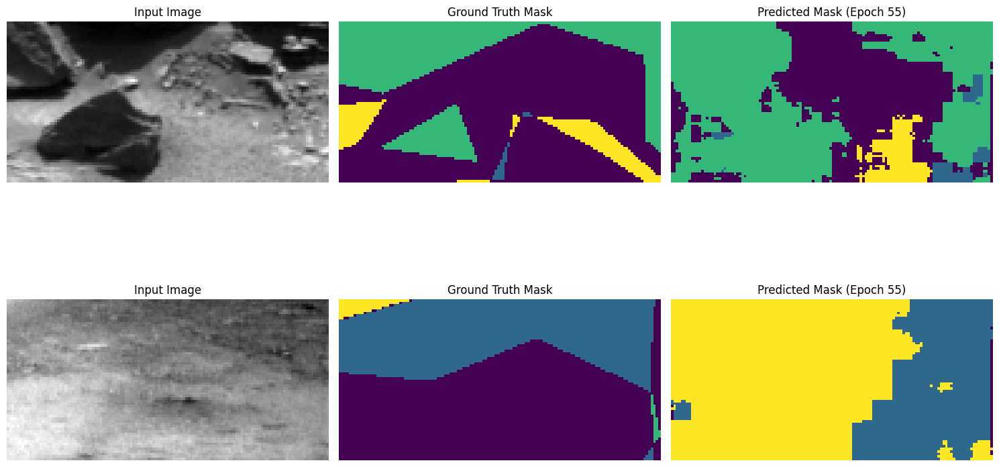

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.7757 - loss: 0.6827 - learning_rate: 5.0000e-04
Epoch 56/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7815 - loss: 0.6826
Epoch 56: loss improved from 0.68309 to 0.68302, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


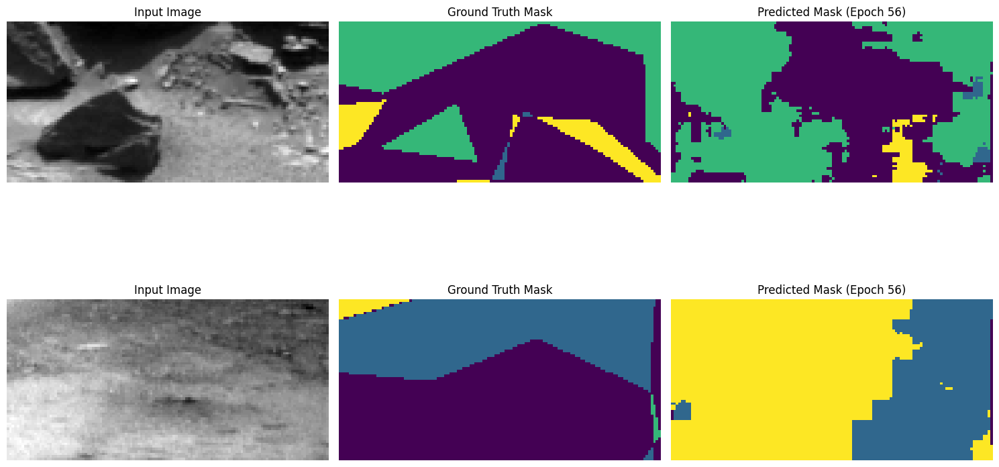

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.7815 - loss: 0.6826 - learning_rate: 5.0000e-04
Epoch 57/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7878 - loss: 0.6825
Epoch 57: loss improved from 0.68302 to 0.68294, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


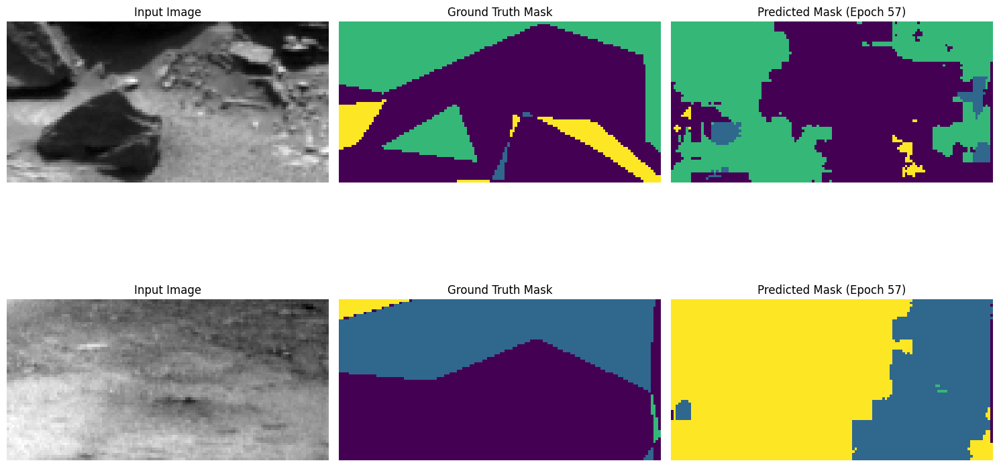

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.7878 - loss: 0.6826 - learning_rate: 5.0000e-04
Epoch 58/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.7905 - loss: 0.6825
Epoch 58: loss improved from 0.68294 to 0.68293, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


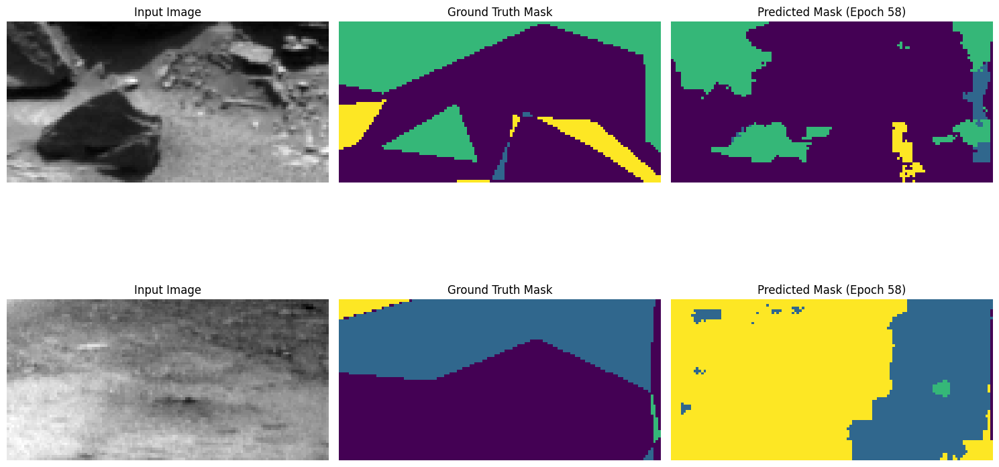

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.7905 - loss: 0.6825 - learning_rate: 5.0000e-04
Epoch 59/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.7959 - loss: 0.6825
Epoch 59: loss improved from 0.68293 to 0.68287, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


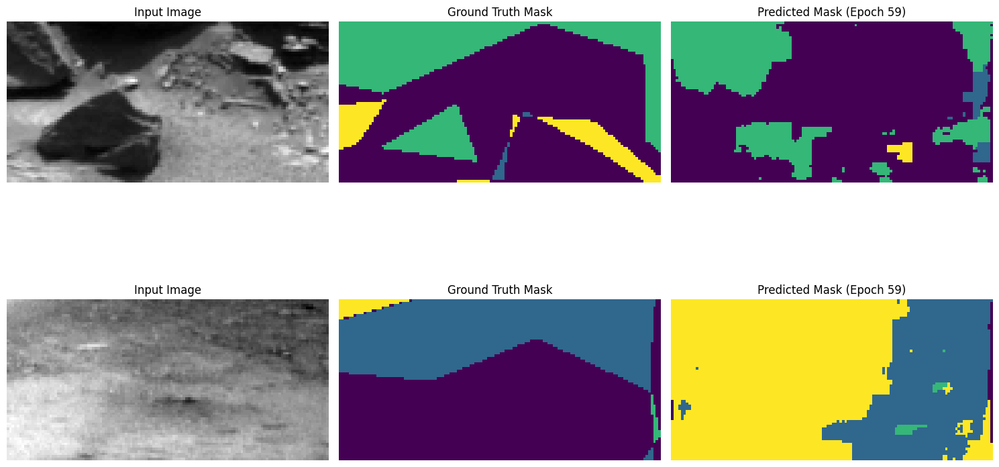

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.7959 - loss: 0.6825 - learning_rate: 5.0000e-04
Epoch 60/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8038 - loss: 0.6824
Epoch 60: loss improved from 0.68287 to 0.68279, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


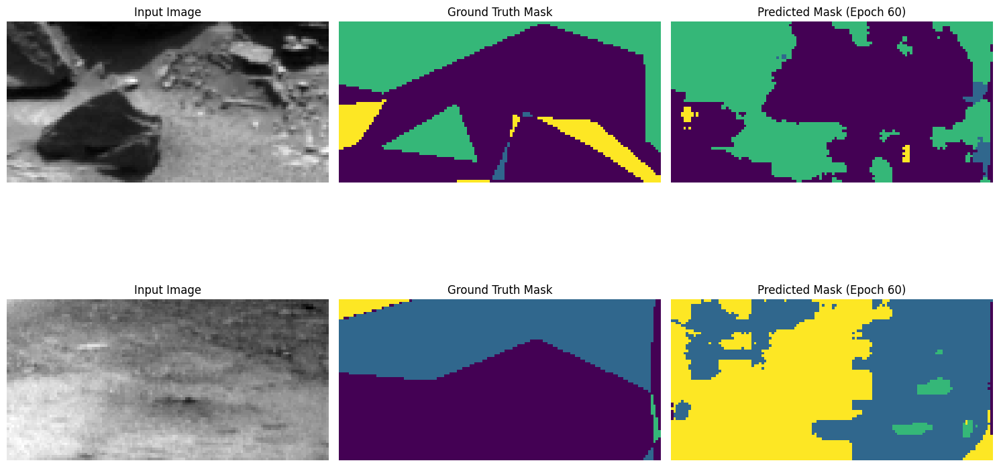

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.8038 - loss: 0.6824 - learning_rate: 5.0000e-04
Epoch 61/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8044 - loss: 0.6824
Epoch 61: loss did not improve from 0.68279
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


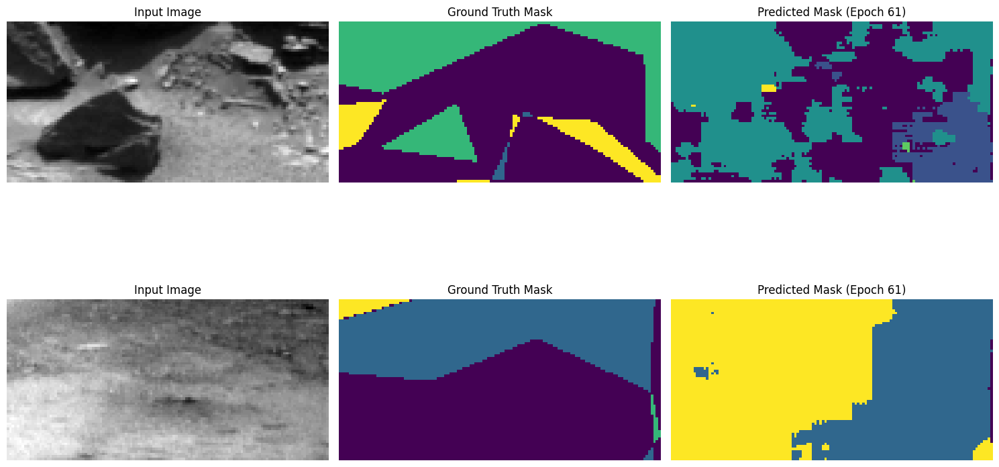

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 171ms/step - accuracy: 0.8042 - loss: 0.6824 - learning_rate: 5.0000e-04
Epoch 62/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.7924 - loss: 0.6825
Epoch 62: loss did not improve from 0.68279
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


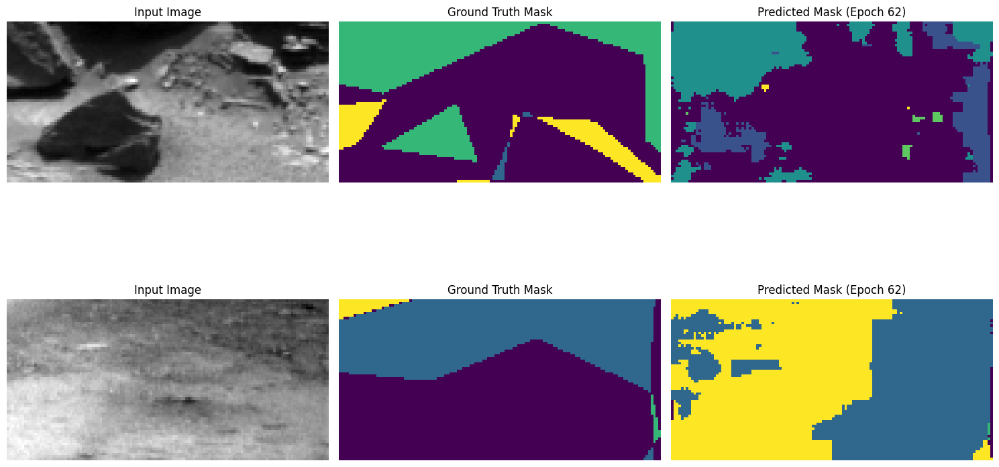

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 171ms/step - accuracy: 0.7925 - loss: 0.6825 - learning_rate: 5.0000e-04
Epoch 63/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8186 - loss: 0.6822
Epoch 63: loss improved from 0.68279 to 0.68256, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


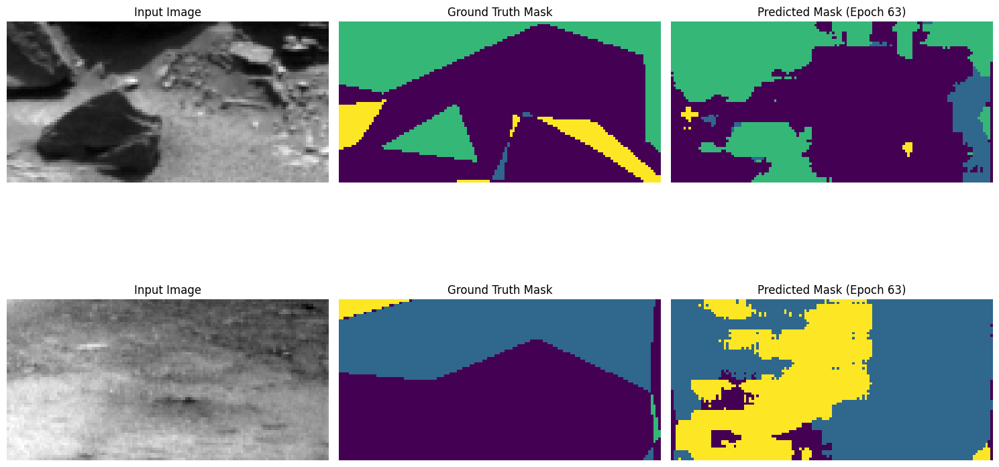

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 182ms/step - accuracy: 0.8186 - loss: 0.6822 - learning_rate: 5.0000e-04
Epoch 64/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8288 - loss: 0.6820
Epoch 64: loss improved from 0.68256 to 0.68243, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


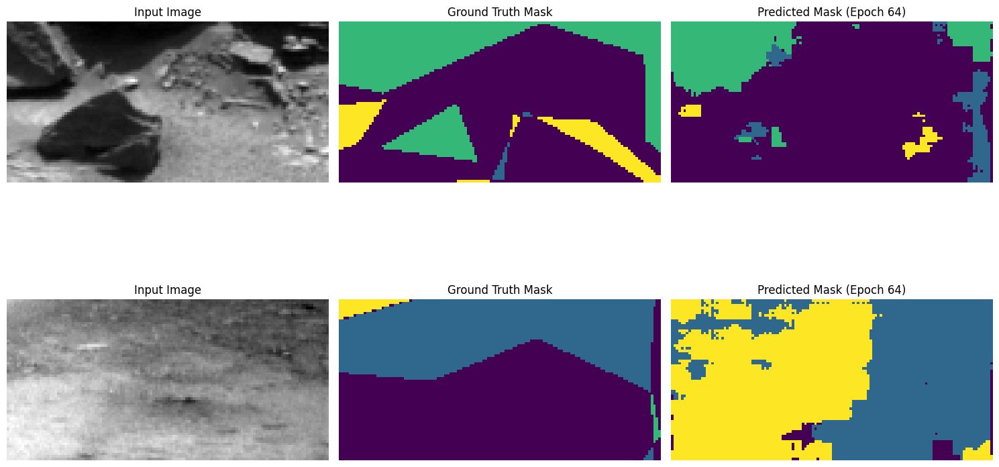

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.8288 - loss: 0.6821 - learning_rate: 5.0000e-04
Epoch 65/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8379 - loss: 0.6819
Epoch 65: loss improved from 0.68243 to 0.68229, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


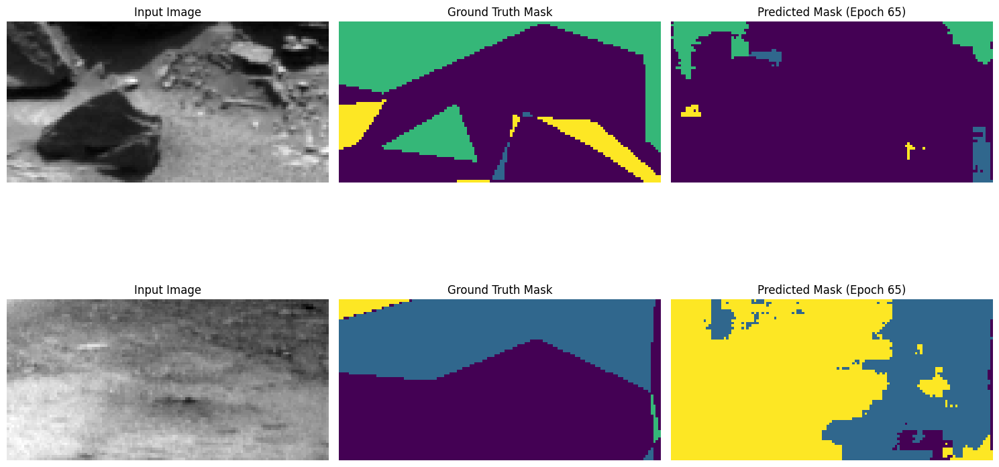

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.8379 - loss: 0.6819 - learning_rate: 5.0000e-04
Epoch 66/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8394 - loss: 0.6819
Epoch 66: loss improved from 0.68229 to 0.68229, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


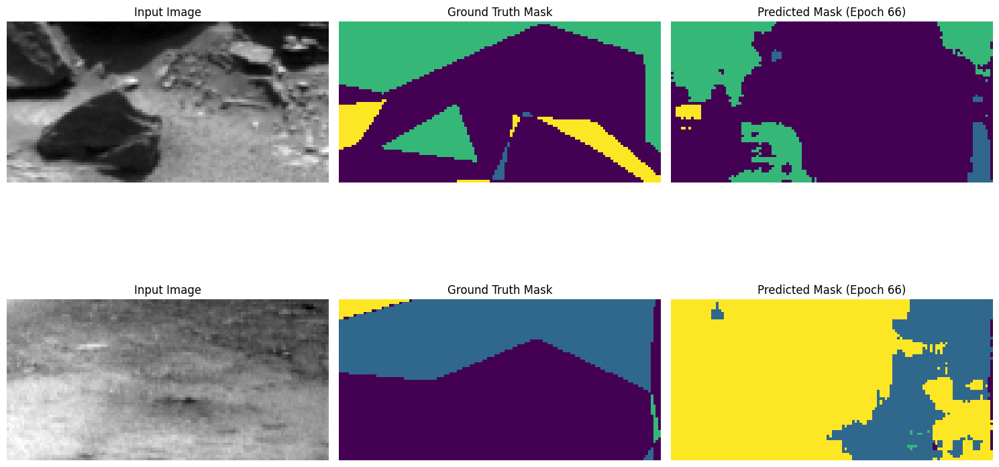

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.8394 - loss: 0.6819 - learning_rate: 5.0000e-04
Epoch 67/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8312 - loss: 0.6820
Epoch 67: loss did not improve from 0.68229
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


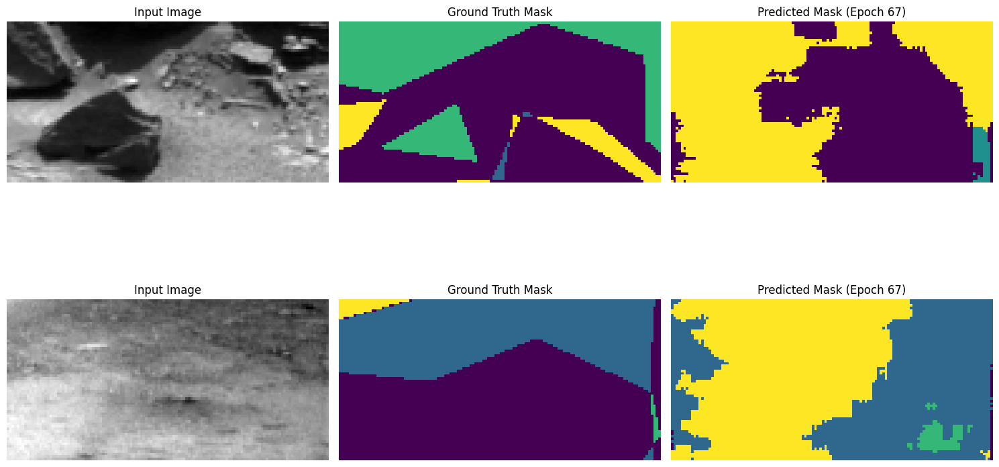

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - accuracy: 0.8312 - loss: 0.6820 - learning_rate: 5.0000e-04
Epoch 68/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8319 - loss: 0.6821
Epoch 68: loss did not improve from 0.68229
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


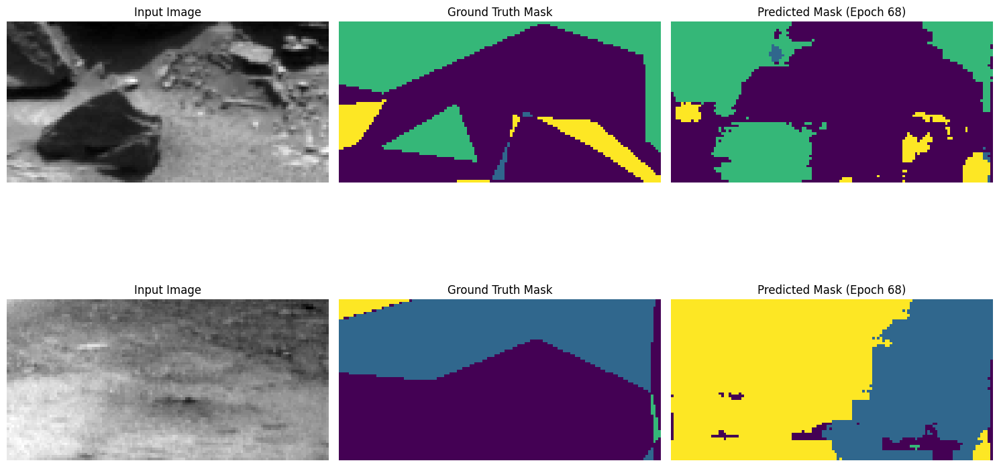

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - accuracy: 0.8320 - loss: 0.6821 - learning_rate: 5.0000e-04
Epoch 69/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.8457 - loss: 0.6819
Epoch 69: loss did not improve from 0.68229
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


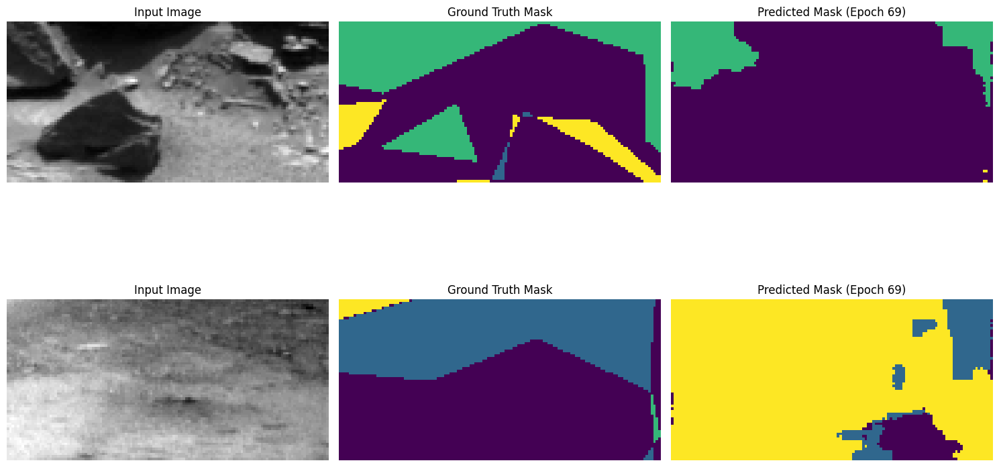

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 172ms/step - accuracy: 0.8456 - loss: 0.6819 - learning_rate: 5.0000e-04
Epoch 70/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8431 - loss: 0.6818
Epoch 70: loss improved from 0.68229 to 0.68225, saving model to best_model.keras

Epoch 70: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


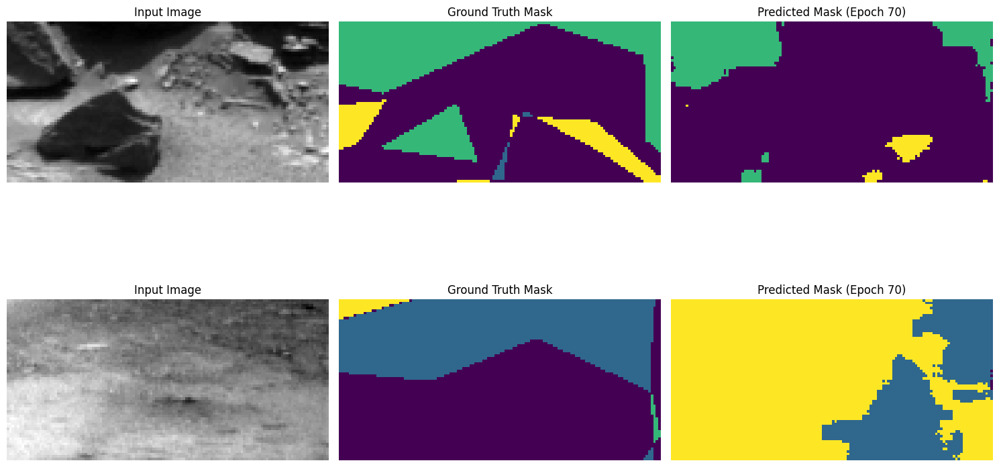

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.8431 - loss: 0.6819 - learning_rate: 5.0000e-04
Epoch 71/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8319 - loss: 0.6820
Epoch 71: loss did not improve from 0.68225
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


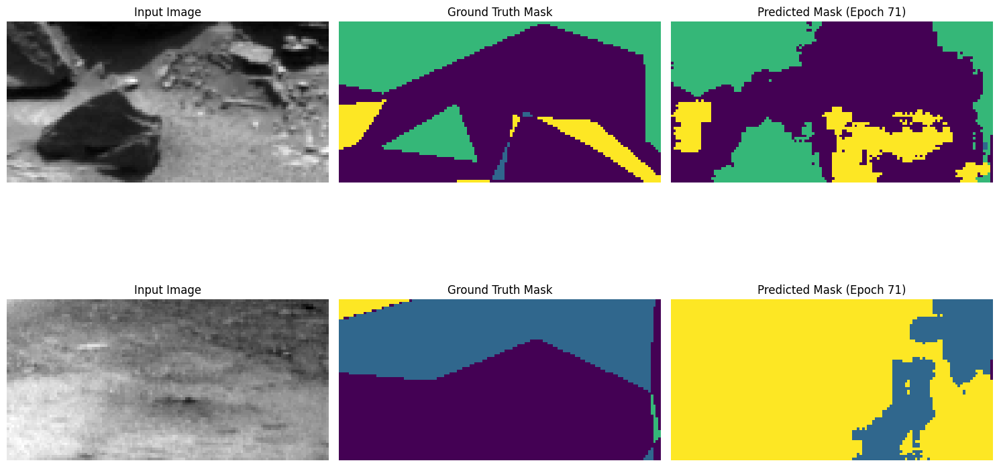

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - accuracy: 0.8319 - loss: 0.6820 - learning_rate: 2.5000e-04
Epoch 72/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8558 - loss: 0.6817
Epoch 72: loss improved from 0.68225 to 0.68195, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


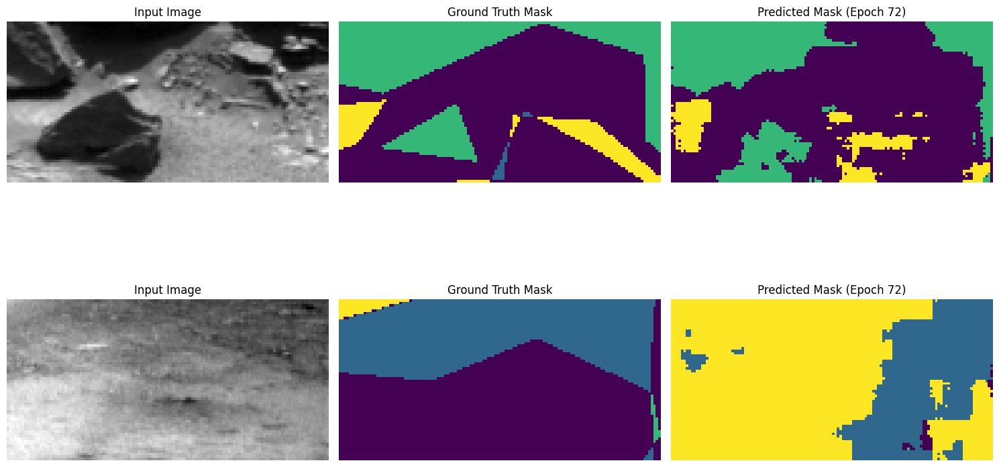

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.8559 - loss: 0.6817 - learning_rate: 2.5000e-04
Epoch 73/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8733 - loss: 0.6814
Epoch 73: loss improved from 0.68195 to 0.68175, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


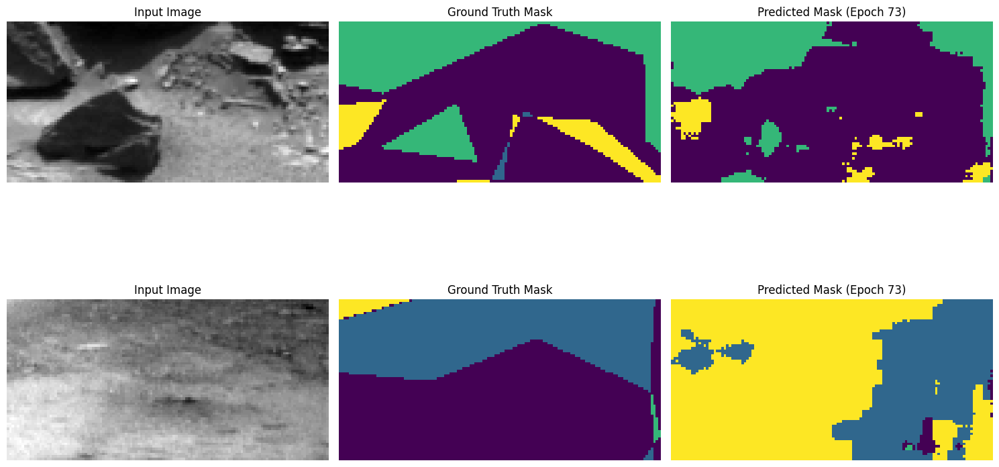

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.8733 - loss: 0.6814 - learning_rate: 2.5000e-04
Epoch 74/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8830 - loss: 0.6813
Epoch 74: loss improved from 0.68175 to 0.68162, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


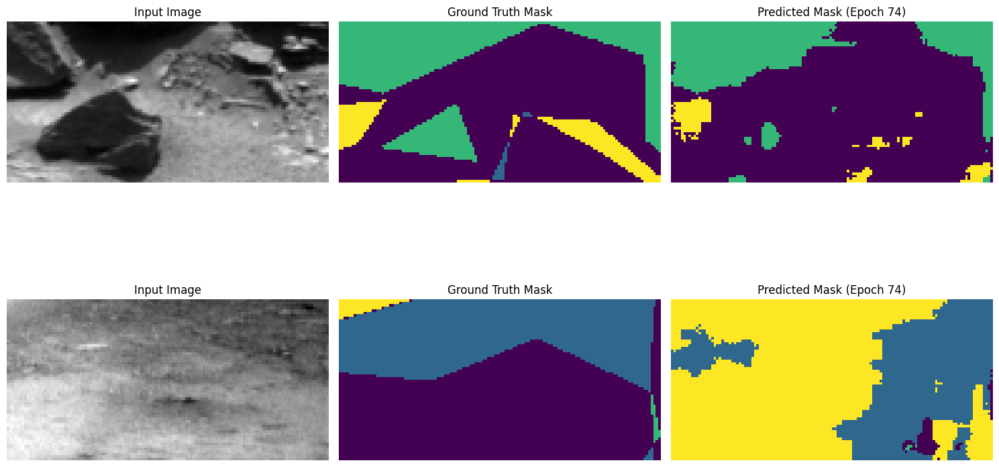

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 182ms/step - accuracy: 0.8831 - loss: 0.6813 - learning_rate: 2.5000e-04
Epoch 75/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8902 - loss: 0.6812
Epoch 75: loss improved from 0.68162 to 0.68153, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


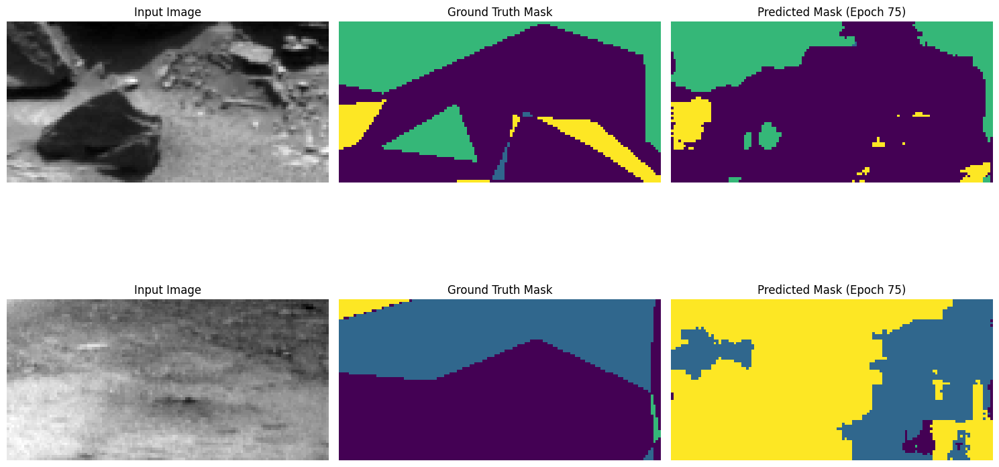

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.8903 - loss: 0.6812 - learning_rate: 2.5000e-04
Epoch 76/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8962 - loss: 0.6811
Epoch 76: loss improved from 0.68153 to 0.68145, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


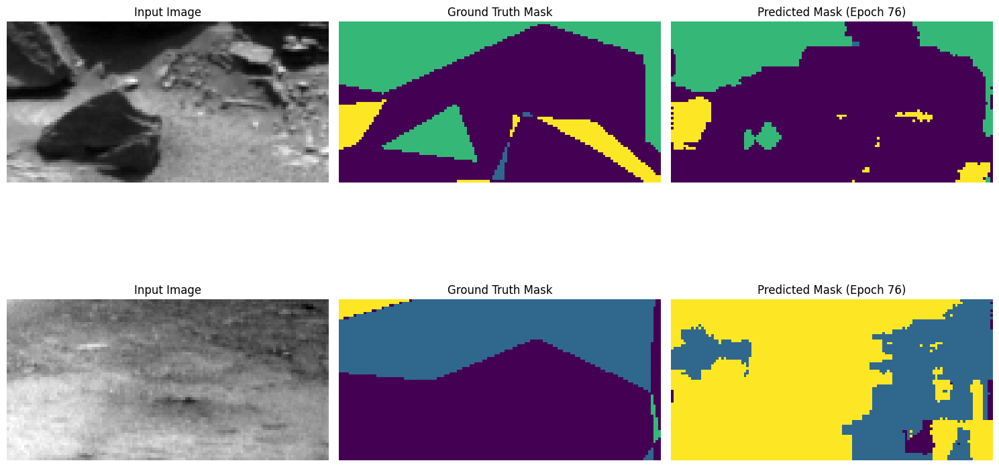

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.8963 - loss: 0.6811 - learning_rate: 2.5000e-04
Epoch 77/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.9011 - loss: 0.6811
Epoch 77: loss improved from 0.68145 to 0.68138, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


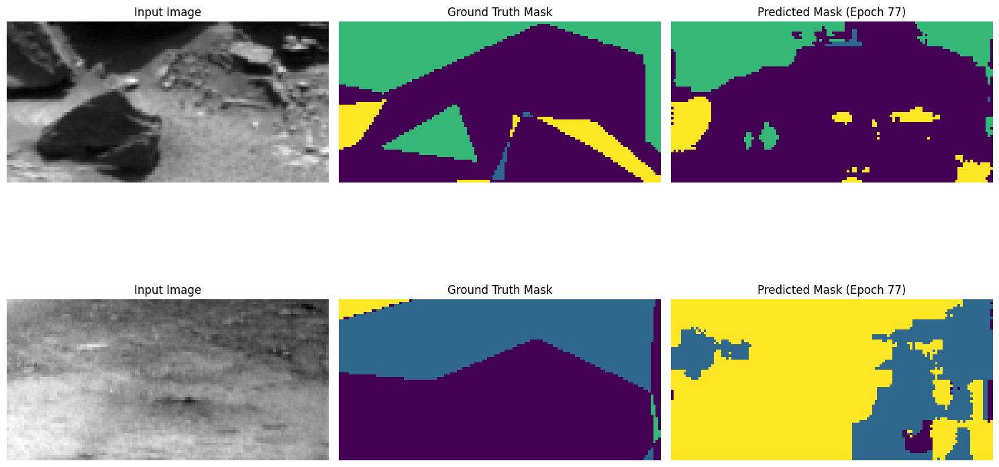

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.9012 - loss: 0.6811 - learning_rate: 2.5000e-04
Epoch 78/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9045 - loss: 0.6810
Epoch 78: loss improved from 0.68138 to 0.68132, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


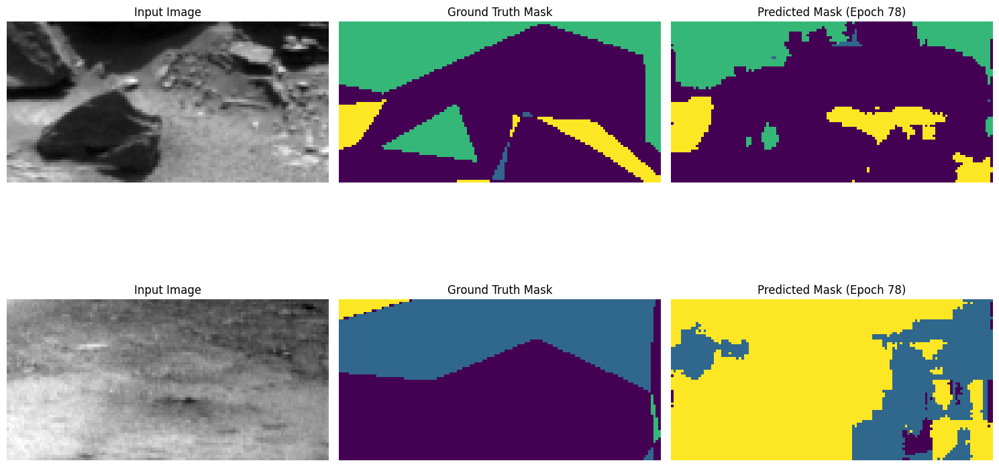

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9046 - loss: 0.6810 - learning_rate: 2.5000e-04
Epoch 79/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.9069 - loss: 0.6810
Epoch 79: loss improved from 0.68132 to 0.68130, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


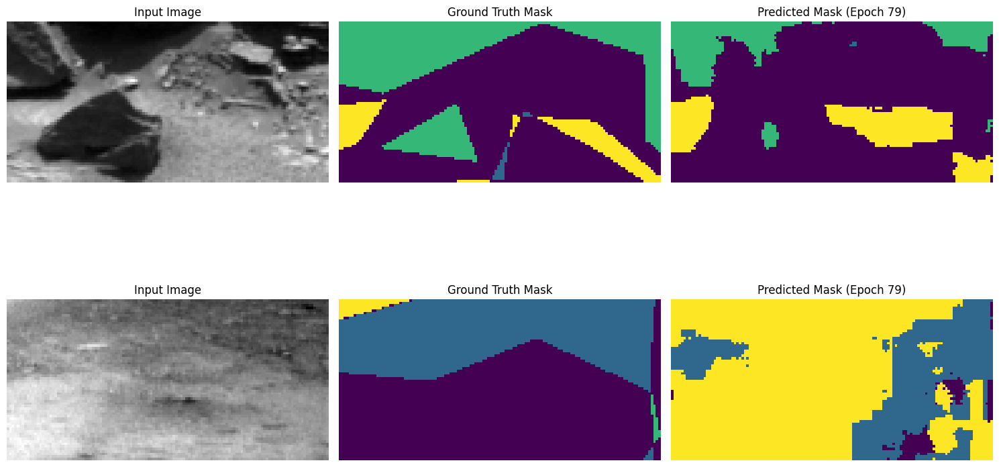

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9070 - loss: 0.6810 - learning_rate: 2.5000e-04
Epoch 80/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.9042 - loss: 0.6810
Epoch 80: loss did not improve from 0.68130
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


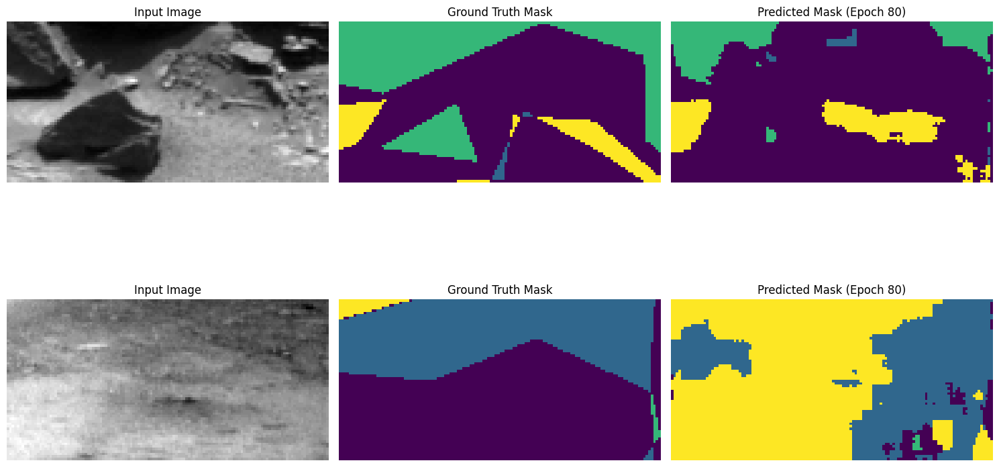

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - accuracy: 0.9043 - loss: 0.6810 - learning_rate: 2.5000e-04
Epoch 81/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.9044 - loss: 0.6810
Epoch 81: loss did not improve from 0.68130
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


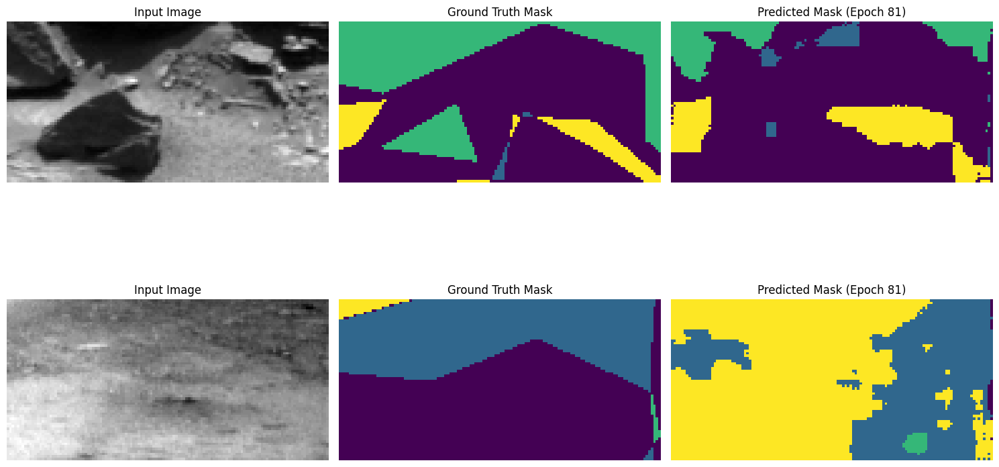

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 171ms/step - accuracy: 0.9045 - loss: 0.6810 - learning_rate: 2.5000e-04
Epoch 82/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.9050 - loss: 0.6810
Epoch 82: loss did not improve from 0.68130
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


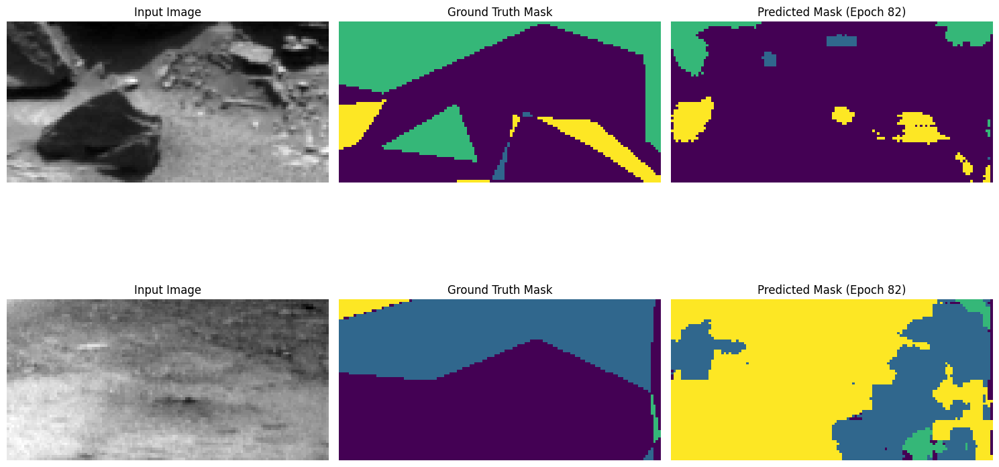

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - accuracy: 0.9051 - loss: 0.6810 - learning_rate: 2.5000e-04
Epoch 83/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.8978 - loss: 0.6811
Epoch 83: loss did not improve from 0.68130

Epoch 83: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


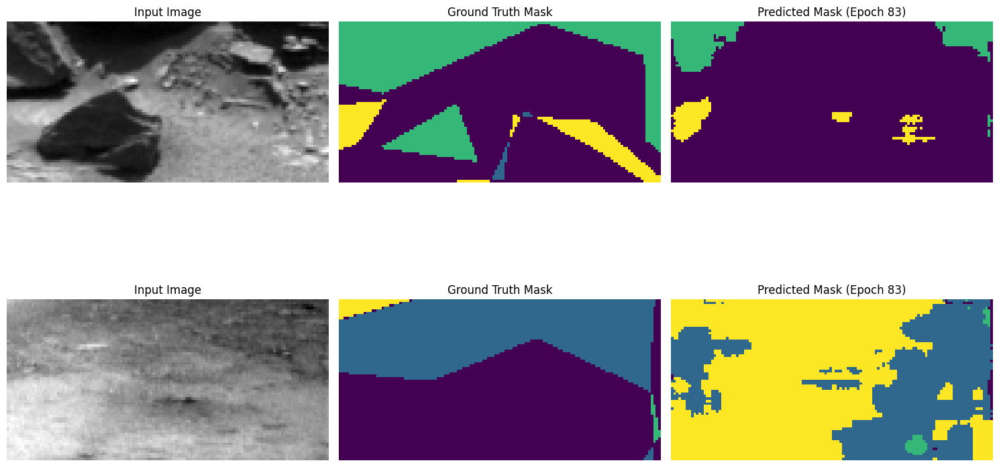

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 172ms/step - accuracy: 0.8979 - loss: 0.6811 - learning_rate: 2.5000e-04
Epoch 84/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8973 - loss: 0.6811
Epoch 84: loss did not improve from 0.68130
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


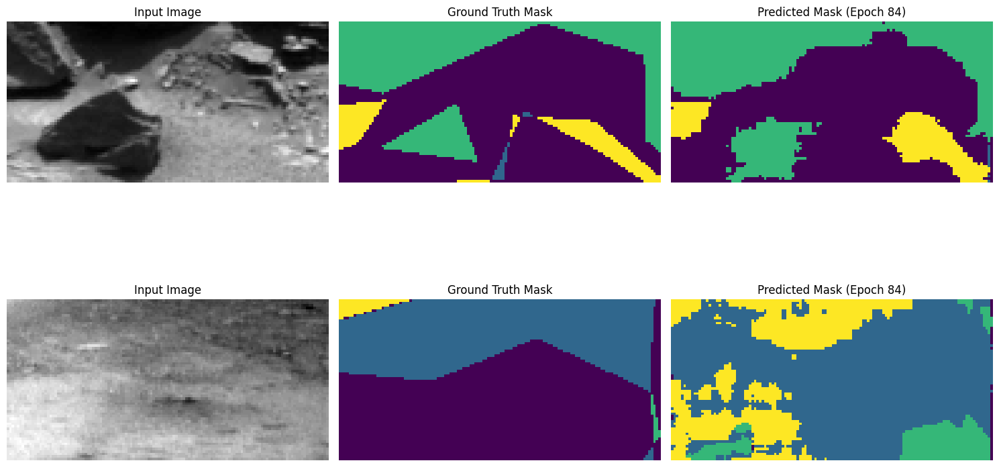

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.8974 - loss: 0.6811 - learning_rate: 1.2500e-04
Epoch 85/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.9027 - loss: 0.6811
Epoch 85: loss improved from 0.68130 to 0.68128, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


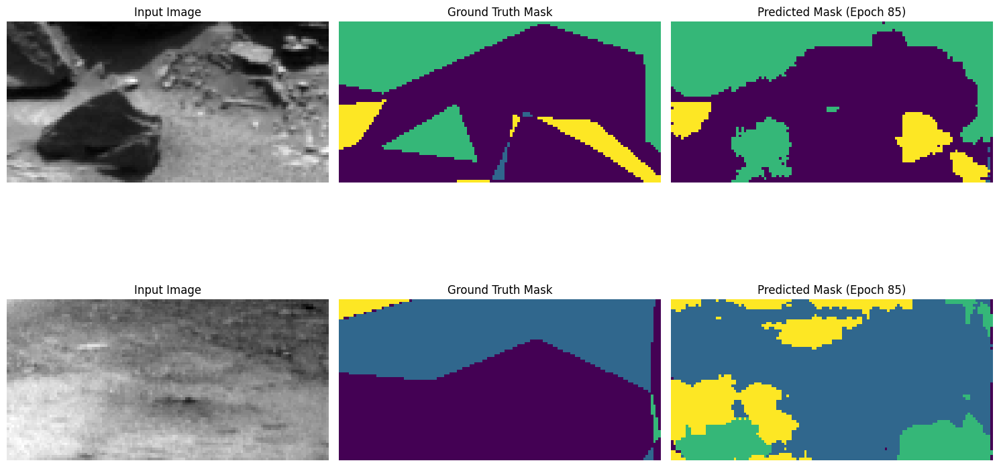

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9029 - loss: 0.6811 - learning_rate: 1.2500e-04
Epoch 86/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.9111 - loss: 0.6810
Epoch 86: loss improved from 0.68128 to 0.68119, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


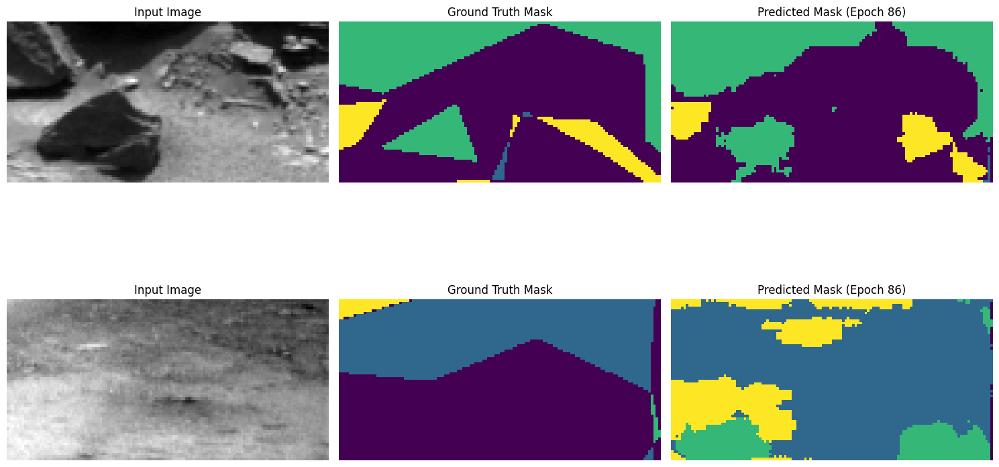

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.9112 - loss: 0.6810 - learning_rate: 1.2500e-04
Epoch 87/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9183 - loss: 0.6809
Epoch 87: loss improved from 0.68119 to 0.68113, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


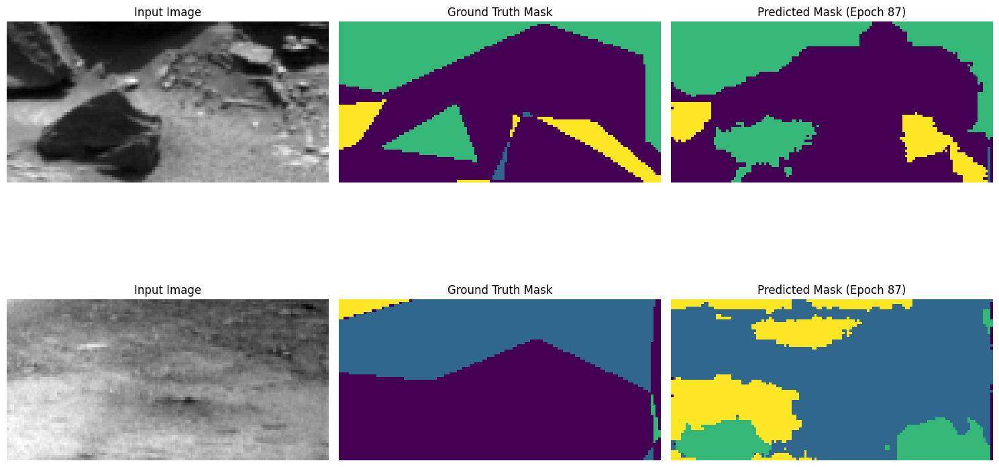

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9184 - loss: 0.6809 - learning_rate: 1.2500e-04
Epoch 88/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9234 - loss: 0.6808
Epoch 88: loss improved from 0.68113 to 0.68108, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


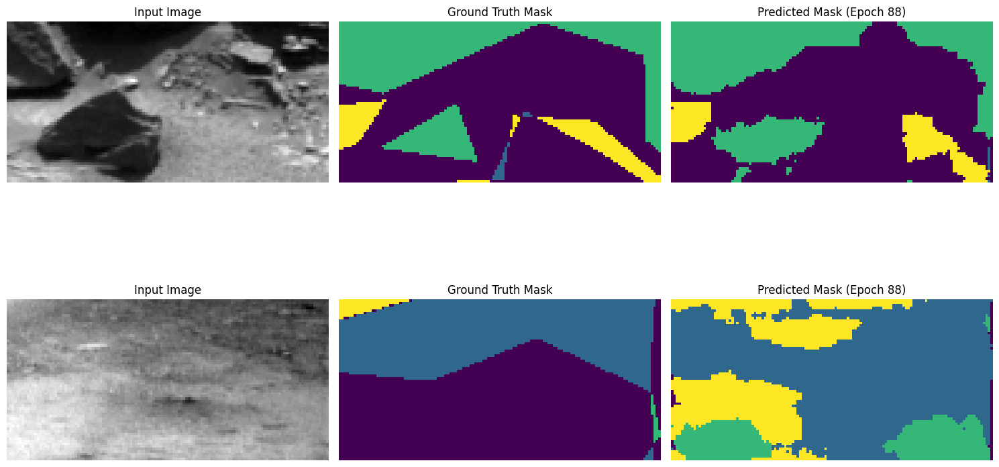

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9235 - loss: 0.6808 - learning_rate: 1.2500e-04
Epoch 89/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.9272 - loss: 0.6808
Epoch 89: loss improved from 0.68108 to 0.68104, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


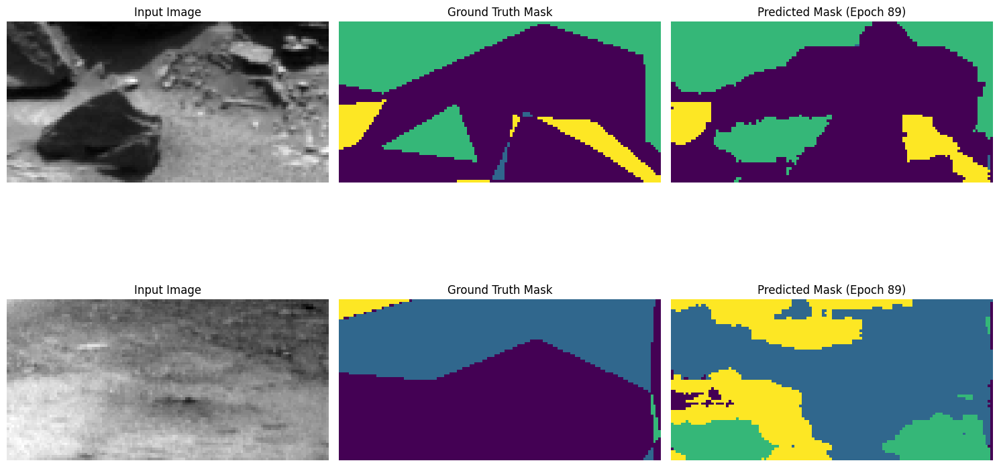

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.9273 - loss: 0.6808 - learning_rate: 1.2500e-04
Epoch 90/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9302 - loss: 0.6807
Epoch 90: loss improved from 0.68104 to 0.68100, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


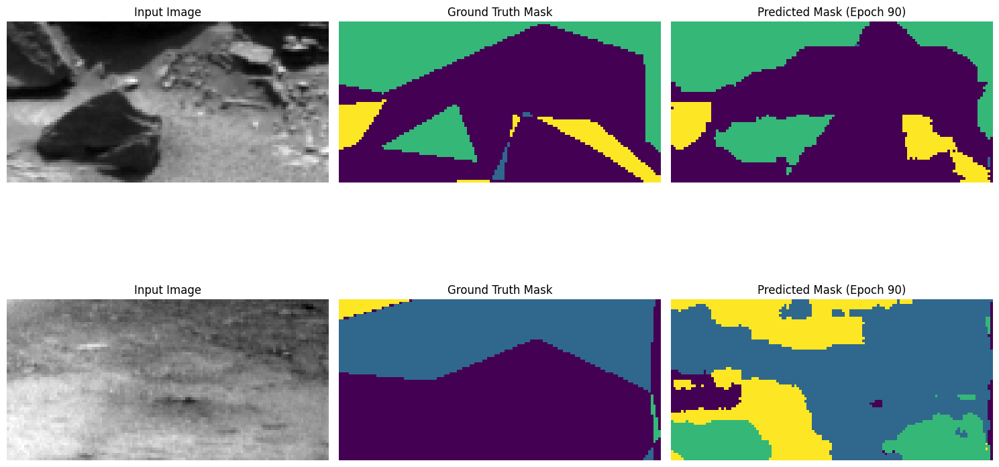

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9302 - loss: 0.6807 - learning_rate: 1.2500e-04
Epoch 91/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9324 - loss: 0.6807
Epoch 91: loss improved from 0.68100 to 0.68097, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


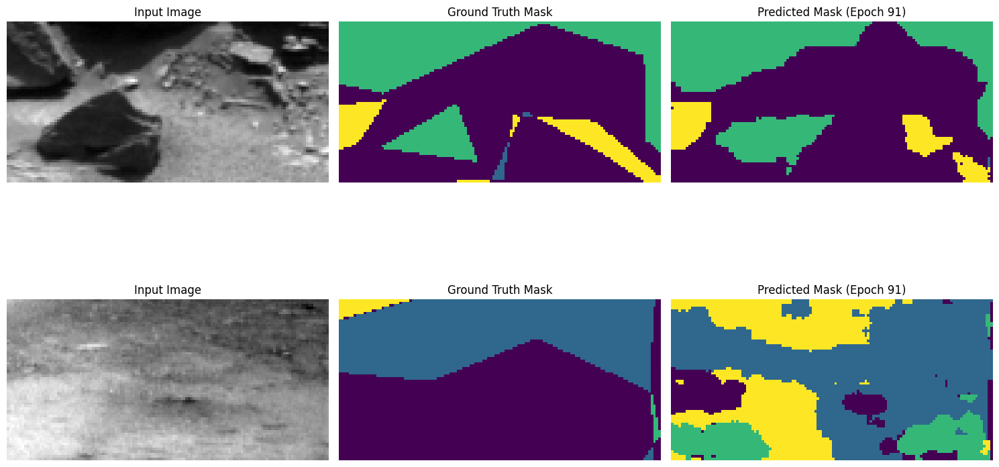

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.9325 - loss: 0.6807 - learning_rate: 1.2500e-04
Epoch 92/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9341 - loss: 0.6806
Epoch 92: loss improved from 0.68097 to 0.68095, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


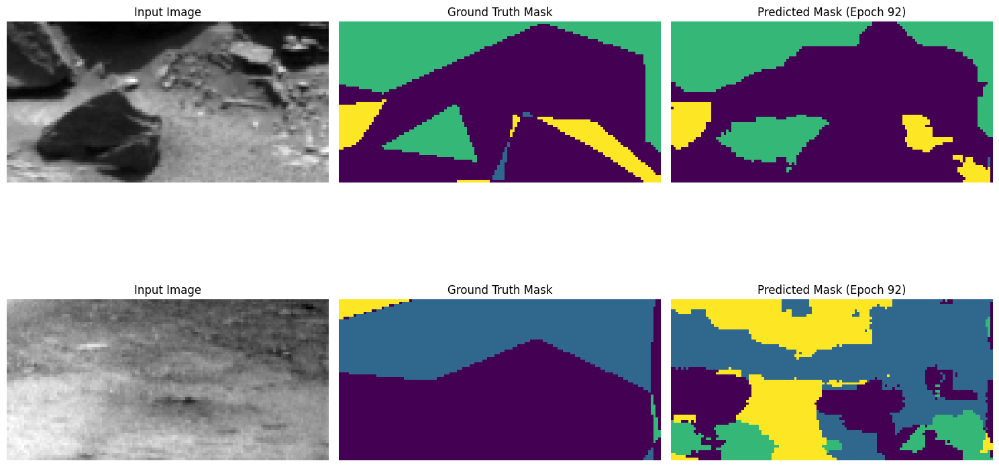

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.9342 - loss: 0.6806 - learning_rate: 1.2500e-04
Epoch 93/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9359 - loss: 0.6806
Epoch 93: loss improved from 0.68095 to 0.68094, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


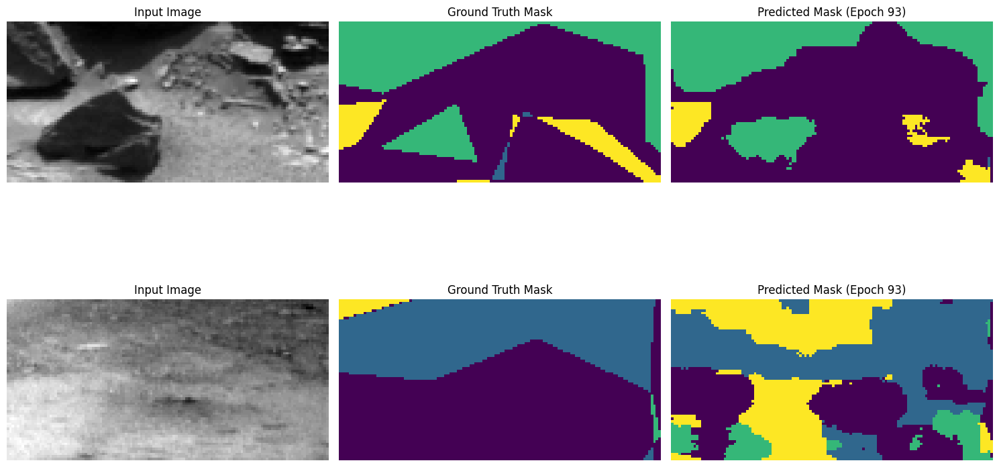

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.9359 - loss: 0.6806 - learning_rate: 1.2500e-04
Epoch 94/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9375 - loss: 0.6806
Epoch 94: loss improved from 0.68094 to 0.68092, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


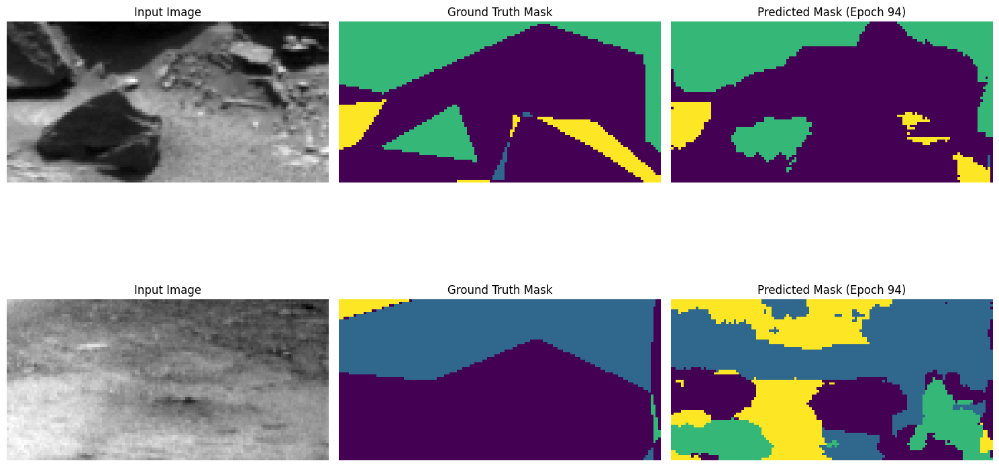

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.9376 - loss: 0.6806 - learning_rate: 1.2500e-04
Epoch 95/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9400 - loss: 0.6806
Epoch 95: loss improved from 0.68092 to 0.68090, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


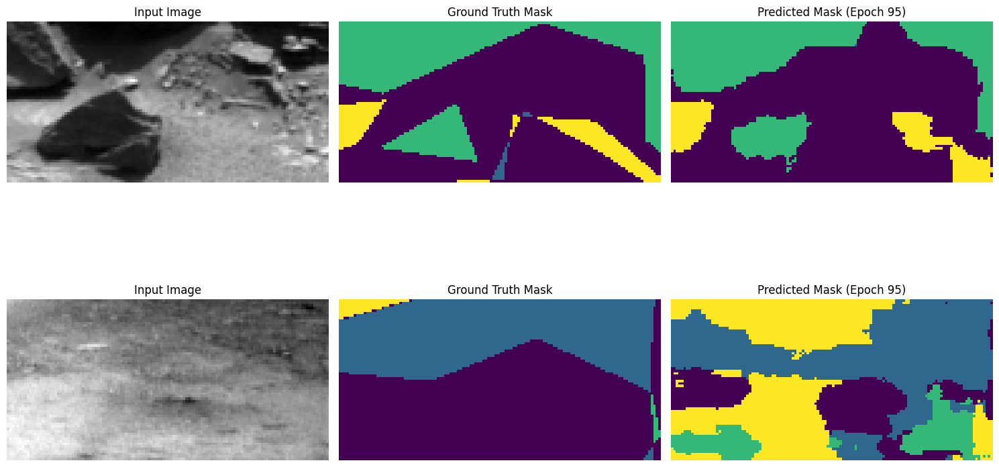

79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 184ms/step - accuracy: 0.9400 - loss: 0.6806 - learning_rate: 1.2500e-04
Epoch 96/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9400 - loss: 0.6805
Epoch 96: loss improved from 0.68090 to 0.68089, saving model to best_model.keras

Epoch 96: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


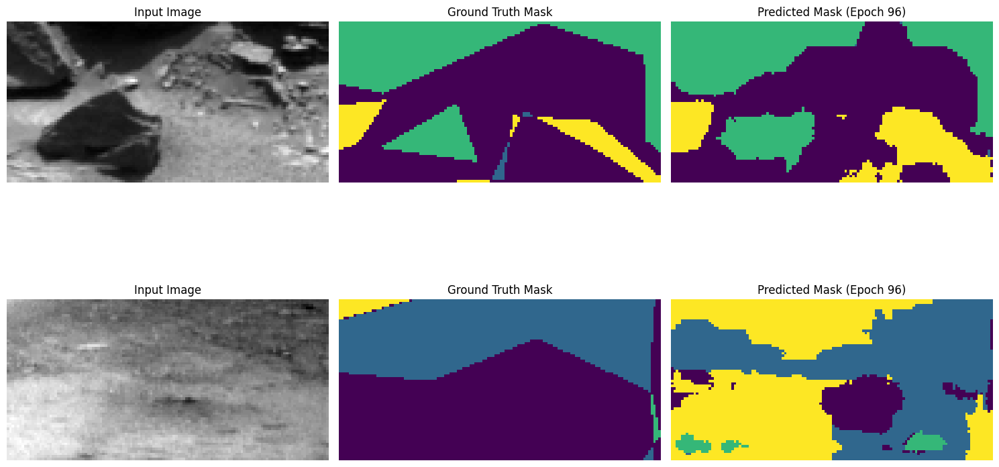

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9401 - loss: 0.6805 - learning_rate: 1.2500e-04
Epoch 97/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9340 - loss: 0.6806
Epoch 97: loss did not improve from 0.68089
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


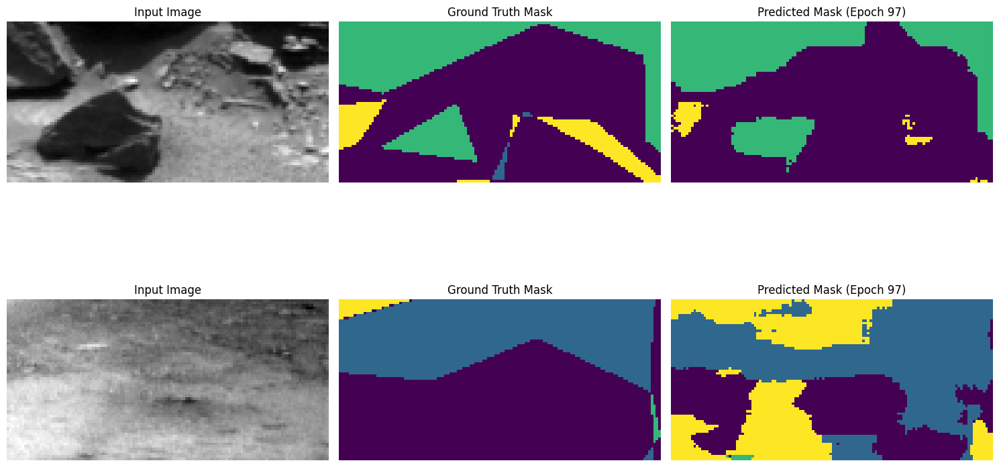

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 172ms/step - accuracy: 0.9341 - loss: 0.6806 - learning_rate: 6.2500e-05
Epoch 98/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9365 - loss: 0.6806
Epoch 98: loss did not improve from 0.68089
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


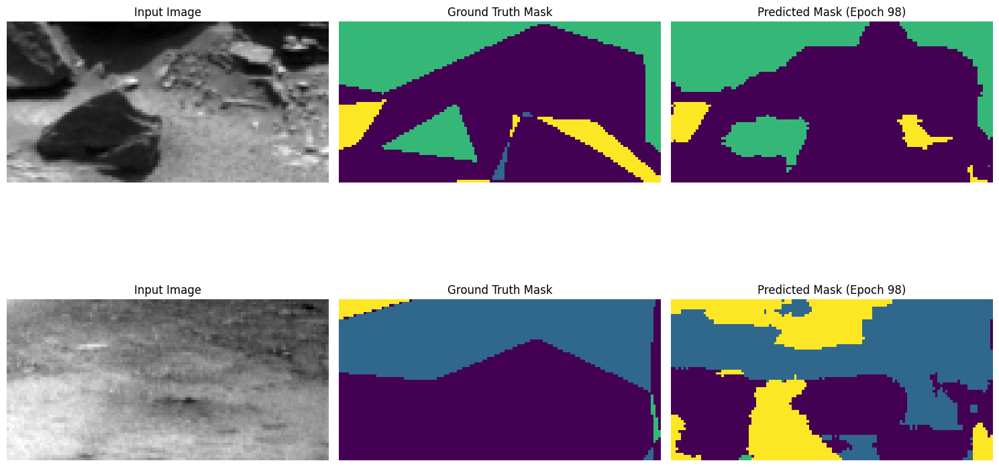

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 172ms/step - accuracy: 0.9366 - loss: 0.6806 - learning_rate: 6.2500e-05
Epoch 99/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9433 - loss: 0.6805
Epoch 99: loss improved from 0.68089 to 0.68082, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


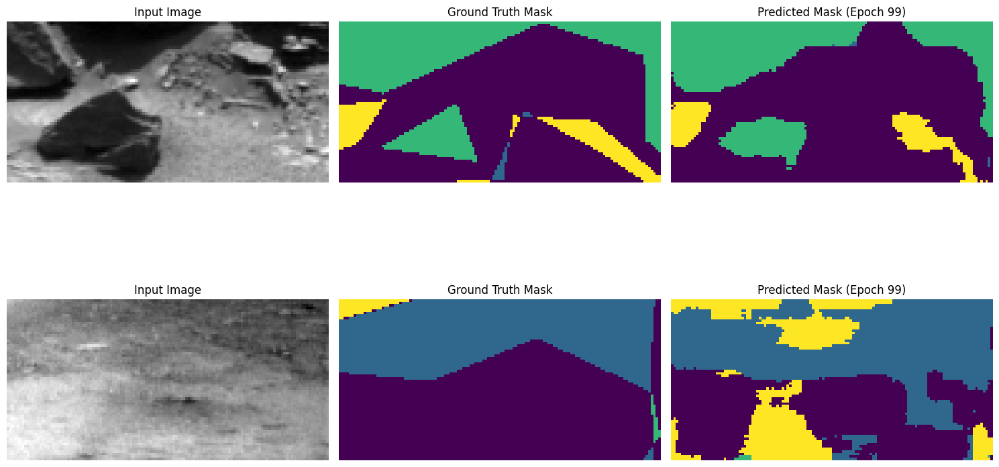

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9434 - loss: 0.6805 - learning_rate: 6.2500e-05
Epoch 100/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9484 - loss: 0.6804
Epoch 100: loss improved from 0.68082 to 0.68077, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


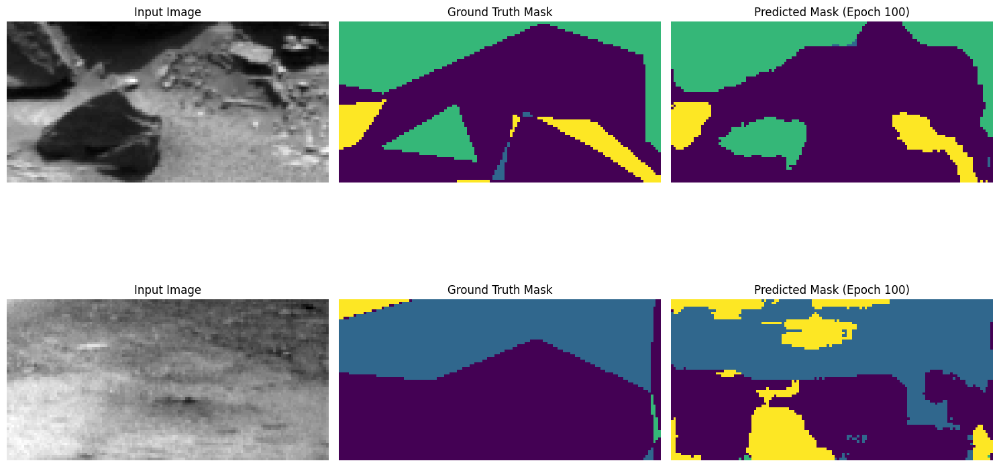

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9484 - loss: 0.6804 - learning_rate: 6.2500e-05
Epoch 101/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9513 - loss: 0.6804
Epoch 101: loss improved from 0.68077 to 0.68074, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


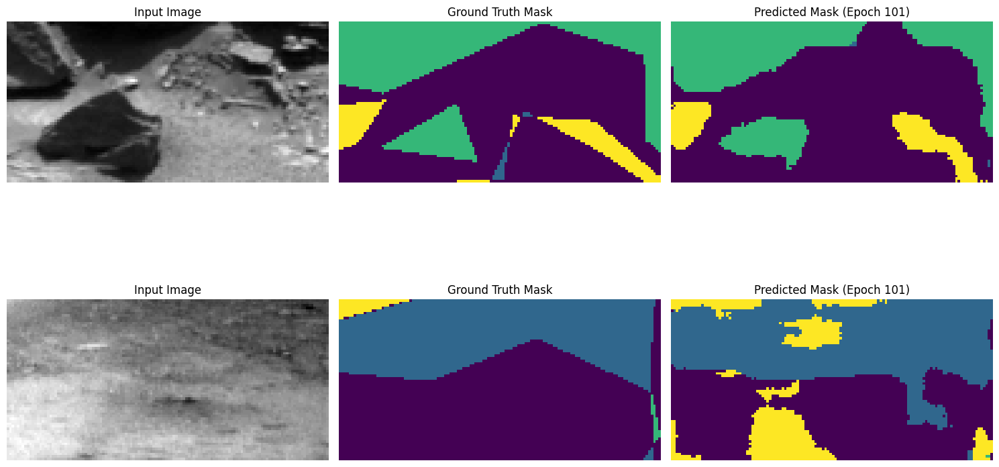

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.9514 - loss: 0.6804 - learning_rate: 6.2500e-05
Epoch 102/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9534 - loss: 0.6804
Epoch 102: loss improved from 0.68074 to 0.68072, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


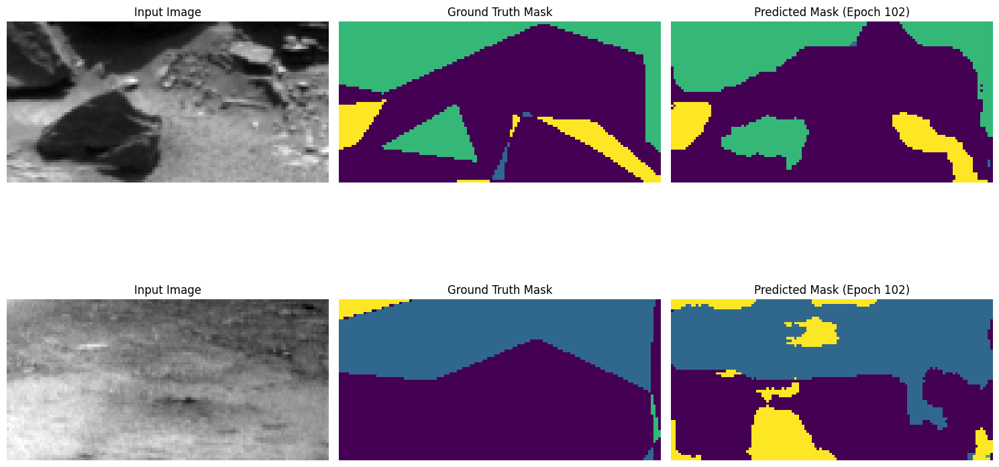

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.9534 - loss: 0.6804 - learning_rate: 6.2500e-05
Epoch 103/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9551 - loss: 0.6803
Epoch 103: loss improved from 0.68072 to 0.68070, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


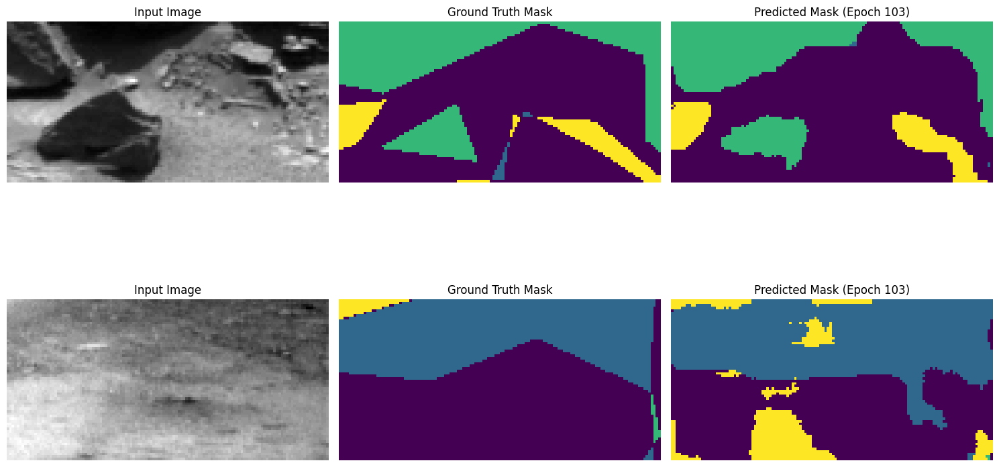

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9551 - loss: 0.6803 - learning_rate: 6.2500e-05
Epoch 104/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9566 - loss: 0.6803
Epoch 104: loss improved from 0.68070 to 0.68068, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


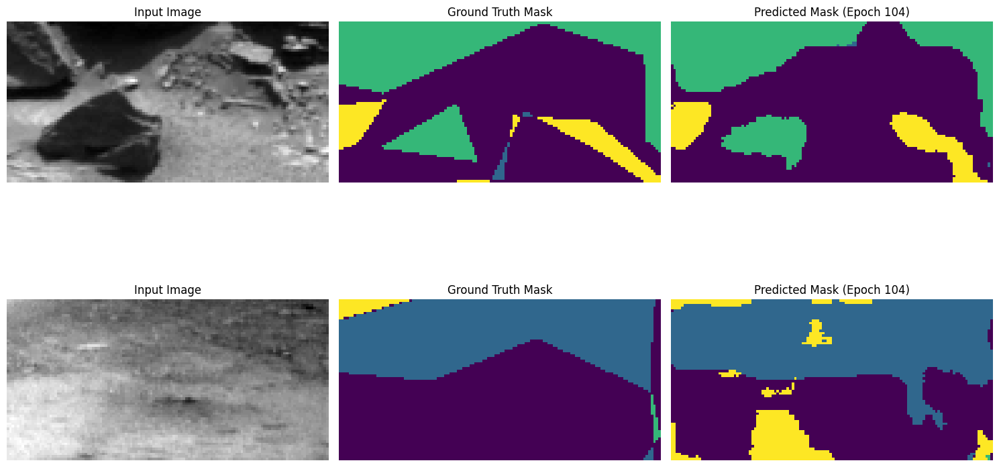

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9566 - loss: 0.6803 - learning_rate: 6.2500e-05
Epoch 105/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9580 - loss: 0.6803
Epoch 105: loss improved from 0.68068 to 0.68066, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


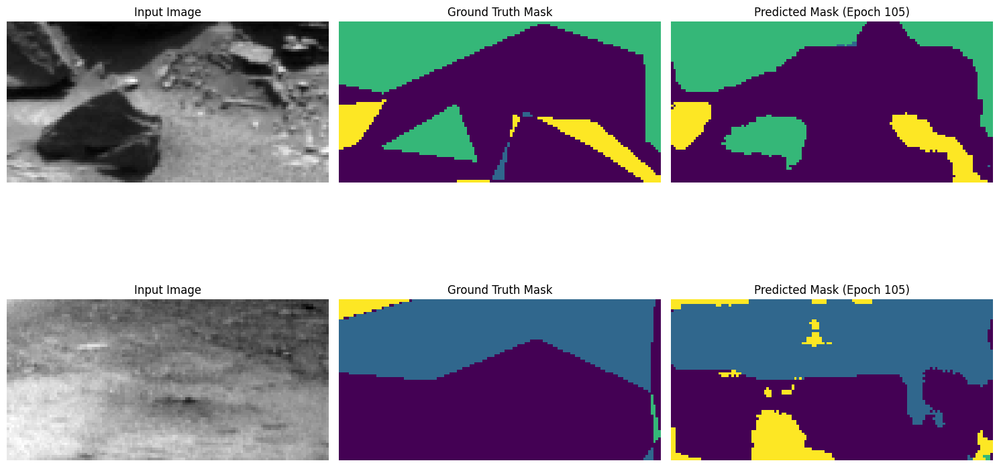

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9580 - loss: 0.6803 - learning_rate: 6.2500e-05
Epoch 106/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9592 - loss: 0.6803
Epoch 106: loss improved from 0.68066 to 0.68065, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


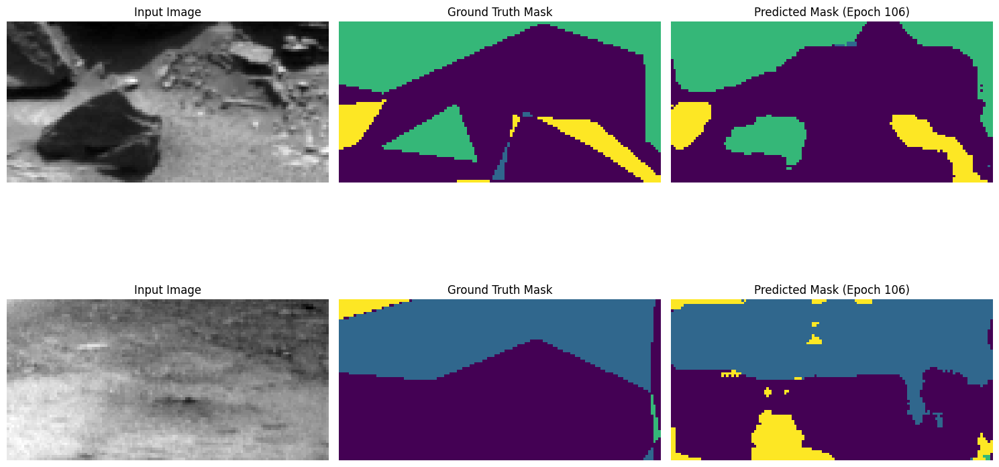

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 183ms/step - accuracy: 0.9593 - loss: 0.6803 - learning_rate: 6.2500e-05
Epoch 107/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9604 - loss: 0.6803
Epoch 107: loss improved from 0.68065 to 0.68063, saving model to best_model.keras

Epoch 107: ReduceLROnPlateau reducing learning rate to 3.125000148429535e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


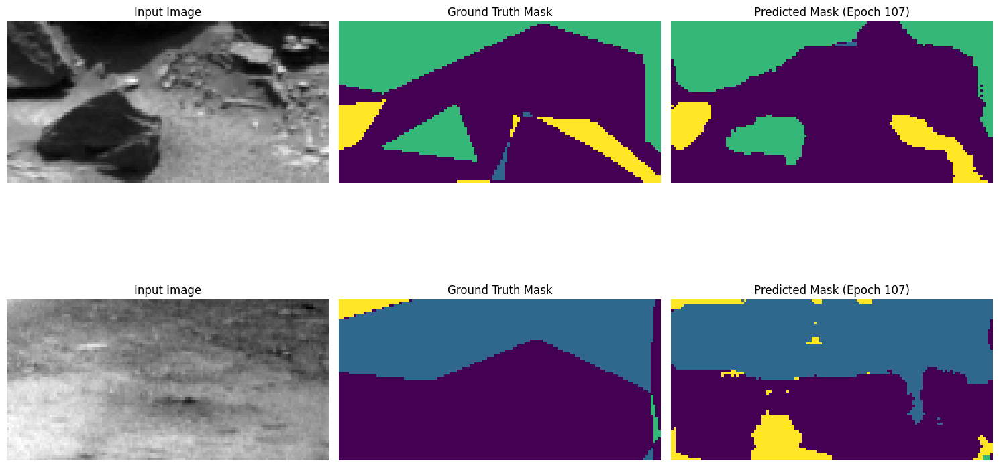

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.9604 - loss: 0.6803 - learning_rate: 6.2500e-05
Epoch 108/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9593 - loss: 0.6803
Epoch 108: loss did not improve from 0.68063
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


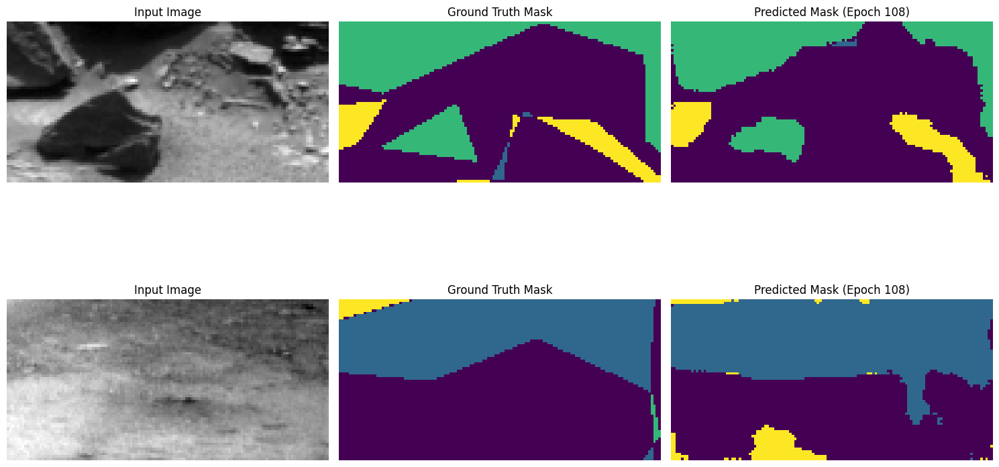

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 172ms/step - accuracy: 0.9593 - loss: 0.6803 - learning_rate: 3.1250e-05
Epoch 109/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9586 - loss: 0.6803
Epoch 109: loss did not improve from 0.68063
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


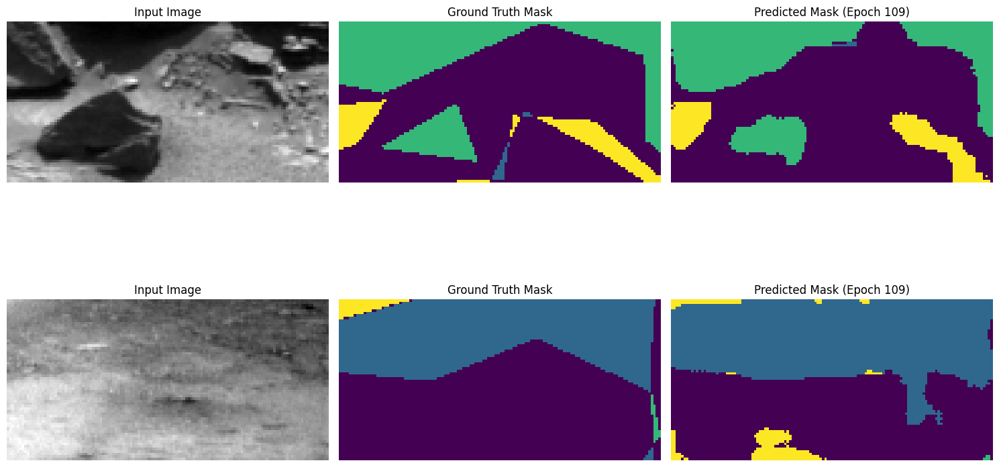

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 172ms/step - accuracy: 0.9586 - loss: 0.6803 - learning_rate: 3.1250e-05
Epoch 110/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9604 - loss: 0.6803
Epoch 110: loss did not improve from 0.68063
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


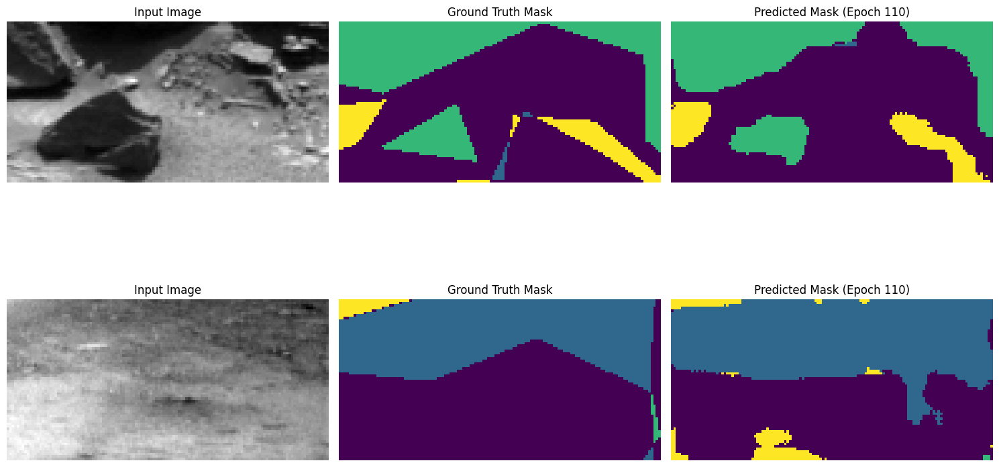

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 172ms/step - accuracy: 0.9604 - loss: 0.6803 - learning_rate: 3.1250e-05
Epoch 111/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9619 - loss: 0.6802
Epoch 111: loss improved from 0.68063 to 0.68062, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


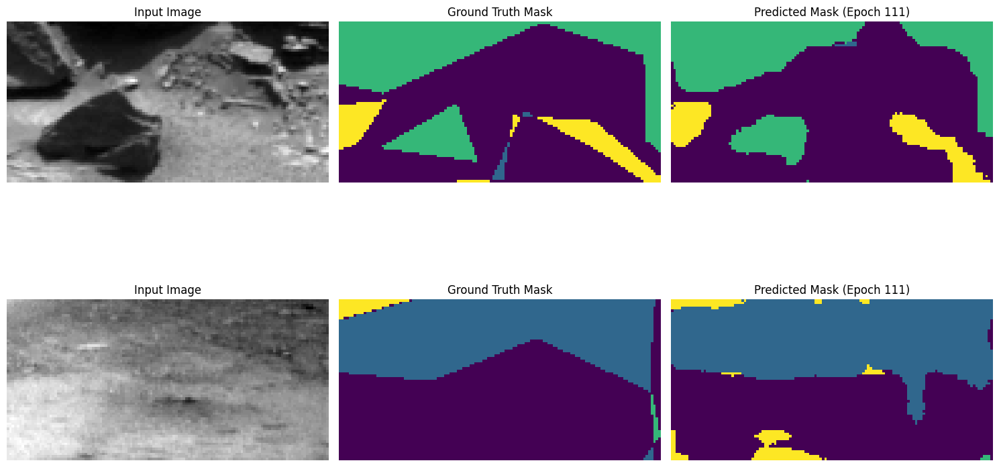

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 179ms/step - accuracy: 0.9619 - loss: 0.6803 - learning_rate: 3.1250e-05
Epoch 112/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9630 - loss: 0.6802
Epoch 112: loss improved from 0.68062 to 0.68060, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


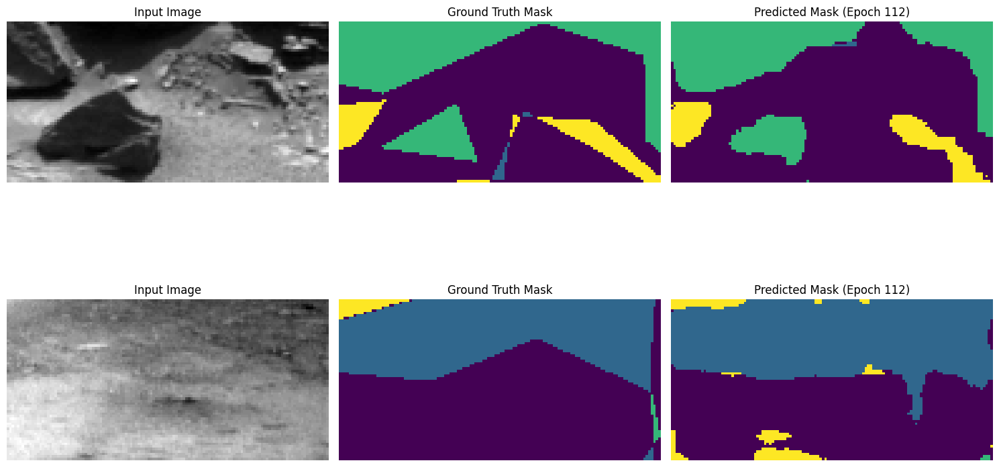

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.9631 - loss: 0.6802 - learning_rate: 3.1250e-05
Epoch 113/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9641 - loss: 0.6802
Epoch 113: loss improved from 0.68060 to 0.68059, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


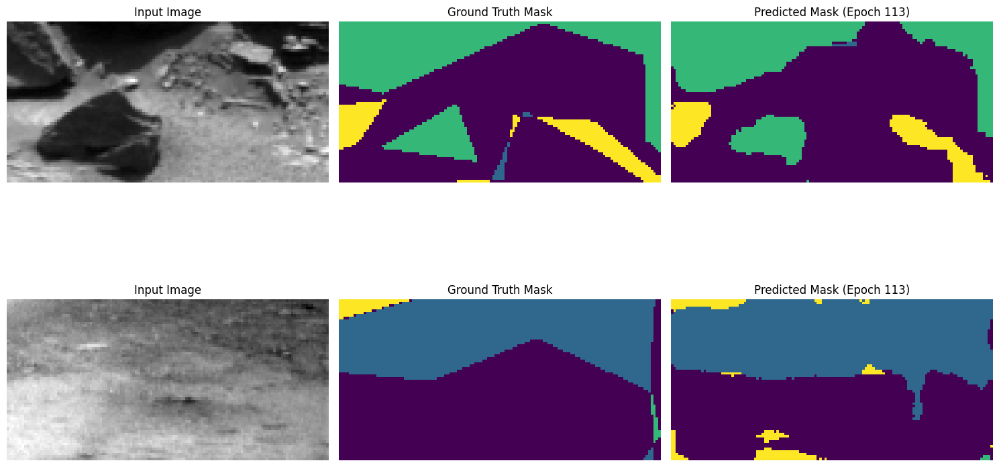

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9641 - loss: 0.6802 - learning_rate: 3.1250e-05
Epoch 114/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9650 - loss: 0.6802
Epoch 114: loss improved from 0.68059 to 0.68057, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


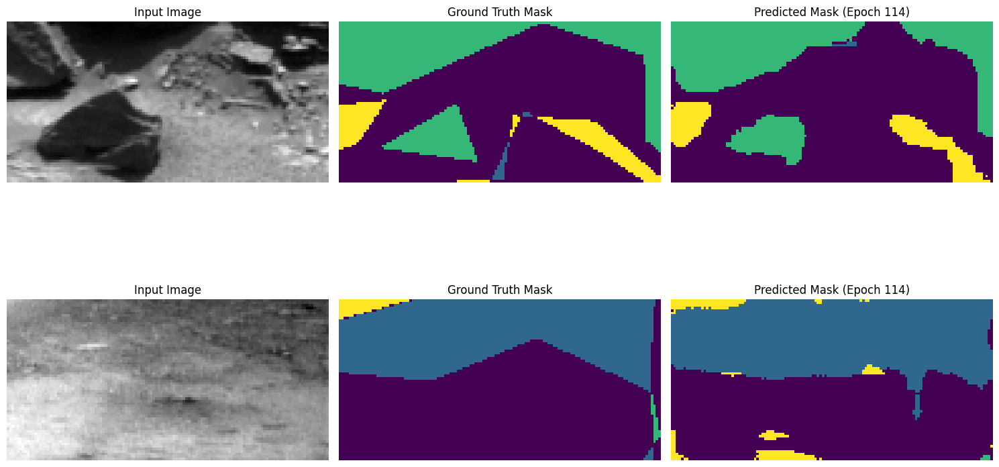

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.9650 - loss: 0.6802 - learning_rate: 3.1250e-05
Epoch 115/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9657 - loss: 0.6802
Epoch 115: loss improved from 0.68057 to 0.68056, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


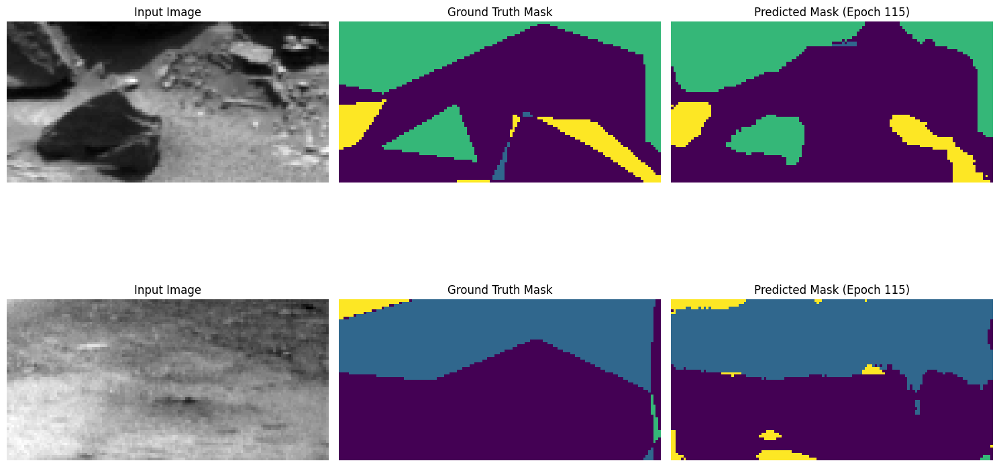

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9658 - loss: 0.6802 - learning_rate: 3.1250e-05
Epoch 116/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9665 - loss: 0.6802
Epoch 116: loss improved from 0.68056 to 0.68056, saving model to best_model.keras

Epoch 116: ReduceLROnPlateau reducing learning rate to 1.5625000742147677e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


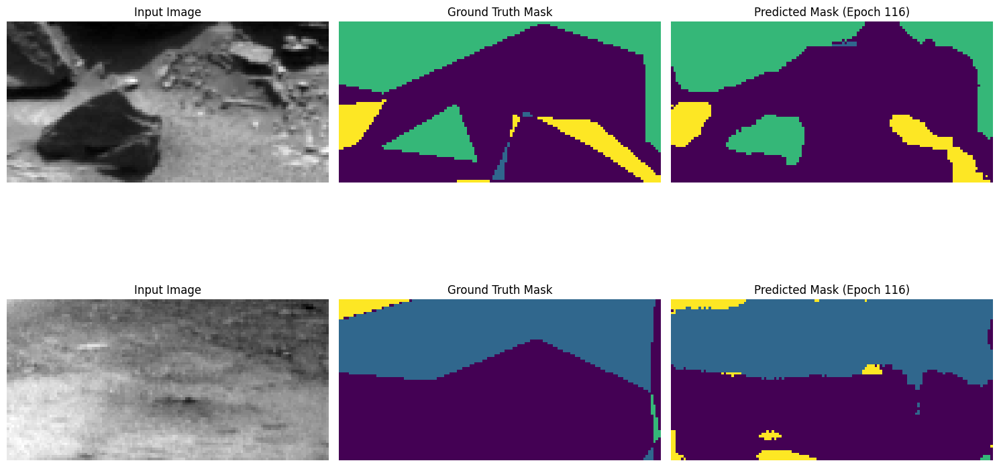

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.9665 - loss: 0.6802 - learning_rate: 3.1250e-05
Epoch 117/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9665 - loss: 0.6802
Epoch 117: loss did not improve from 0.68056
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


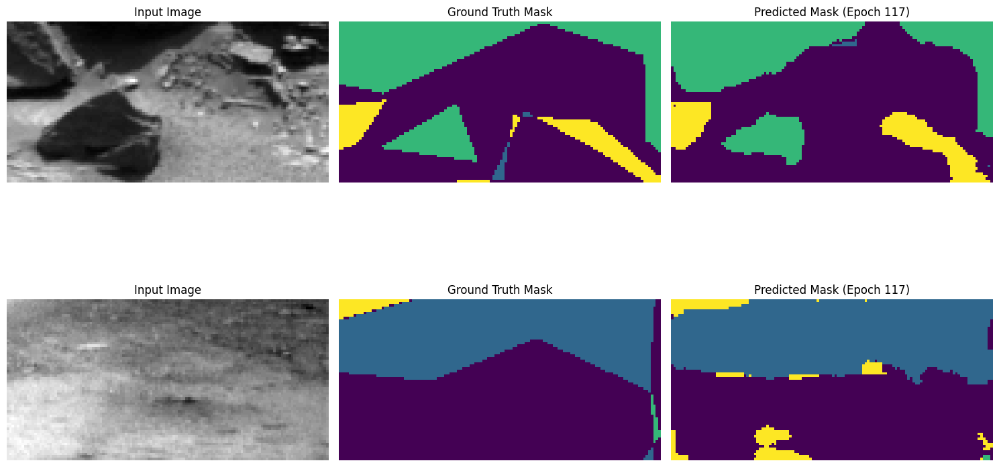

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.9665 - loss: 0.6802 - learning_rate: 1.5625e-05
Epoch 118/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9664 - loss: 0.6802
Epoch 118: loss improved from 0.68056 to 0.68055, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


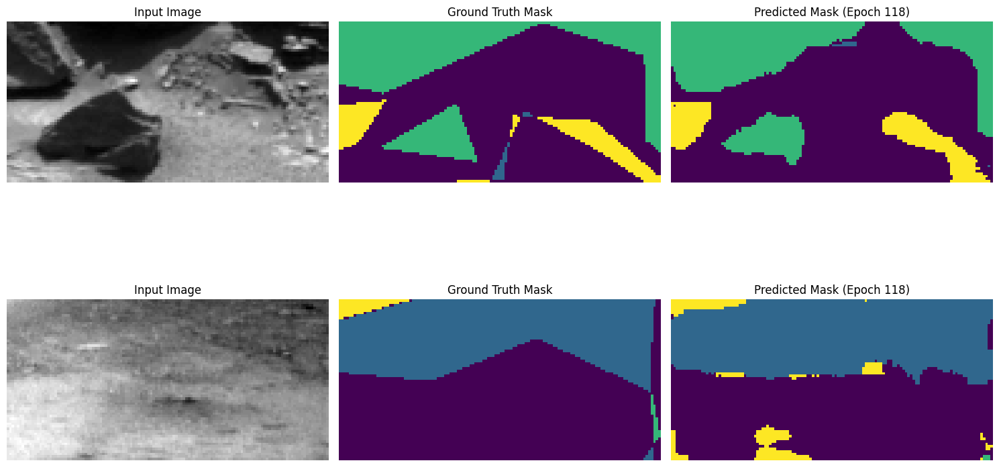

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.9664 - loss: 0.6802 - learning_rate: 1.5625e-05
Epoch 119/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9669 - loss: 0.6802
Epoch 119: loss improved from 0.68055 to 0.68055, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


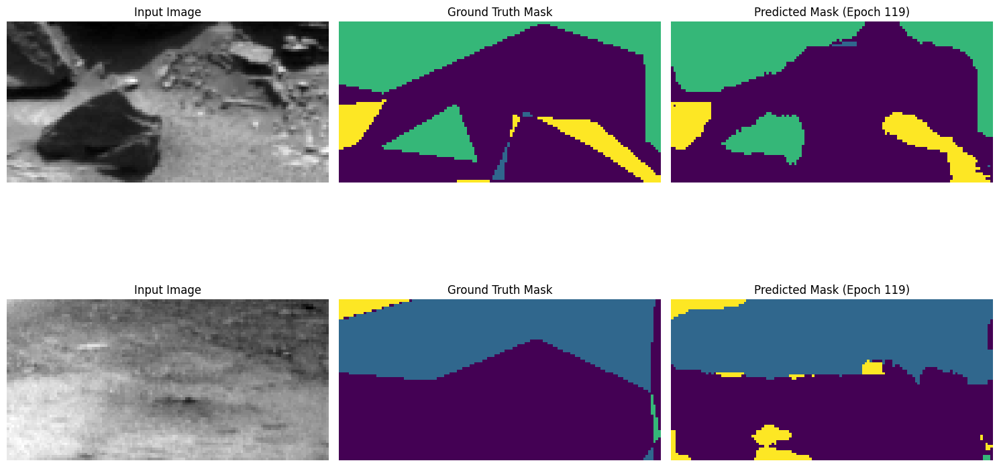

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9669 - loss: 0.6802 - learning_rate: 1.5625e-05
Epoch 120/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9674 - loss: 0.6802
Epoch 120: loss improved from 0.68055 to 0.68054, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


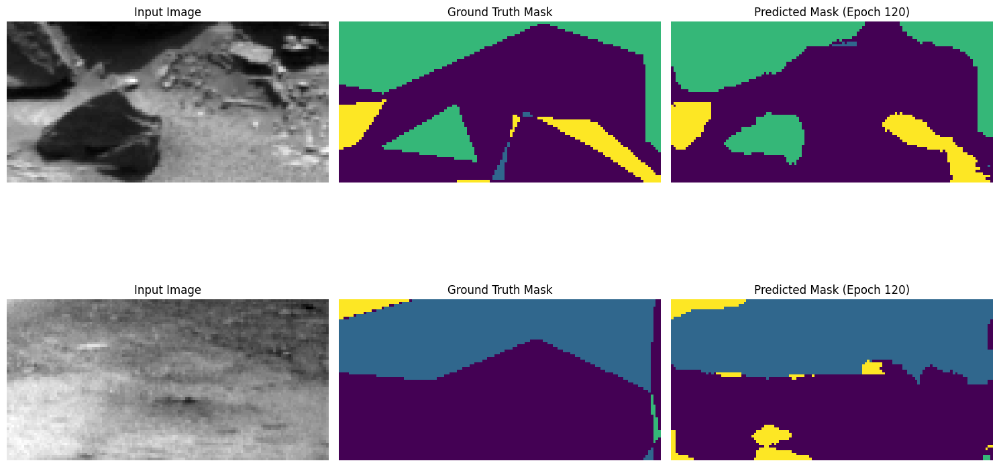

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9674 - loss: 0.6802 - learning_rate: 1.5625e-05
Epoch 121/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9678 - loss: 0.6802
Epoch 121: loss improved from 0.68054 to 0.68054, saving model to best_model.keras

Epoch 121: ReduceLROnPlateau reducing learning rate to 7.812500371073838e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


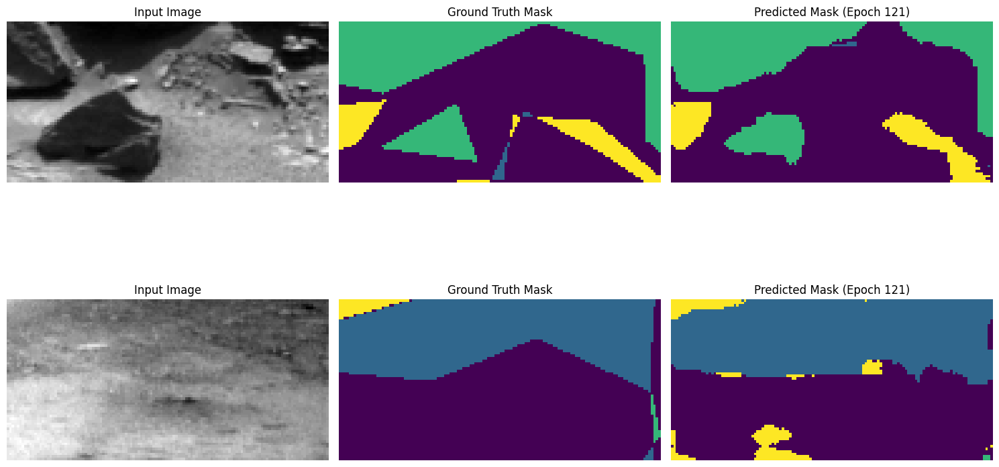

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9678 - loss: 0.6802 - learning_rate: 1.5625e-05
Epoch 122/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9678 - loss: 0.6802
Epoch 122: loss improved from 0.68054 to 0.68053, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


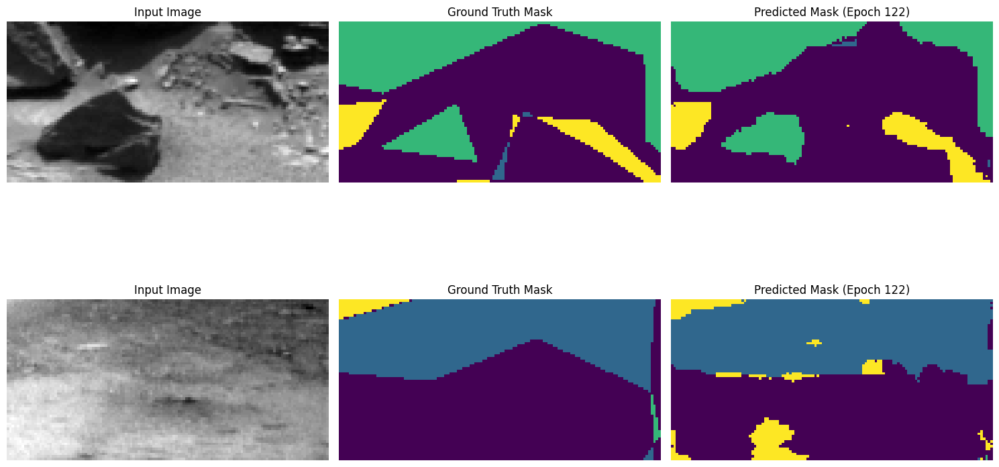

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9678 - loss: 0.6802 - learning_rate: 7.8125e-06
Epoch 123/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9677 - loss: 0.6802
Epoch 123: loss improved from 0.68053 to 0.68053, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


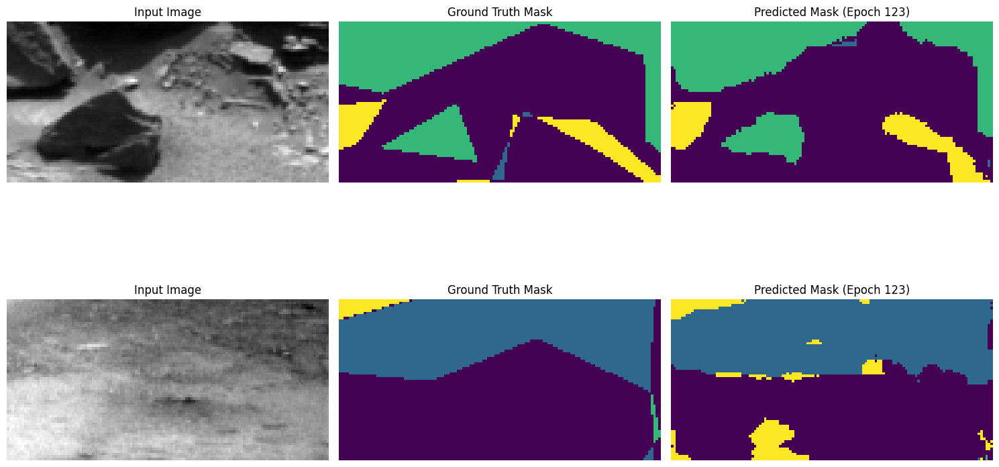

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9677 - loss: 0.6802 - learning_rate: 7.8125e-06
Epoch 124/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9681 - loss: 0.6802
Epoch 124: loss improved from 0.68053 to 0.68053, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


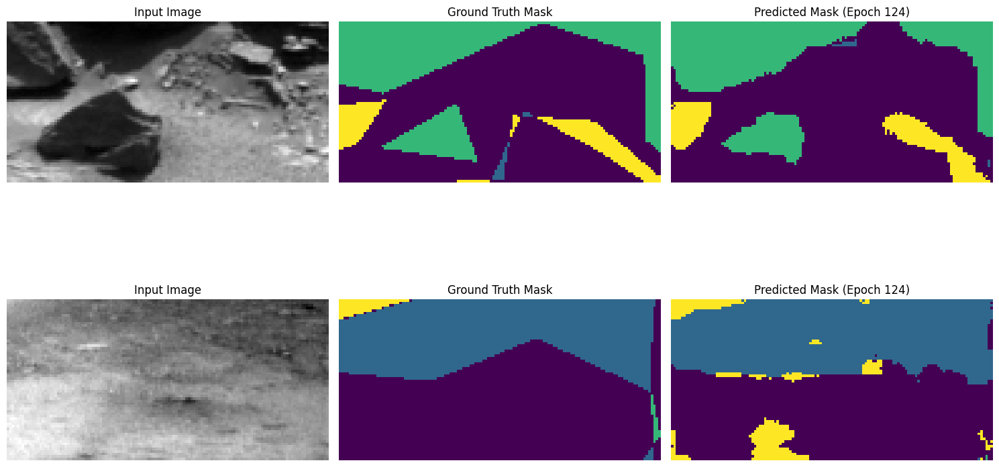

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 178ms/step - accuracy: 0.9681 - loss: 0.6802 - learning_rate: 7.8125e-06
Epoch 125/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9684 - loss: 0.6802
Epoch 125: loss improved from 0.68053 to 0.68052, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


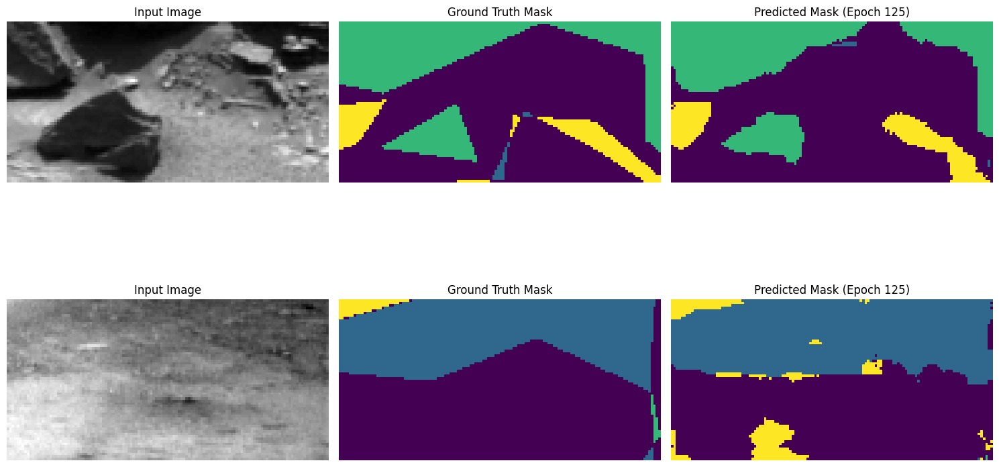

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.9684 - loss: 0.6802 - learning_rate: 7.8125e-06
Epoch 126/1000
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9687 - loss: 0.6801
Epoch 126: loss improved from 0.68052 to 0.68052, saving model to best_model.keras

Epoch 126: ReduceLROnPlateau reducing learning rate to 3.906250185536919e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


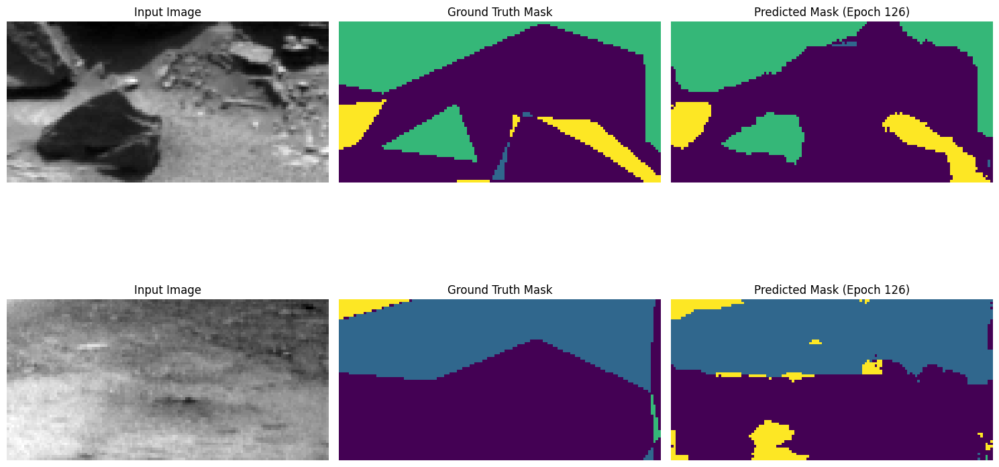

79/79 ━━━━━━━━━━━━━━━━━━━━ 14s 177ms/step - accuracy: 0.9687 - loss: 0.6802 - learning_rate: 7.8125e-06


In [29]:
import tensorflow as tf
from tensorflow.keras import layers as tfkl

# Residual Block
def residual_block(x, filters):
    shortcut = x
    x = tfkl.Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    x = tfkl.Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    shortcut = tfkl.Conv2D(filters, (1, 1), padding='same')(shortcut)
    return tfkl.add([x, shortcut])

# Dice Loss
def dice_loss(y_true, y_pred):
    numerator = 2 * tf.reduce_sum(y_true * y_pred, axis=(1, 2, 3))
    denominator = tf.reduce_sum(y_true + y_pred, axis=(1, 2, 3))
    # Calculate Dice loss per image in the batch
    dice_loss_per_image = 1 - numerator / (denominator + tf.keras.backend.epsilon())
    # Return the mean Dice loss across the batch
    return tf.reduce_mean(dice_loss_per_image)

# Hybrid Loss Function
def combined_loss(weights):
    ce_loss = weighted_categorical_crossentropy(weights)
    def loss(y_true, y_pred):
        # Calculate losses
        ce_loss_value = ce_loss(y_true, y_pred)
        dice_loss_value = dice_loss(y_true, y_pred)
        # Return the sum of the two losses
        return ce_loss_value + dice_loss_value
    return loss

# U-Net with Residual Connections
def unet_with_residual_blocks(input_shape, num_classes):
    inputs = tfkl.Input(input_shape)

    # Encoder
    c1 = residual_block(inputs, 64)
    p1 = tfkl.MaxPooling2D((2, 2))(c1)

    c2 = residual_block(p1, 128)
    p2 = tfkl.MaxPooling2D((2, 2))(c2)

    c3 = residual_block(p2, 256)
    p3 = tfkl.MaxPooling2D((2, 2))(c3)

    c4 = residual_block(p3, 512)

    # Decoder
    u1 = tfkl.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c4)
    u1 = tfkl.concatenate([u1, c3])
    d1 = residual_block(u1, 256)

    u2 = tfkl.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(d1)
    u2 = tfkl.concatenate([u2, c2])
    d2 = residual_block(u2, 128)

    u3 = tfkl.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(d2)
    u3 = tfkl.concatenate([u3, c1])
    d3 = residual_block(u3, 64)

    outputs = tfkl.Conv2D(num_classes, (1, 1), activation='softmax')(d3)

    return tf.keras.Model(inputs, outputs)

# Initialize the model
input_shape = X_train.shape[1:]
loss = combined_loss(class_weights)
model = unet_with_residual_blocks(input_shape, num_classes)
model.compile(optimizer="adam", loss=loss, metrics=["accuracy"])

model.summary()

# Training the model
history = model.fit(
    X_train,
    y_train,
    epochs=1000,
    callbacks=[early_stopping, model_checkpoint, reduce_lr, visualize_callback]
)

# Save the model
model.save("best_model_resunet.keras")

In [30]:
model_filename = f"model_unet_modified.keras"
model.save(model_filename)

print(f"Model saved to {model_filename}")

Model saved to model_unet_modified.keras


## 📊 Prepare Your Submission

In our Kaggle competition, submissions are made as `csv` files. To create a proper `csv` file, you need to flatten your predictions and include an `id` column as the first column of your dataframe. To maintain consistency between your results and our solution, please avoid shuffling the test set. The code below demonstrates how to prepare the `csv` file from your model predictions.



In [31]:
import os
# If model_filename is not defined, load the most recent model from Google Drive
if "model_filename" not in globals() or model_filename is None:
    files = [f for f in os.listdir('.') if os.path.isfile(f) and f.startswith('model_') and f.endswith('.keras')]
    files.sort(key=lambda x: os.path.getmtime(x), reverse=True)
    if files:
        model_filename = files[0]
    else:
        raise FileNotFoundError("No model files found in the current directory.")

In [32]:
print(f"X_test shape before reshaping: {X_test.shape}")

X_test shape before reshaping: (10022, 64, 128, 1)


In [33]:
# Generate predictions
preds = model.predict(X_test)
preds = np.argmax(preds, axis=-1)  # Convert probabilities to class labels
print(f"Predictions shape: {preds.shape}")

314/314 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step
Predictions shape: (10022, 64, 128)


In [34]:
model.save("model_resunet.keras")

Randomly selected indices for prediction (seed=42): [3543 5731 4801  416 5125 9915  293 5020 1765 4192 2288 1188  107 7583
  856 5090 9784 5192 6935  850]


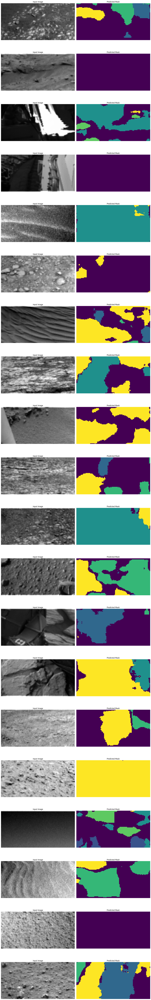

In [35]:
import numpy as np
import matplotlib.pyplot as plt

# Set random seed for reproducibility
np.random.seed(42)
# Randomly select 20 indices for prediction
random_indices = np.random.choice(X_test.shape[0], size=20, replace=False)
print(f"Randomly selected indices for prediction (seed=42): {random_indices}")

# Select 20 random samples and their corresponding masks
X_sample = X_test[random_indices]



predicted_masks = preds

# Visualize the predictions
num_images = len(X_sample)  # Number of images to visualize
fig, axes = plt.subplots(num_images, 2, figsize=(15, num_images * 5))

for i in range(num_images):
    # Original Image
    ax_img = axes[i, 0]
    ax_img.imshow(X_sample[i].squeeze(), cmap="gray")
    ax_img.set_title("Input Image")
    ax_img.axis("off")

    # Predicted Mask
    ax_pred = axes[i, 1]
    ax_pred.imshow(predicted_masks[i], cmap="viridis")
    ax_pred.set_title("Predicted Mask")
    ax_pred.axis("off")

plt.tight_layout()
plt.show()

In [36]:
def y_to_df(y) -> pd.DataFrame:
    """Converts segmentation predictions into a DataFrame format for Kaggle."""
    n_samples = len(y)
    y_flat = y.reshape(n_samples, -1)
    df = pd.DataFrame(y_flat)
    df["id"] = np.arange(n_samples)
    cols = ["id"] + [col for col in df.columns if col != "id"]
    return df[cols]

In [37]:
# Create and download the csv submission file
timestep_str = model_filename.replace("model_", "").replace(".keras", "")
submission_filename = f"submission_{timestep_str}.csv"
submission_df = y_to_df(preds)
submission_df.to_csv(submission_filename, index=False)

from google.colab import files
files.download(submission_filename)

ModuleNotFoundError: No module named 'google.colab'

In [ ]:
len(submission_df.columns)

In [ ]:
len(submission_df)